# Pryngles Tutorials: Developers

This notebook illustrate in detail the interface of the `Pryngles` package. It is especially intended for developers.

Authors:
- Jorge I. Zuluaga, [jorge.zuluaga@udea.edu.co](mailto:jorge.zuluaga@udea.edu.co)

Warnings:
- This file was prepared using version 0.7.3.1 of `Pryngles`.
- Matplotlib commands run in version 3.5.2.

<center><font color='red' size='8'><i>This tutorial is under construction.</i></font></center>

## Preparation

Before running this tutorial you need to install `Pryngles`:

In [1]:
#!python -m pip install -qU pryngles
#!pip show pryngles

If you are running this tutrial in `Google Colab` please run the following lines:

In [2]:
"""
import matplotlib.pyplot as plt
RESOLUTION = 150
%matplotlib inline
plt.rcParams['figure.dpi'] = RESOLUTION
# Sometimes you need to run twice this magic to be sure the backend is loaded
%matplotlib inline
#""";

## Import useful packages

In [3]:
%load_ext autoreload
%autoreload 2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

Although it is not a good practice to import everything of a package, for this tutorial and to avoid excesively large names we will import everything from Pryngles:

In [4]:
from pryngles import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Structure of the package

`Pryngles` is a highly modular package divided in modules and datafiles.  At designing the package we have followed the rule or convention of creating for each module a `Class` with the name of the module. Thus for instance, the module `plot` contains a general purpose class `Plot` containing routines intended for plotting purposes, eg. `Plot.pryngles_mark()`.

`Pryngles` has two type of modules: 

- **General modules**: These modules contain *static classes*, i.e. classes that cannot be instantiated and their methods work as regular functions.  Example:

  ```python
     
     #Definition
     class Foo(object):
        def test(x):
            return not x

     #Usage
     Foo(True)
  ```
  
- **Core modules**: These are the key modules in the package.  They contain regular classes and perform the most specialized functions in the package.

Pryngles has the following **general modules**:

- `consts`: Constants and other methods associated to them.
- `util`: Util and miscellaneous routines.
- `plot`: Plotting methods and other miscelaneous routines.
- `science`: Classes and methods involving useful scientific calculations.

The most important modules, the **core modules**, implementing the core functionalities in the package are:

- `sampler`: Module containing the classes and methods to generate sample of points.
- `spangler`: Classes and methods to spangle bodies.
- `body`: Classes and methods used to create and spangle astrophysical bodies.
- `system`: This is the most important module.  It contains the classes and methods use to define a planetary system, spangle it and calculate light-curves.
- `legacy`: This module contains all the classes and routines of the legacy `RingedPlanet` interface to Pryngles.  This interface will be deprecated in version 2.0.

In this tutorial we will offer a detailed guide to each module.

## General modules

### Constants (`consts`)

The `Consts` class contains all the constants defined in `Pryngles`.  There are two types of constants in Pryngles: `physical` and `numerical`.  The `physical` constants are values of physical and astronomical constants.  They are all under the static class `Consts`:

In [5]:
Consts.rsun

695700000.0

All physical constants are in SI units.  To get all physical constants use:

In [6]:
print(Consts.get_physical())

['au', 'aus', 'cm', 'd', 'day', 'days', 'deg', 'g', 'gram', 'gyr', 'hr', 'jyr', 'kg', 'km', 'kyr', 'm', 'mearth', 'mjupiter', 'mmars', 'mmercury', 'mneptune', 'mpluto', 'msaturn', 'msolar', 'msun', 'muranus', 'mvenus', 'myr', 'parsec', 'pc', 'ppb', 'ppm', 'rad', 'rearth', 'rjupiter', 'rsaturn', 'rsun', 's', 'solarmass', 'sunmass', 'yr', 'yrs']


Most `physical` constants in `Pryngles` comes from `Rebound` package.

`numerical` constants are quantities used across the package:

In [7]:
print(Consts.get_all())

['BODY_DEFAULTS', 'BODY_KINDS', 'DEG', 'FILE', 'GSI', 'HTML', 'IN_JUPYTER', 'PLANET_COLOR', 'PLANET_DEFAULTS', 'RAD', 'REBOUND_ORBITAL_PROPERTIES', 'RING_COLOR', 'RING_DEFAULTS', 'ROOTDIR', 'SAMPLER_CIRCLE_PRESETS', 'SAMPLER_GEOMETRY_CIRCLE', 'SAMPLER_GEOMETRY_SPHERE', 'SAMPLER_MIN_RING', 'SAMPLER_PRESETS', 'SAMPLER_SPHERE_PRESETS', 'SAMPLE_SHAPES', 'SHADOW_COLOR', 'SHADOW_COLOR_OBS', 'SPANGLER_AREAS', 'SPANGLER_COLUMNS', 'SPANGLER_COLUMNS_DOC', 'SPANGLER_COL_COPY', 'SPANGLER_COL_INT', 'SPANGLER_COL_LUZ', 'SPANGLER_COL_OBS', 'SPANGLER_EPS_BORDER', 'SPANGLER_EQUIV_COL', 'SPANGLER_KEY_FIELDS', 'SPANGLER_LENGTHS', 'SPANGLER_SOURCE_STATES', 'SPANGLER_VECTORS', 'SPANGLER_VISIBILITY_STATES', 'SPANGLES_DARKNESS_COLOR', 'SPANGLES_SEMITRANSPARENT', 'SPANGLE_ATMOSPHERIC', 'SPANGLE_COLORS', 'SPANGLE_GASEOUS', 'SPANGLE_GRANULAR', 'SPANGLE_LIQUID', 'SPANGLE_SOLID_ICE', 'SPANGLE_SOLID_ROCK', 'SPANGLE_STELLAR', 'STAR_COLOR', 'STAR_DEFAULTS', 'VERB_ALL', 'VERB_DEEP', 'VERB_NONE', 'VERB_SIMPLE', 'VERB_

Normally numerical constants are grouped by modules or classes, for instance:  

In [8]:
print([const for const in Consts.get_all() if 'SPANGLER' in const])

['SPANGLER_AREAS', 'SPANGLER_COLUMNS', 'SPANGLER_COLUMNS_DOC', 'SPANGLER_COL_COPY', 'SPANGLER_COL_INT', 'SPANGLER_COL_LUZ', 'SPANGLER_COL_OBS', 'SPANGLER_EPS_BORDER', 'SPANGLER_EQUIV_COL', 'SPANGLER_KEY_FIELDS', 'SPANGLER_LENGTHS', 'SPANGLER_SOURCE_STATES', 'SPANGLER_VECTORS', 'SPANGLER_VISIBILITY_STATES']


Probably sometimes will be better if import the class `Consts` separately:

In [9]:
from pryngles import Consts as C
print(C.rad)

57.29577951308232


### Pryngles Common (`__init__`)

This is the class from which every class in Pryngles is a daughter.  It contains several basic methods, including a method to save or load an object.

Lets create an object:

In [10]:
p=PrynglesCommon()

Populate it:

In [11]:
p.casa=dict(perro=0,gato=3)
p.data=pd.DataFrame(np.random.rand(4000,100))

One of the common methods is `__str__`:

In [12]:
print(p)

{'casa': {'perro': 0, 'gato': 3}, 'data':             0         1         2         3         4         5         6   \
0     0.980982  0.825082  0.145894  0.623785  0.435375  0.624030  0.959904   
1     0.176105  0.203442  0.709994  0.716728  0.297332  0.269368  0.737480   
2     0.106995  0.217153  0.112517  0.170834  0.770811  0.582064  0.412581   
3     0.592628  0.839969  0.793476  0.673071  0.387183  0.722678  0.358417   
4     0.514800  0.264949  0.809075  0.047187  0.277483  0.463860  0.530092   
...        ...       ...       ...       ...       ...       ...       ...   
3995  0.164078  0.850567  0.232749  0.221873  0.354026  0.231122  0.179537   
3996  0.342639  0.330826  0.698041  0.695030  0.714870  0.672398  0.968951   
3997  0.568894  0.530549  0.274500  0.751694  0.028151  0.168929  0.673735   
3998  0.390013  0.466030  0.874512  0.062569  0.570251  0.990593  0.163076   
3999  0.422916  0.130073  0.928438  0.177406  0.558740  0.506662  0.181228   

            7        

Now we can pickle (pack) and save the object to disk:

In [13]:
p.save_to("/tmp/save.pck")

Let's check the file size

In [14]:
import os
print("File size:",os.path.getsize("/tmp/save.pck")/1e6," Mb")

File size: 3.200736  Mb


Now we can load the object from disk:

In [15]:
g=PrynglesCommon()
g.load_from("/tmp/save.pck")
print(g.casa,np.array(g.data).shape)

{'perro': 0, 'gato': 3} (4000, 100)


### Miscellaneous (`misc`)

Miscelaneous routines are useful routines used by the package.  The methods defined so far are:

In [16]:
Misc.get_methods(Misc)

['flatten', 'get_data', 'get_methods', 'print_df']

#### Function `flatten`

Flatten a list of objects

In [17]:
print(list(Misc.flatten(["cosa"])))
print(list(Misc.flatten([["cosa"]])))
print(list(Misc.flatten([["cosa","perro"]])))
print(list(Misc.flatten([[1,"perro"],object,float])))

['cosa']
['cosa']
['cosa', 'perro']
[1, 'perro', <class 'object'>, <class 'float'>]


#### Funcion `get_data`


One of the most important methods is the `get_data` method used to get the full path of a file contained in the data directory of the package:

In [18]:
data=Misc.get_data("diffuse_reflection_function.data")
!cat {data}

#Taken from Sobolev (1975), Tab. (2.3), pag. 33
-1  0.500 0.700 0.800 0.900 0.950 0.975 0.995 1.000
0.0 1.000 1.000 1.000 1.000 1.000 1.000 1.000 1.000
0.1 1.072 1.113 1.139 1.172 1.195 1.211 1.232 1.247
0.2 1.113 1.183 1.229 1.291 1.337 1.370 1.415 1.450
0.3 1.144 1.236 1.301 1.391 1.461 1.512 1.583 1.643
0.4 1.168 1.281 1.361 1.478 1.571 1.641 1.742 1.829
0.5 1.188 1.318 1.413 1.556 1.672 1.762 1.895 2.013
0.6 1.204 1.350 1.459 1.626 1.765 1.875 2.042 2.194
0.7 1.219 1.378 1.500 1.689 1.851 1.982 2.184 2.374
0.8 1.231 1.403 1.536 1.747 1.931 2.083 2.322 2.553
0.9 1.242 1.453 1.568 1.801 2.007 2.178 2.456 2.731
1.0 1.251 1.445 1.598 1.850 2.077 2.271 2.587 2.908


Some of the most important routines in `Pryngles` deal with DataFrames.  The routine `print_df` is intended to print DataFrames:

#### Funcition `print_df`

In [19]:
df=pd.DataFrame(np.zeros((4,100)))
Misc.print_df(df)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


This version is even better than the previsualization of DataFrames in Jupyter.  You may even show a small part

In [20]:
Misc.print_df(df.head(2))

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Or get a description of the DataFrame:

In [21]:
Misc.print_df(df.describe())

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
count,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0
mean,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Verbosity (`__init__`)

Some routines in the code has optional messages (debugging messagess) that can be displayed using a property of the `Verbose` class.

Debbuging messages use the following routine:

In [22]:
Verbose.VERBOSITY=0
Verbose.print(0,"Hello world")

VERB0::<module>:: Hello world


You may enable verbosity messages using:

In [23]:
Verbose.VERBOSITY=1
Verbose.print(1,"Hello world")

  VERB1::<module>:: Hello world


Let's leave verbosity to minimum:

In [24]:
Verbose.VERBOSITY=0

### Science ( `science`)

The class `Science` contains useful scientific routines:

In [25]:
Misc.get_methods(Science)

['LIMB_NORMALIZATIONS',
 'Plane',
 'cartesian',
 'cospherical',
 'direction',
 'get_convexhull',
 'limb_darkening',
 'load_from',
 'pcylindrical',
 'points_in_hull',
 'rotation_matrix',
 'save_to',
 'spherical']

#### Class `Plane`:

A plane in 3d

In [26]:
#Test plane
p1=[-1,2,1]
p2=[0,-3,2]
p3=[1,1,-4]
plane=Science.Plane(p1,p2,p3)
print(plane)

{'a': 26, 'b': 7, 'c': 9, 'd': 3, 'p1x': -1, 'p1y': 2, 'p1z': 1, 'p2x': 0, 'p2y': -3, 'p2z': 2, 'p3x': 1, 'p3y': 1, 'p3z': -4, 'normal': 28.39013913315678, 'nx': 0.915810939779251, 'ny': 0.2465644837867214, 'nz': 0.3170114791543561}


Check if point is above with respect to a direction

In [27]:
p=[2,2,5]
print("Is above: ",plane.is_above(p,[0,0,-1]))

Is above:  False


Get plane projection:

In [28]:
v,dist=plane.get_projection(p)
print(f"Projection: {v}, distance: {dist}")

Projection: [-1.67741935483871, 1.0099255583126552, 3.727047146401985], distance: 4.015478735955178


Plot plane:

<IPython.core.display.Javascript object>


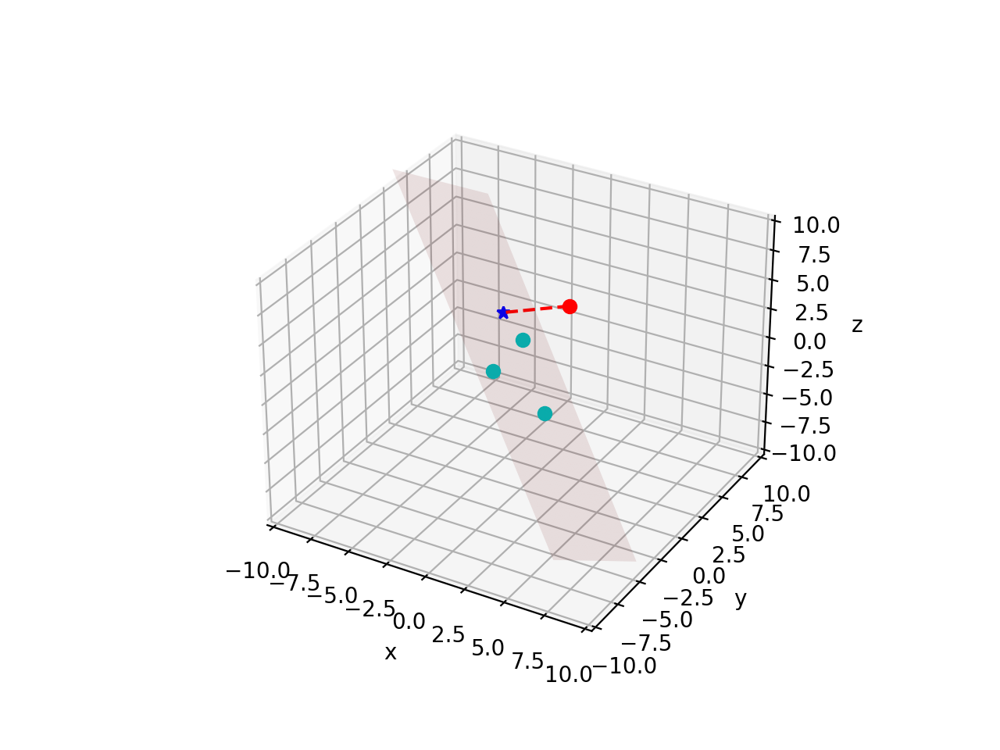

In [29]:
plane.plot_plane(p=p,alpha=0.1,color='r')

#### Coordinates transformation

From cartesian to spherical:

In [30]:
#Test axis
axis=[
    [+1,+0,+0],[-1,+0,+0],
    [+0,+1,+0],[+0,-1,+0],
    [+0,+0,+1],[+0,+0,-1],
]
for i,xyz in enumerate(axis):
    rqf=Science.spherical(xyz)
    cqsqsf=Science.cospherical(xyz)
    rhofct=Science.pcylindrical(xyz)
    print(f"Axis {i+1}:")
    print("\tSpherical:",rqf[0],rqf[1]*Consts.rad,rqf[2]*Consts.rad)
    print("\tCospherical:",cqsqsf)
    print("\tVerify:",mh.cos(rqf[1]),mh.sin(rqf[1]),mh.sin(rqf[2]))
    print("\tPseudo cilyndrical:",rhofct)
    print("\tVerify:",rqf[0]*np.cos(rqf[2]),rqf[1],mh.sin(rqf[2]))

Axis 1:
	Spherical: 1.0 0.0 0.0
	Cospherical: [1. 0. 0.]
	Verify: 1.0 0.0 0.0
	Pseudo cilyndrical: [1.         6.28318531 0.        ]
	Verify: 1.0 0.0 0.0
Axis 2:
	Spherical: 1.0 180.0 0.0
	Cospherical: [-1.  0.  0.]
	Verify: -1.0 1.2246467991473532e-16 0.0
	Pseudo cilyndrical: [1.         3.14159265 0.        ]
	Verify: 1.0 3.141592653589793 0.0
Axis 3:
	Spherical: 1.0 90.0 0.0
	Cospherical: [0. 1. 0.]
	Verify: 6.123233995736766e-17 1.0 0.0
	Pseudo cilyndrical: [1.         1.57079633 0.        ]
	Verify: 1.0 1.5707963267948966 0.0
Axis 4:
	Spherical: 1.0 270.0 0.0
	Cospherical: [ 0. -1.  0.]
	Verify: -1.8369701987210297e-16 -1.0 0.0
	Pseudo cilyndrical: [1.         4.71238898 0.        ]
	Verify: 1.0 4.71238898038469 0.0
Axis 5:
	Spherical: 1.0 0.0 90.0
	Cospherical: [1. 0. 1.]
	Verify: 1.0 0.0 1.0
	Pseudo cilyndrical: [0.         6.28318531 1.        ]
	Verify: 6.123233995736766e-17 0.0 1.0
Axis 6:
	Spherical: 1.0 0.0 -90.0
	Cospherical: [ 1.  0. -1.]
	Verify: 1.0 0.0 -1.0
	Pseudo ci

From spherical to cartesian:

In [31]:
octants=[
    [1,45*Consts.deg,45*Consts.deg],[1,135*Consts.deg,45*Consts.deg],
    [1,225*Consts.deg,45*Consts.deg],[1,315*Consts.deg,45*Consts.deg],
    [1,45*Consts.deg,-45*Consts.deg],[1,135*Consts.deg,-45*Consts.deg],
    [1,225*Consts.deg,-45*Consts.deg],[1,315*Consts.deg,-45*Consts.deg]
]
for i,rqf in enumerate(octants):
    xyz=Science.cartesian(rqf)
    print(f"Octant {i+1}:",xyz) 

Octant 1: [0.5        0.5        0.70710678]
Octant 2: [-0.5         0.5         0.70710678]
Octant 3: [-0.5        -0.5         0.70710678]
Octant 4: [ 0.5        -0.5         0.70710678]
Octant 5: [ 0.5         0.5        -0.70710678]
Octant 6: [-0.5         0.5        -0.70710678]
Octant 7: [-0.5        -0.5        -0.70710678]
Octant 8: [ 0.5        -0.5        -0.70710678]


In order to ease transformation from direction to cartesian we have defined the `direction` routine:

In [32]:
#Unitary vector in the direction long = 30, lat = 60
Science.direction(30,60)

array([0.4330127, 0.25     , 0.8660254])

And the inverse:

In [33]:
Science.direction(1,1,0)

(45.0, 0.0)

#### Method `rotation_matrix`

Compute rotation matrices starting from the direction of the z-axis and a roll in the x-y plane:

In [34]:
#Test rotation
Msys2uni,Muni2sys=Science.rotation_matrix([0,0,1],0)
print(Msys2uni)

Msys2uni,Muni2sys=Science.rotation_matrix([0,0,-1],0)
print(Msys2uni)

[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
[[-1.  0.  0.]
 [ 0.  1.  0.]
 [ 0.  0. -1.]]


#### Method `limb_darkening`

This routine can calculate the value of a limb-darkened surface up until fourth-order:

<IPython.core.display.Javascript object>


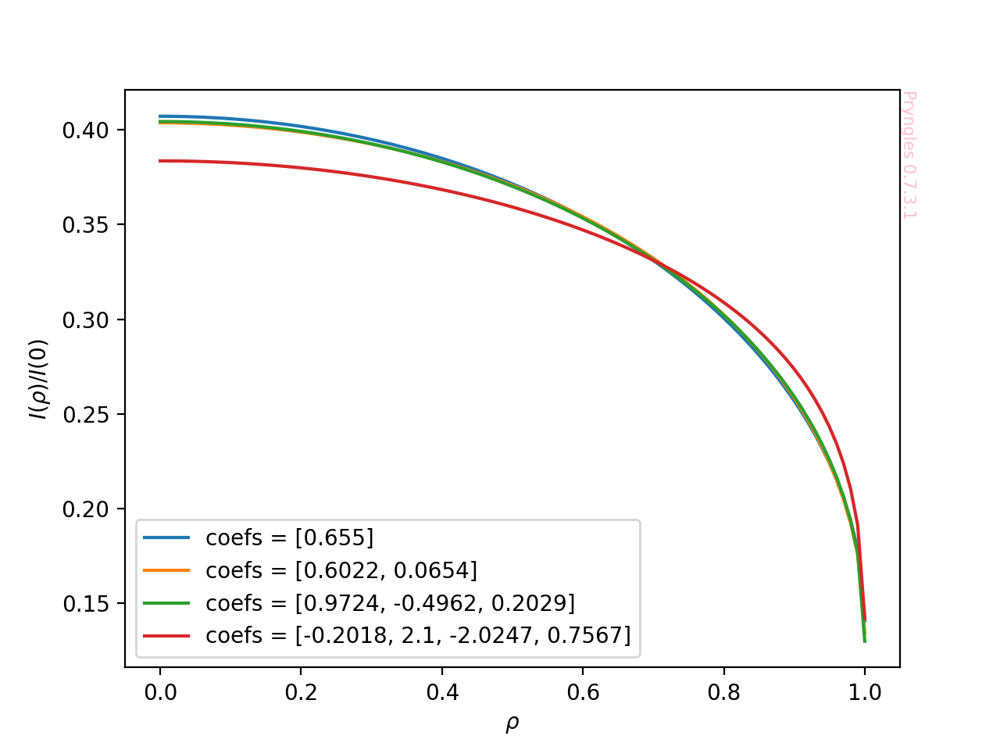

      VERB3::limb_darkening:: Normalization of limb darkening function for cs = [0.655], N = 2.45567825755602
      VERB3::limb_darkening:: Normalization of limb darkening function for cs = [0.6022, 0.0654], N = 2.4767269283350704
      VERB3::limb_darkening:: Normalization of limb darkening function for cs = [0.9724, -0.4962, 0.2029], N = 2.472665297844586
      VERB3::limb_darkening:: Normalization of limb darkening function for cs = [-0.2018, 2.1, -2.0247, 0.7567], N = 2.6067005991229735


In [35]:
Verbose.VERBOSITY=VERB_ALL
fig=plt.figure()
ax=fig.gca()

rhos=np.linspace(0,1,100)
coefs=[0.6550]
ax.plot(rhos,Science.limb_darkening(rhos,coefs),label=f"coefs = {coefs}")
coefs=[0.6022,0.0654]
ax.plot(rhos,Science.limb_darkening(rhos,coefs),label=f"coefs = {coefs}")
coefs=[0.9724,-0.4962,0.2029]
ax.plot(rhos,Science.limb_darkening(rhos,coefs),label=f"coefs = {coefs}")    
coefs=[-0.2018,2.1000,-2.0247,0.7567]
ax.plot(rhos,Science.limb_darkening(rhos,coefs),label=f"coefs = {coefs}")
ax.legend()
ax.set_xlabel(r"$\rho$")
ax.set_ylabel(r"$I(\rho)/I(0)$")
Plot.pryngles_mark(ax);
Verbose.VERBOSITY=VERB_NONE

Normalizations for each coefficient set is stored at:

In [36]:
Science.LIMB_NORMALIZATIONS

{-8145817878717057878: 2.45567825755602,
 6394508155116276254: 2.4767269283350704,
 5730772039920043893: 2.472665297844586,
 1260437475972070811: 2.6067005991229735}

#### Routine `convex_hull`

Convex hulls are fundamental geometrical entitie to compute the intersection between objects in Pryngles.  These are the basic routines required:

30 30


<IPython.core.display.Javascript object>


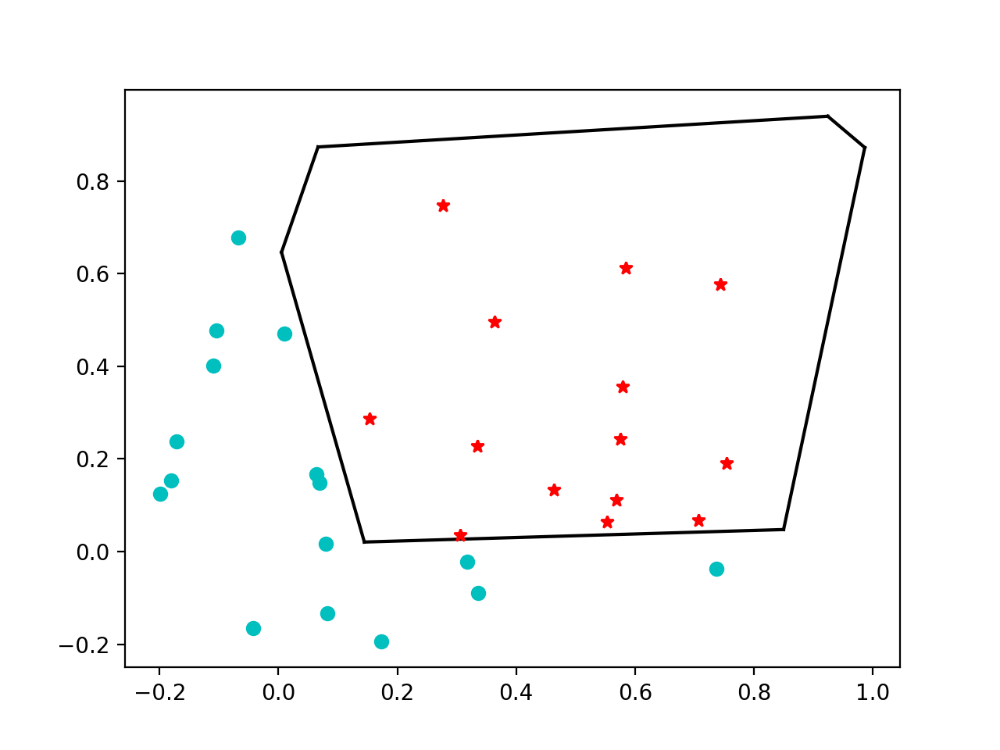

In [37]:
rng = np.random.default_rng()
points = rng.random((30, 2))

#Given a set of points calculate the convex hull containing them
hull = Science.get_convexhull(points)

ps = rng.random((30, 2))-0.2

#Determine which points are inside the convex hull
cond=Science.points_in_hull(ps,hull)

print(len(cond),len(ps))

import matplotlib.pyplot as plt
plt.figure()
for simplex in hull.simplices:
    plt.plot(points[simplex, 0], points[simplex, 1], 'k-')

for p in ps[cond]:
    plt.plot(p[0],p[1],'r*')

for p in ps[~cond]:
    plt.plot(p[0],p[1],'co')

### Plotting routines (`plot`)

The class `Plot` contains useful plotting routines:

In [38]:
Misc.get_methods(Plot)

['_pathpatch_2d_to_3d',
 'animate_rebound',
 'calc_flyby',
 'circle3d',
 'draw_pryngles',
 'pryngles_mark',
 'rgb',
 'rgb_sample']

#### Method `circle3d` and `pryngles_mark`

In order to plot spangles you may use:

<IPython.core.display.Javascript object>


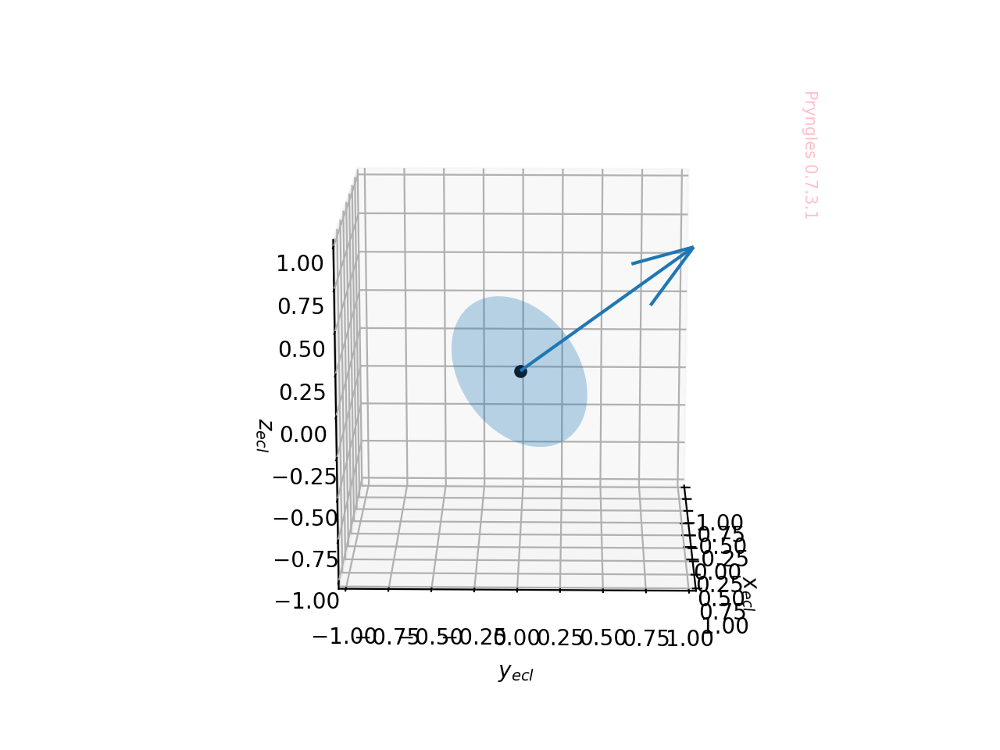

In [39]:
fig=plt.figure()
ax=fig.add_subplot(111,projection='3d')
ax.plot([0],[0],[0],'ko',markersize=5)

#This is a routine to plot a spangle
normal=[1,1,1]
Plot.circle3d(ax,(0,0,0),0.5,zDir=normal,fill='None',alpha=0.3)


ax.quiver(0,0,0,normal[0],normal[1],normal[2])
#Decoration
ax.set_xlim(-1,1)
ax.set_ylim(-1,1)
ax.set_zlim(-1,1)
ax.set_box_aspect([1,1,1])
ax.set_xlabel("$x_{ecl}$")
ax.set_ylabel("$y_{ecl}$")
ax.set_zlabel("$z_{ecl}$")
ax.view_init(elev=15,azim=1)
Plot.pryngles_mark(ax);

#### Method `draw_pryngles`

The logo of Pryngles can be generated with:

<IPython.core.display.Javascript object>


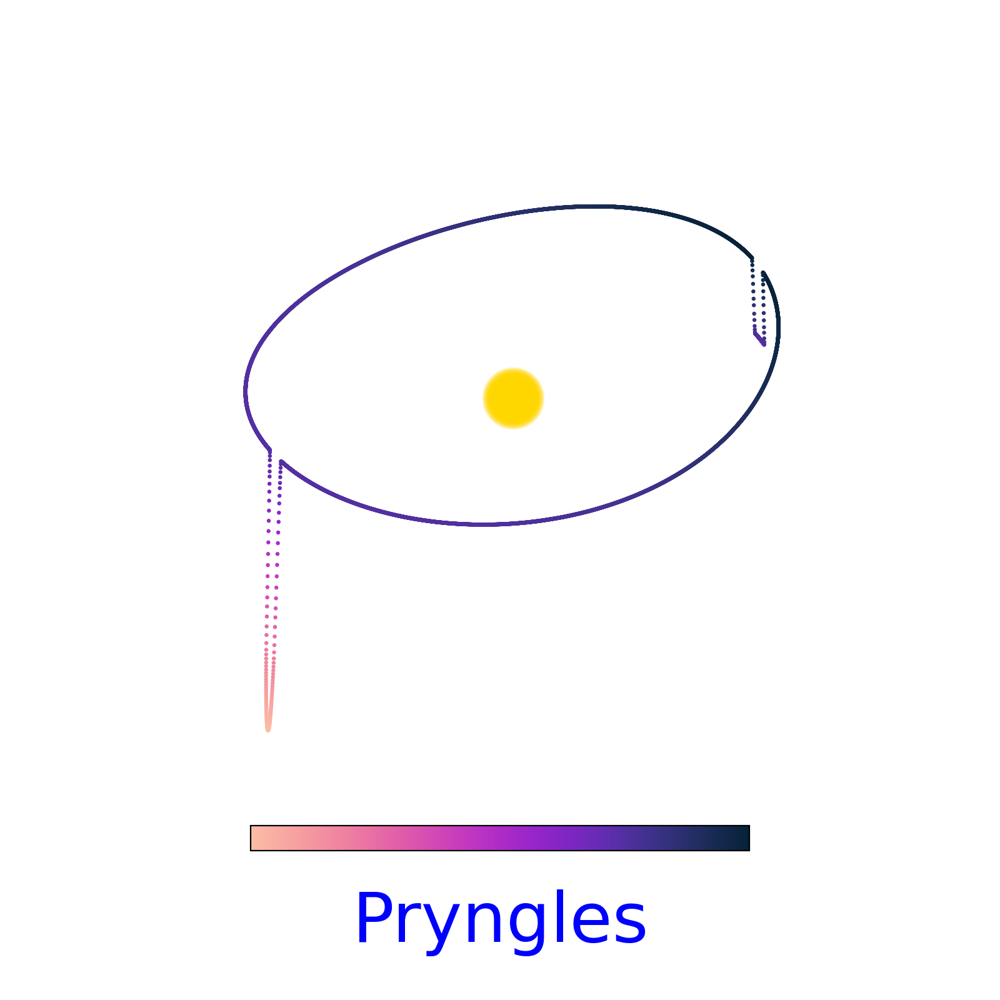

findfont: Font family ['Special Elite'] not found. Falling back to DejaVu Sans.


In [40]:
Plot.draw_pryngles()

#### Method `rgb`

Convert from hls to rgb:

In [41]:
help(Plot.rgb)

Help on function rgb in module pryngles.plot:

rgb(hls, to_hex=False)
    Convert from hue (0-360), level (0-1) and saturation (0-1) to RGB
    
    Parameters:
    
        hls: array(3):
            Array with values of color:
                hls[0]: hue, 0-360, see https://pythonfordesigners.com/tutorials/hsl-color-wheel/
                hls[1]: level, 0: black, 1: white
                hls[2]: saturation, 0: gray, 1: full-color
                
    Return:
    
        rgb: array(3):
            Array with rgb values (R: red, G: green, B: blue)



In [42]:
print(Plot.rgb([27,0.5,0.5]))

(0.75, 0.475, 0.25)


#### Method `rgb_sample`

Generate a color chart of a given hue:

<IPython.core.display.Javascript object>


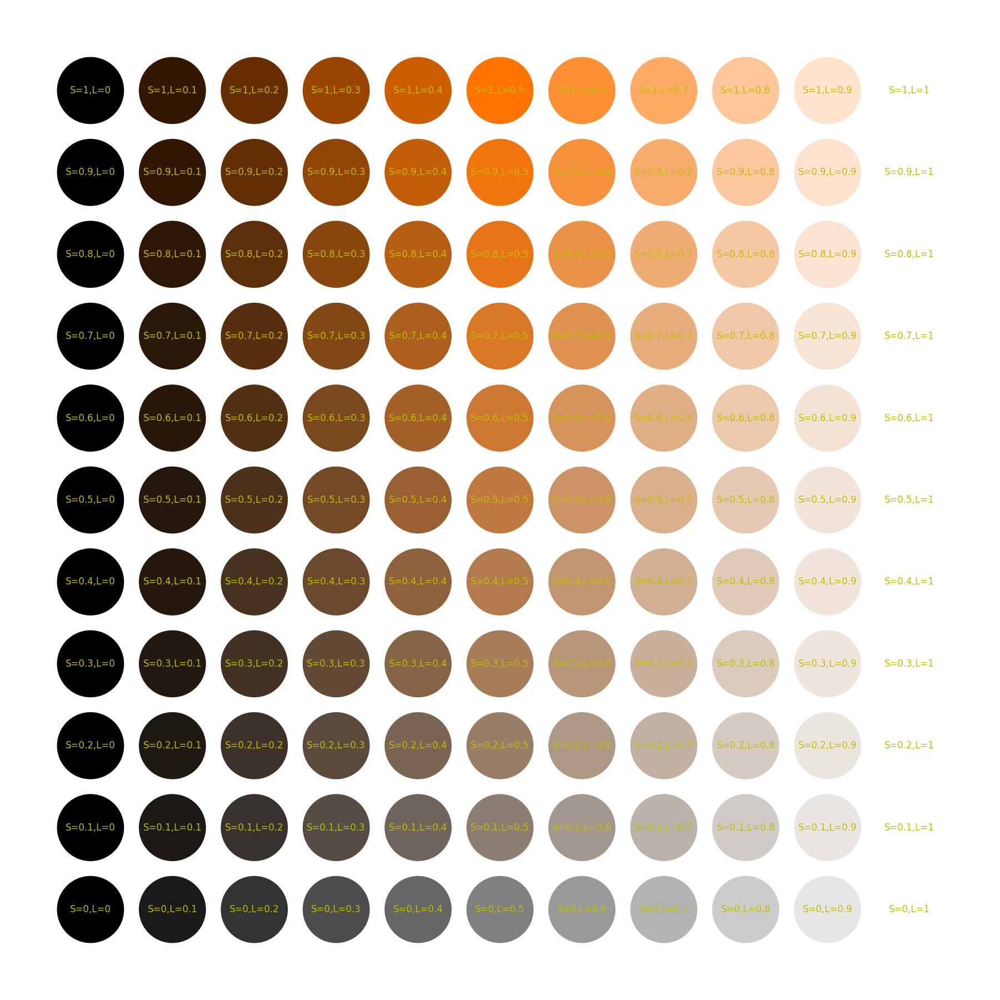

In [43]:
Plot.rgb_sample(27)

#### Routine `calc_flyby`

Fly byes are used to create animations:

<IPython.core.display.Javascript object>


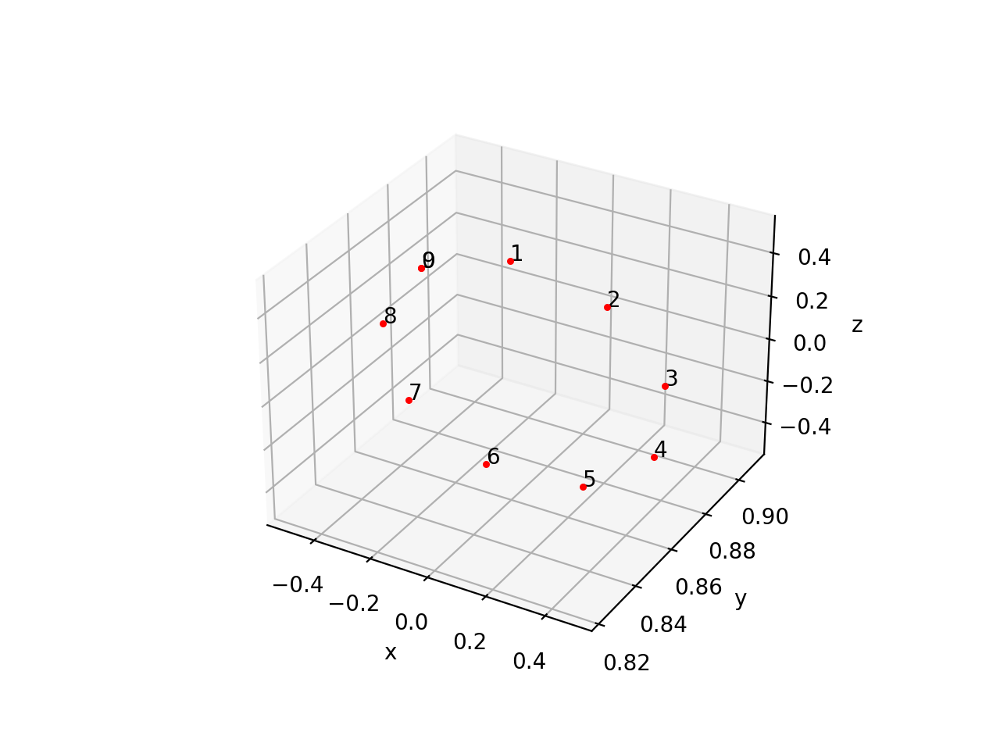

In [44]:
nvecs=Plot.calc_flyby(normal=[1,1,0],lat=60)

fig=plt.figure()
ax=fig.add_subplot(111,projection='3d')

for i in range(len(nvecs)):
    ax.scatter(nvecs[i,0],nvecs[i,1],nvecs[i,2],c='r',s=5)
    ax.text(nvecs[i,0],nvecs[i,1],nvecs[i,2],i)

ax.set_xlabel("x");
ax.set_ylabel("y");
ax.set_zlabel("z");

#### Routine `animate_rebound`

It is important to know if a rebound simultation has some future:

In [45]:
sim=rb.Simulation()
ms=1
sim.add(m=1)
mp=1e-3
xp=0.3
vp=np.sqrt(sim.G*ms/xp)
sim.add(m=mp,x=xp,vy=vp)
mm=1e-8
xm=0.01
vm=np.sqrt(sim.G*mp/xm)
sim.add(m=mm,x=xp+xm,vy=vp+vm)
P=sim.particles[1].P

#anim=Plot.animate_rebound(sim,filename="/tmp/animate-rebound.gif",tend=P,nsnap=100,interval=20)  

## Core modules

### Sampler (`sampler`)

Spangler is the class which generate the positions of the spangles which cover the surface of a ring or a planet.

Methods of the `Sampler` class:

In [46]:
Misc.get_methods(Sampler)

['_calc_distances',
 '_cut_hole',
 '_get_min_distance',
 '_seed_sampler',
 'gen_circle',
 'gen_ring',
 'gen_sphere',
 'load_from',
 'plot',
 'purge_sample',
 'save_to',
 'update_normals']

To create a Sampler use:

In [47]:
sp=Sampler()

This will create a default Spangler with N = 1000 spangles (see documentation to verify) or check the attributes:

In [48]:
sp.N

1000

Now you can generate spangle positions in differente geometries.  A set of cartesian, polar or spherical positions is called a *Sample*.

<IPython.core.display.Javascript object>


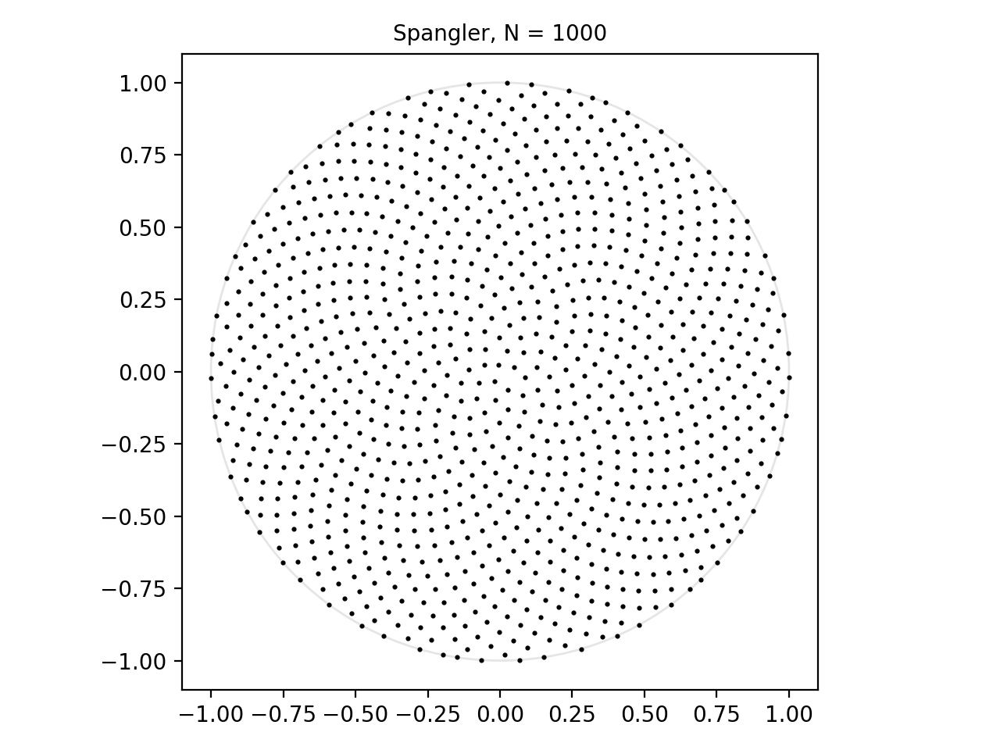

In [49]:
#Generate sample in a unitary circle
sp.gen_circle()

#Plot the sample
sp.plot()

sp.ax.set_title(f"Spangler, N = {sp.N}",fontsize=10)
sp.fig.tight_layout()

You may get information about the points with the attributes `ss` (position in cartesian coordinates) and `pp` (positions in polar or spherical coordinates) and `ns` (normal vector to points over the surface of the sample area):

In [50]:
sp.ss, sp.pp, sp.ns

(array([[-0.00540713,  0.02207469,  0.        ],
        [-0.01892126, -0.03451917,  0.        ],
        [ 0.04811447,  0.01635978,  0.        ],
        ...,
        [ 0.7771    ,  0.62937714,  0.        ],
        [-0.99814751,  0.06084039,  0.        ],
        [ 0.69490581, -0.71910076,  0.        ]]),
 array([[0.02272727, 1.81101343, 0.        ],
        [0.03936479, 4.21097666, 0.        ],
        [0.05081973, 0.32775458, 0.        ],
        ...,
        [1.        , 0.68075144, 0.        ],
        [1.        , 3.08071467, 0.        ],
        [1.        , 5.4806779 , 0.        ]]),
 array([[0., 0., 1.],
        [0., 0., 1.],
        [0., 0., 1.],
        ...,
        [0., 0., 1.],
        [0., 0., 1.],
        [0., 0., 1.]]))

Coordinates in polar are given as $(r,\theta,\phi)$ with angular coordinate in radians.  Points are not sorted in any way.

Several interesting statistical measures are provided internally:

In [51]:
print(sp.dmin,sp.dmax,sp.dmed,sp.dran,sp.dstar)

0.04331330506949958 0.06459591610504166 0.05424599552131314 0.021282611035542076 1.7154089979064249


`sp.dmin,sp.dmax,sp.dmed` for instance is the minimum, maximum and average distance between the points in the sample.  `sp.dran` is the difference between the maximum and minimum.  `sp.dstar` is a measure of the distance between the points which is typically between 1.7 and 3.4 (see http://extremelearning.com.au/evenly-distributing-points-on-a-sphere)

There is another property: `deff`.  This is the diameter that has to have a spangle in such a way that all spangles have the same total area of the region covered by the sample.  You may understande `deff` if show not only the position of the spangles but also the spangles itself:

<IPython.core.display.Javascript object>


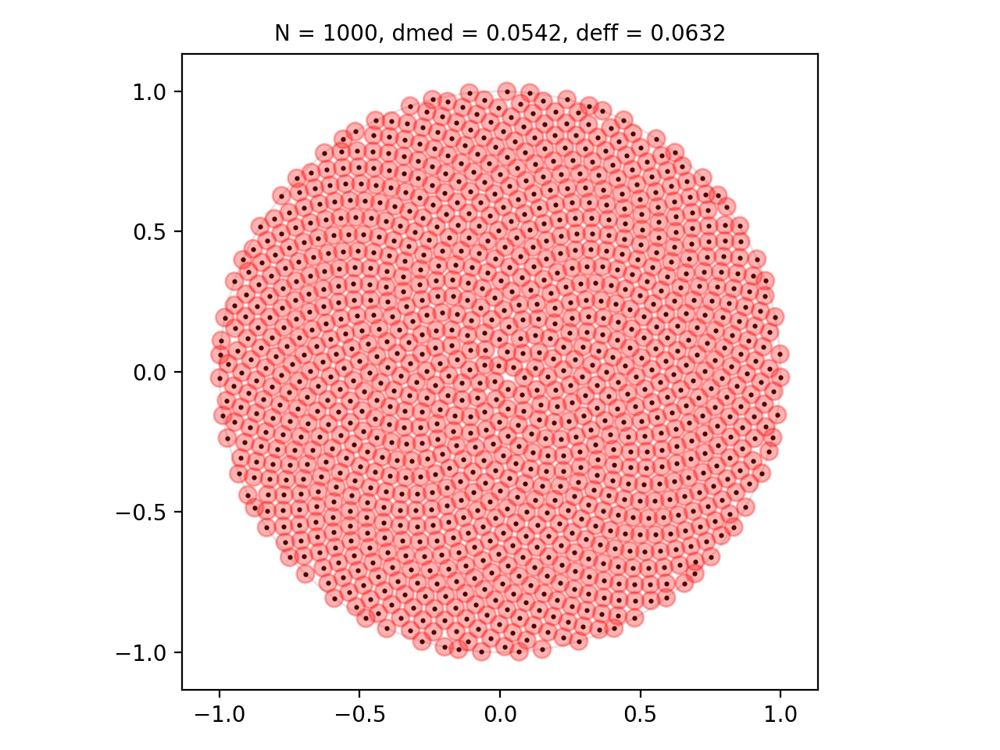

In [52]:
sp.plot(spangled=dict(color='r'))
sp.ax.set_title(f"N = {sp.N}, dmed = {sp.dmed:.4f}, deff = {sp.deff:.4f}",fontsize=10)
sp.fig.tight_layout()

Now you may check that the effective diameter of the spangles are a little bit larger than the average distance.

If you want that the spangle position not be different each time use:

In [53]:
sp=Sampler(seed=1)

Other Spangler's methods are:

<IPython.core.display.Javascript object>


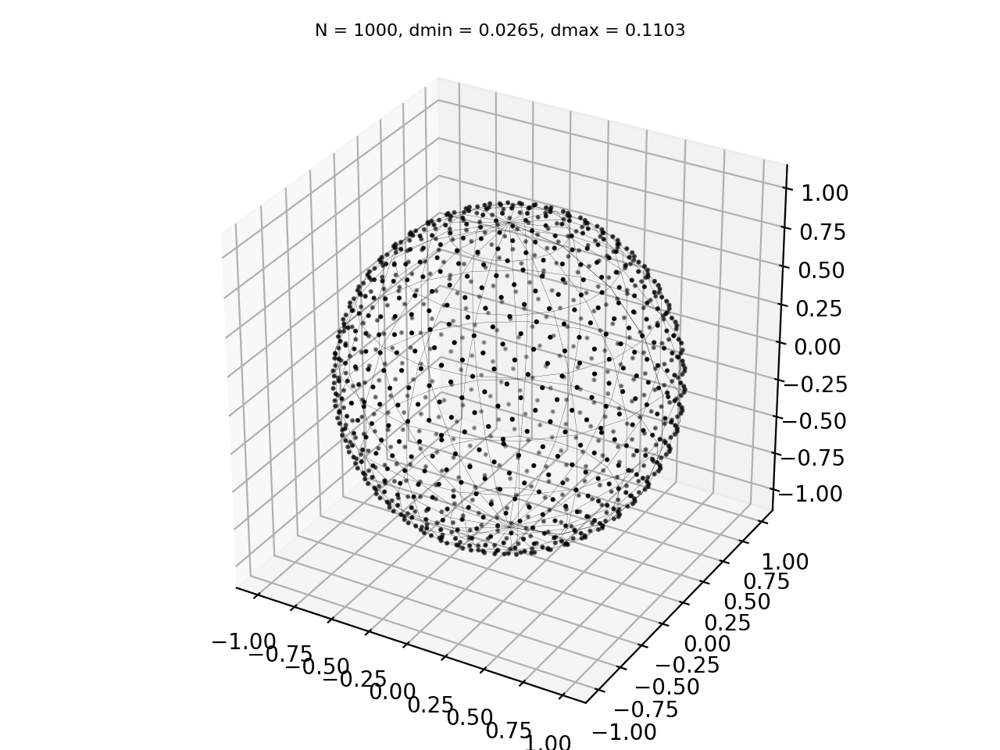

In [54]:
sp.seed=1
sp.N=1000
sp.gen_sphere()
sp.plot()

sp.ax.set_title(f"N = {sp.N}, dmin = {sp.dmin:.4f}, dmax = {sp.dmax:.4f}",fontsize=8);
sp.fig.tight_layout()

And plot the spangles:

<IPython.core.display.Javascript object>


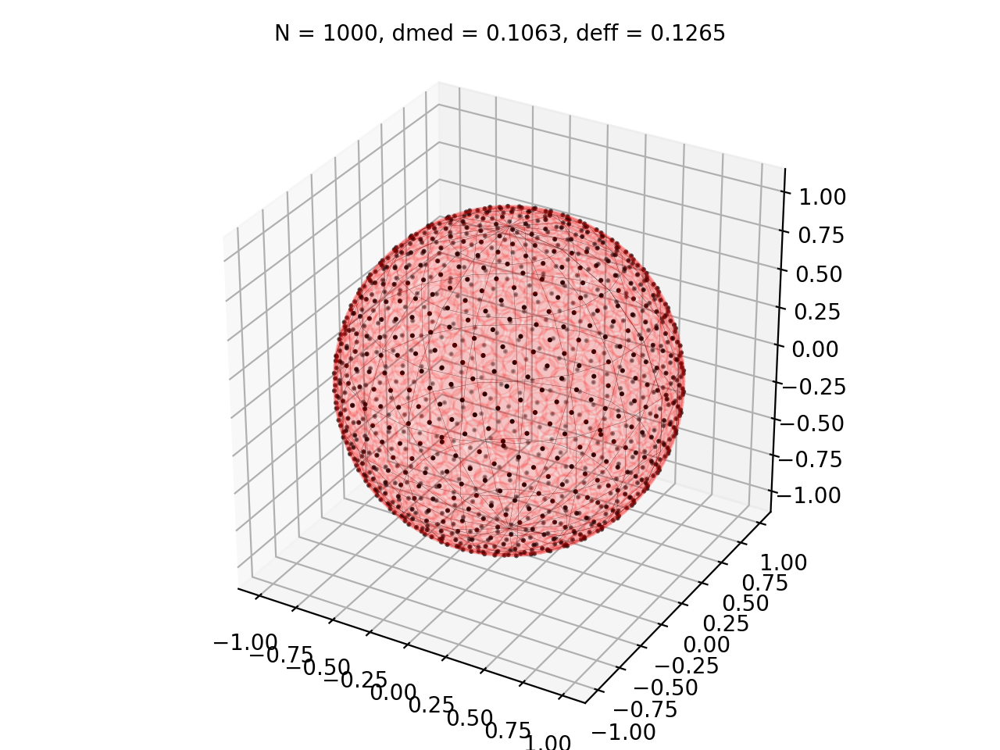

In [55]:
sp.plot(spangled=dict(color='r',alpha=0.1))
sp.ax.set_title(f"N = {sp.N}, dmed = {sp.dmed:.4f}, deff = {sp.deff:.4f}",fontsize=10)
sp.fig.tight_layout()

You may see that there are some superpositions between spangles.  This is because, when the points are generated in the surface of a sphere it could be one or two points really close.  Since the idea is that every point be more or less at the same distance, one way to improve the situation is to purge the sample:

In [56]:
sp.purge_sample()
sp.N,sp.dmin,sp.dmax

(987, 0.09777409588068323, 0.11025145618170583)

Plotting again:

<IPython.core.display.Javascript object>


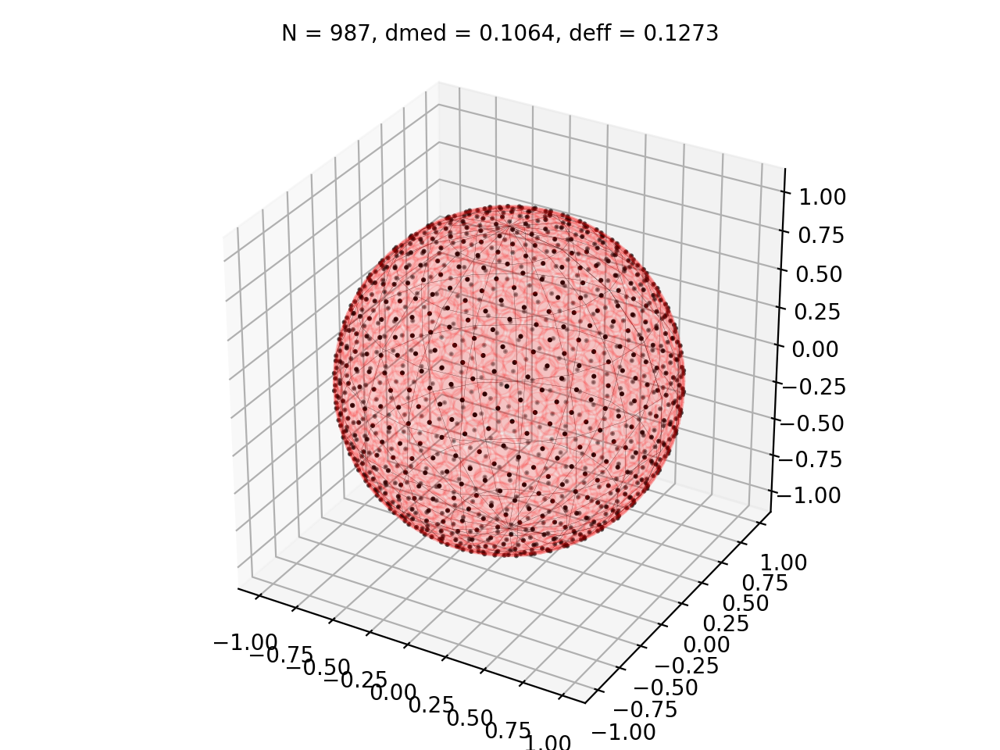

In [57]:
sp.plot(spangled=dict(color='r',alpha=0.1))
sp.ax.set_title(f"N = {sp.N}, dmed = {sp.dmed:.4f}, deff = {sp.deff:.4f}",fontsize=10)
sp.fig.tight_layout()

As you can see the number of points have been reduced to less than the original number selected, 1000 due to the purging process, and the distance between all points is almost the same.

You can also obtain a Sampler from presets:

Number of final points 2584, number of points in preset: 2600


<IPython.core.display.Javascript object>


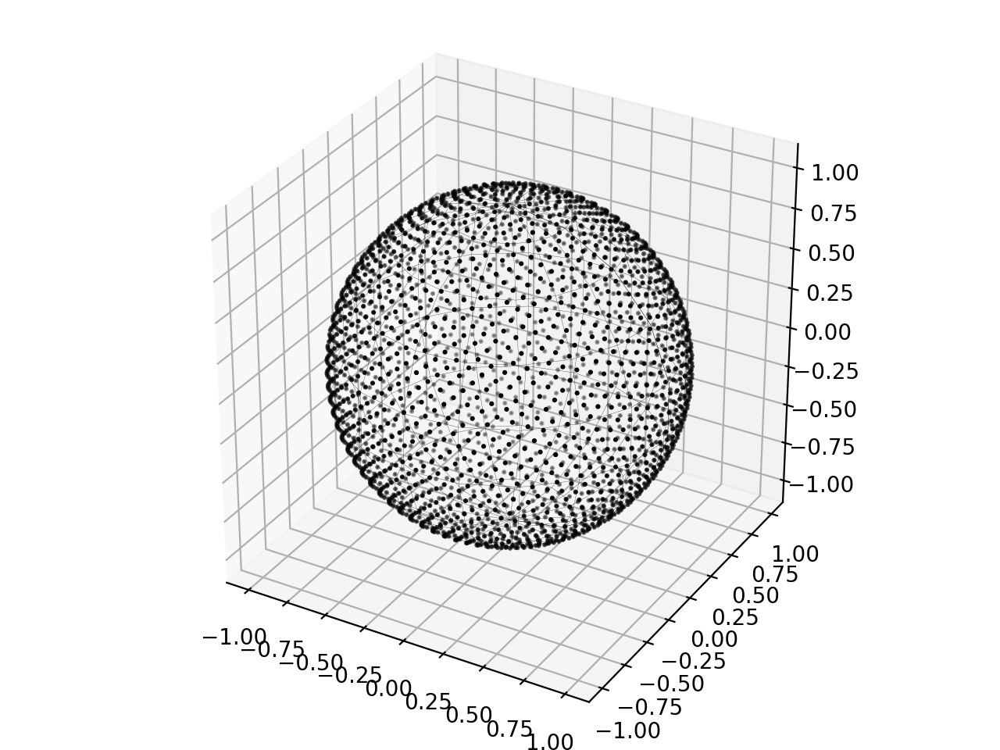

In [58]:
sp=Sampler(preset=("sphere",dict()),N=2738)
print(f"Number of final points {sp.N}, number of points in preset: {sp.Npreset}")
sp.plot()

As you can see the time required to load the data from a preset is much lower.  Pryngles search for the preset closer to the number (2378). The algorithm choose 2600 and then after the purge the value is 2548.

Another geometrical figure is a ring

<IPython.core.display.Javascript object>


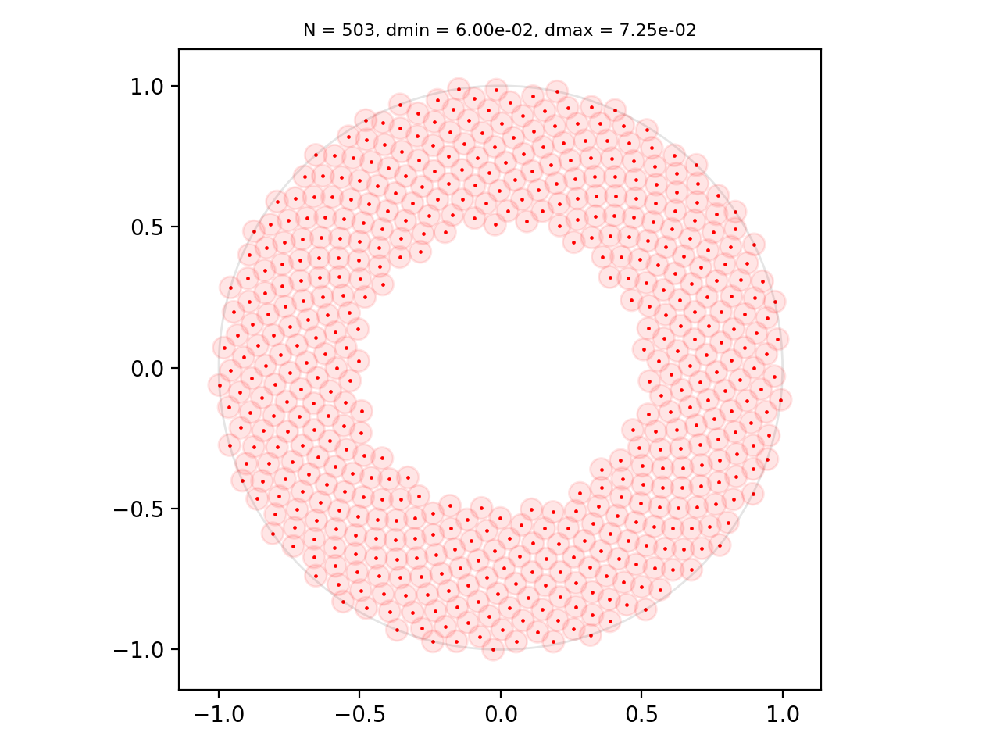

In [59]:
sp.N=500
sp.gen_ring(0.5,boundary=1)
sp.plot(c='r',s=0.5,spangled=dict(color='r',alpha=0.1)) # Yo may use the options of the scatter function
sp.ax.set_title(f"N = {sp.N}, dmin = {sp.dmin:.2e}, dmax = {sp.dmax:.2e}",fontsize=8);
sp.fig.tight_layout()

And again you might load it from a preset:

<IPython.core.display.Javascript object>


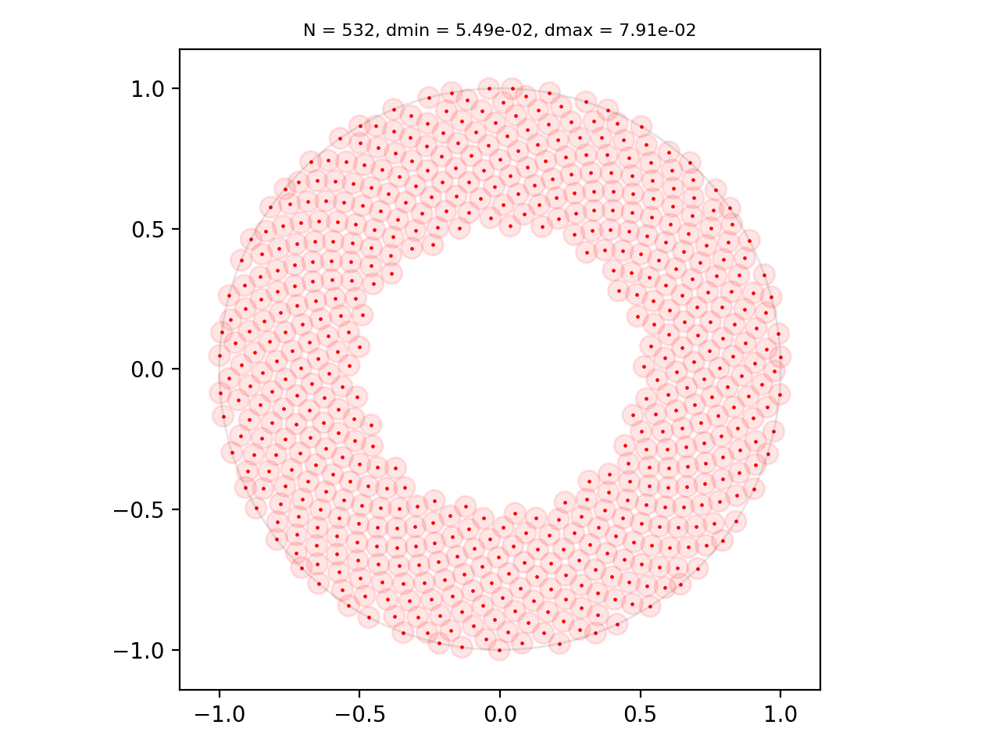

In [60]:
sp=Sampler(N=500,preset=("ring",dict(ri=0.5)))
sp.plot(c='r',s=0.5,spangled=dict(color='r',alpha=0.1)) # Yo may use the options of the scatter function
sp.ax.set_title(f"N = {sp.N}, dmin = {sp.dmin:.2e}, dmax = {sp.dmax:.2e}",fontsize=8);
sp.fig.tight_layout()

The generation of points have an option to fill the border:

<IPython.core.display.Javascript object>


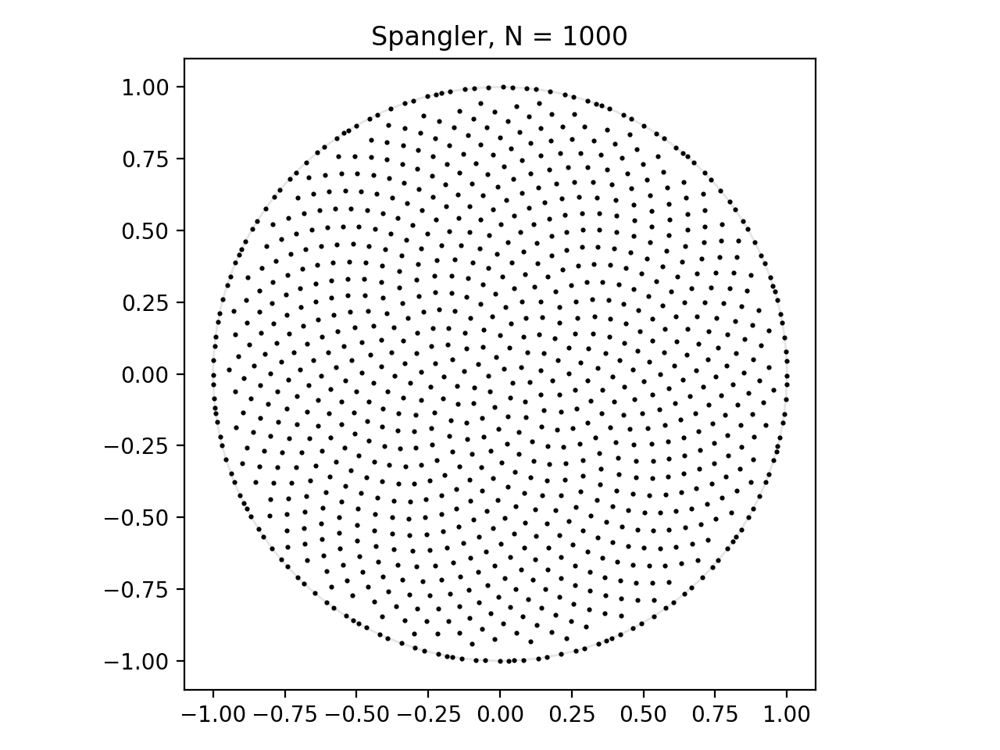

In [61]:
#Generate sample in a unitary circle
sp.N=1000
sp.gen_circle(boundary=5) #Make a heavier boundary

#Plot the sample
sp.plot()

sp.ax.set_title(f"Spangler, N = {sp.N}")
sp.fig.tight_layout()

## Spangler (`spangler`)

This is one of the key modules of `Pryngles`.  Sampling the surface of a body (star, planet or ring) is just the beginning.  In order to compute all the effects for which `Pryngles` was designed we need to build a special object called a `Spangler`.

You may create the most simple `Spangler` using:

In [62]:
sg=Spangler()

The most important attribute of a `Spangler` is a DataFrame containing the positions and orientations of spangles:

In [63]:
print_df(sg.data)

,sphash,spangle_type,geometry,scale,n_equ,alpha_equ,w,q0,center_equ,x_equ,y_equ,z_equ,r_equ,q_equ,f_equ,ns_equ,center_ecl,x_ecl,y_ecl,z_ecl,ns_ecl,center_int,x_int,y_int,z_int,ns_int,rho_int,az_int,cost_int,cos_int,d_int,z_cen_int,center_obs,x_obs,y_obs,z_obs,ns_obs,rho_obs,az_obs,cost_obs,cos_obs,d_obs,z_cen_obs,center_luz,x_luz,y_luz,z_luz,ns_luz,rho_luz,az_luz,cost_luz,cos_luz,d_luz,z_cen_luz,asp,dsp,albedo_gray_normal,tau_gray_optical,unset,hidden,source,visible,intersect,shadow,indirect,emit,above,illuminated,transmit,transit,occult
0,24220,0,0,1,"[0.0, 0.0, 1.0]",0,0,0,"[0, 0, 0]",1,0,0,1,0,0,"[0, 0, 1]","[0, 0, 0]",1.0,0.0,0.0,"[0.0, 0.0, 1.0]","[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,"[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,"[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,1.0,1.0,1.0,0.0,True,False,False,False,False,False,False,False,False,False,False,False,False


These are the columns in the spangler DataFrame:

In [64]:
sg.data.columns

Index(['sphash', 'spangle_type', 'geometry', 'scale', 'n_equ', 'alpha_equ',
       'w', 'q0', 'center_equ', 'x_equ', 'y_equ', 'z_equ', 'r_equ', 'q_equ',
       'f_equ', 'ns_equ', 'center_ecl', 'x_ecl', 'y_ecl', 'z_ecl', 'ns_ecl',
       'center_int', 'x_int', 'y_int', 'z_int', 'ns_int', 'rho_int', 'az_int',
       'cost_int', 'cos_int', 'd_int', 'z_cen_int', 'center_obs', 'x_obs',
       'y_obs', 'z_obs', 'ns_obs', 'rho_obs', 'az_obs', 'cost_obs', 'cos_obs',
       'd_obs', 'z_cen_obs', 'center_luz', 'x_luz', 'y_luz', 'z_luz', 'ns_luz',
       'rho_luz', 'az_luz', 'cost_luz', 'cos_luz', 'd_luz', 'z_cen_luz', 'asp',
       'dsp', 'albedo_gray_normal', 'tau_gray_optical', 'unset', 'hidden',
       'source', 'visible', 'intersect', 'shadow', 'indirect', 'emit', 'above',
       'illuminated', 'transmit', 'transit', 'occult'],
      dtype='object')

In order to know the meaning of the columns see:

In [65]:
print(SPANGLER_COLUMNS_DOC)


SPANGLER_COLUMNS=odict({
    "sphash":"",

    #Type of spangle
    "spangle_type":SPANGLE_SOLID_ROCK, #For a list of spangle types see the constants module.
    "geometry":SAMPLER_GEOMETRY_CIRCLE, #Geometry of the spangle (see Sampler module constants)

    #Lengh-scale
    "scale":1, #The length scale of the body, eg. for a ring this is the outer radius

    #Body parameters
    "n_equ":[0,0,1], #Direction of the equator of the body with respect
    "alpha_equ":0, #Zero meridian of equatorial system
    "w":0, #Rotational angular velocity [rad/ut]
    "q0":0, #Initial time [rad], Longitude (azimutal angle) are calculated as: q = q0 + w (t - t0)

    #Coordinates of the spangle (cartesian and spherical) in the body-centric system
    "center_equ":[0,0,0],#Center of the body with respect to barycenter
    "x_equ":1,"y_equ":0,"z_equ":0, #Cartesian coordinates
    "r_equ":1,"q_equ":0,"f_equ":0, #Spherical coordinates: q: longitude, f: latitude
    "ns_equ":[0,0,1], #Unitary vector norma

It is important to point out that creating a Spangler only creates the basic structure, the scafold of the Spangler:

In [66]:
sg=Spangler(nspangles=1000)
print_df(sg.data.head(5))

,sphash,spangle_type,geometry,scale,n_equ,alpha_equ,w,q0,center_equ,x_equ,y_equ,z_equ,r_equ,q_equ,f_equ,ns_equ,center_ecl,x_ecl,y_ecl,z_ecl,ns_ecl,center_int,x_int,y_int,z_int,ns_int,rho_int,az_int,cost_int,cos_int,d_int,z_cen_int,center_obs,x_obs,y_obs,z_obs,ns_obs,rho_obs,az_obs,cost_obs,cos_obs,d_obs,z_cen_obs,center_luz,x_luz,y_luz,z_luz,ns_luz,rho_luz,az_luz,cost_luz,cos_luz,d_luz,z_cen_luz,asp,dsp,albedo_gray_normal,tau_gray_optical,unset,hidden,source,visible,intersect,shadow,indirect,emit,above,illuminated,transmit,transit,occult
0,55712,0,0,1,"[0.0, 0.0, 1.0]",0,0,0,"[0, 0, 0]",1,0,0,1,0,0,"[0, 0, 1]","[0, 0, 0]",1.0,0.0,0.0,"[0.0, 0.0, 1.0]","[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,"[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,"[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,1.0,1.0,1.0,0.0,True,False,False,False,False,False,False,False,False,False,False,False,False
1,55712,0,0,1,"[0.0, 0.0, 1.0]",0,0,0,"[0, 0, 0]",1,0,0,1,0,0,"[0, 0, 1]","[0, 0, 0]",1.0,0.0,0.0,"[0.0, 0.0, 1.0]","[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,"[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,"[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,1.0,1.0,1.0,0.0,True,False,False,False,False,False,False,False,False,False,False,False,False
2,55712,0,0,1,"[0.0, 0.0, 1.0]",0,0,0,"[0, 0, 0]",1,0,0,1,0,0,"[0, 0, 1]","[0, 0, 0]",1.0,0.0,0.0,"[0.0, 0.0, 1.0]","[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,"[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,"[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,1.0,1.0,1.0,0.0,True,False,False,False,False,False,False,False,False,False,False,False,False
3,55712,0,0,1,"[0.0, 0.0, 1.0]",0,0,0,"[0, 0, 0]",1,0,0,1,0,0,"[0, 0, 1]","[0, 0, 0]",1.0,0.0,0.0,"[0.0, 0.0, 1.0]","[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,"[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,"[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,1.0,1.0,1.0,0.0,True,False,False,False,False,False,False,False,False,False,False,False,False
4,55712,0,0,1,"[0.0, 0.0, 1.0]",0,0,0,"[0, 0, 0]",1,0,0,1,0,0,"[0, 0, 1]","[0, 0, 0]",1.0,0.0,0.0,"[0.0, 0.0, 1.0]","[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,"[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,"[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,1.0,1.0,1.0,0.0,True,False,False,False,False,False,False,False,False,False,False,False,False


In order to fill the spangler with actual positions you should use:

In [67]:
sg.populate_spangler(shape="circle")
print_df(sg.data.head(5))

,sphash,spangle_type,geometry,scale,n_equ,alpha_equ,w,q0,center_equ,x_equ,y_equ,z_equ,r_equ,q_equ,f_equ,ns_equ,center_ecl,x_ecl,y_ecl,z_ecl,ns_ecl,center_int,x_int,y_int,z_int,ns_int,rho_int,az_int,cost_int,cos_int,d_int,z_cen_int,center_obs,x_obs,y_obs,z_obs,ns_obs,rho_obs,az_obs,cost_obs,cos_obs,d_obs,z_cen_obs,center_luz,x_luz,y_luz,z_luz,ns_luz,rho_luz,az_luz,cost_luz,cos_luz,d_luz,z_cen_luz,asp,dsp,albedo_gray_normal,tau_gray_optical,unset,hidden,source,visible,intersect,shadow,indirect,emit,above,illuminated,transmit,transit,occult
0,55712,0,0,1,"[0.0, 0.0, 1.0]",0,0,0,"[0, 0, 0]",0.021876,0.006160,0.0,0.022727,0.274495,0.0,"[0.0, 0.0, 1.0]","[0, 0, 0]",0.021876,0.006160,0.0,"[0.0, 0.0, 1.0]","[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,"[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,"[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,0.003142,0.063246,1.0,0.0,True,False,False,False,False,False,False,False,False,False,False,False,False
1,55712,0,0,1,"[0.0, 0.0, 1.0]",0,0,0,"[0, 0, 0]",-0.035147,0.017727,0.0,0.039365,2.674459,0.0,"[0.0, 0.0, 1.0]","[0, 0, 0]",-0.035147,0.017727,0.0,"[0.0, 0.0, 1.0]","[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,"[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,"[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,0.003142,0.063246,1.0,0.0,True,False,False,False,False,False,False,False,False,False,False,False,False
2,55712,0,0,1,"[0.0, 0.0, 1.0]",0,0,0,"[0, 0, 0]",0.017999,-0.047526,0.0,0.050820,5.074422,0.0,"[0.0, 0.0, 1.0]","[0, 0, 0]",0.017999,-0.047526,0.0,"[0.0, 0.0, 1.0]","[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,"[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,"[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,0.003142,0.063246,1.0,0.0,True,False,False,False,False,False,False,False,False,False,False,False,False
3,55712,0,0,1,"[0.0, 0.0, 1.0]",0,0,0,"[0, 0, 0]",0.022281,0.055850,0.0,0.060131,1.191200,0.0,"[0.0, 0.0, 1.0]","[0, 0, 0]",0.022281,0.055850,0.0,"[0.0, 0.0, 1.0]","[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,"[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,"[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,0.003142,0.063246,1.0,0.0,True,False,False,False,False,False,False,False,False,False,False,False,False
4,55712,0,0,1,"[0.0, 0.0, 1.0]",0,0,0,"[0, 0, 0]",-0.061407,-0.029630,0.0,0.068182,3.591163,0.0,"[0.0, 0.0, 1.0]","[0, 0, 0]",-0.061407,-0.029630,0.0,"[0.0, 0.0, 1.0]","[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,"[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,"[0, 0, 0]",1,0,0,"[0, 0, 1]",1,0,0,1,1,0,0.003142,0.063246,1.0,0.0,True,False,False,False,False,False,False,False,False,False,False,False,False


To check use the `plot3d` method:

<IPython.core.display.Javascript object>


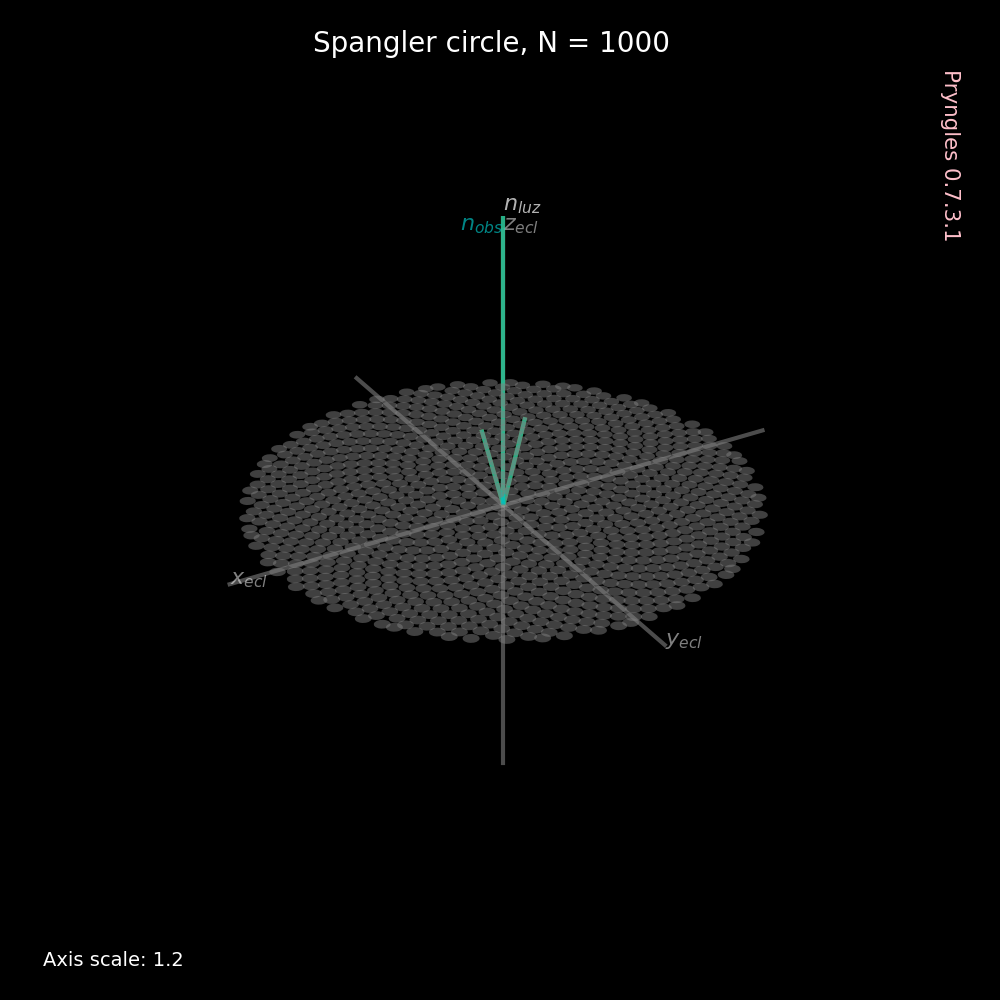

In [68]:
sg.plot3d()

or the two dimensional version:

<IPython.core.display.Javascript object>


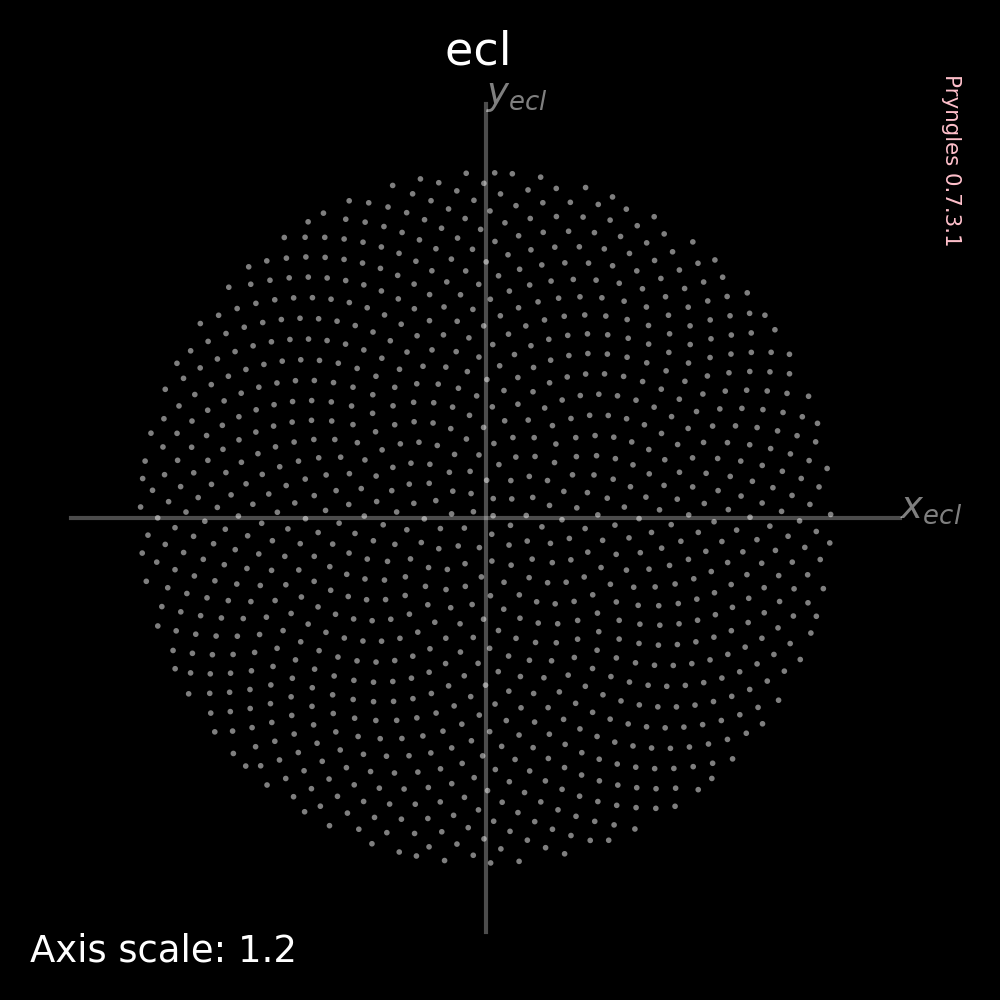

In [69]:
sg.plot2d(coords="ecl")

You may join several spanglers in a single one:

<IPython.core.display.Javascript object>


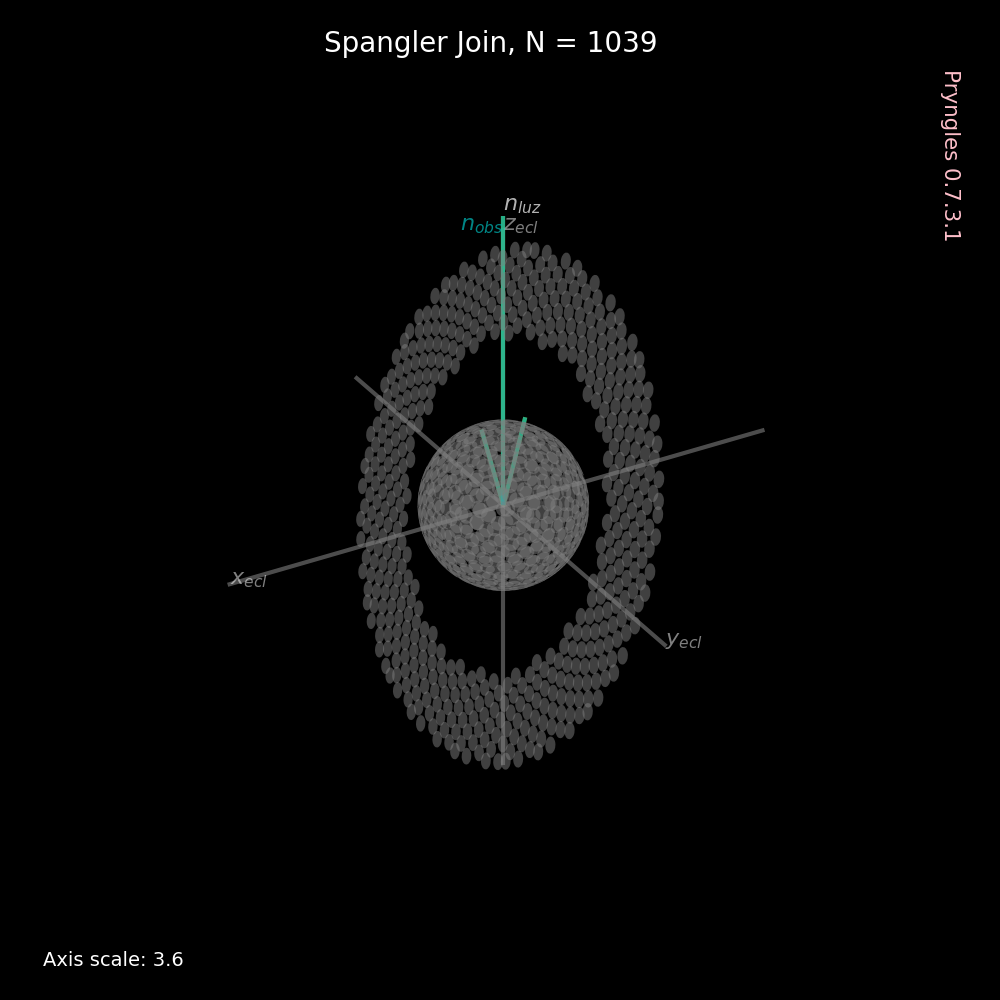

In [70]:
nspangles=500

sg1=Spangler(nspangles=nspangles)
sg1.populate_spangler(shape="sphere",spangle_type=SPANGLE_SOLID_ROCK)

sg2=Spangler(nspangles=nspangles,n_equ=Science.direction(0,20))
sg2.populate_spangler(shape="ring",scale=3,ri=2/3,spangle_type=SPANGLE_GRANULAR)

sgj=Spangler(spanglers=[sg1,sg2])
sgj.plot3d(coords="ecl")

Notice that we have defined the type of spangles to be used.  The type of spangles can be used to differentiate spangles according to their properties.  Type of spangles are:

In [71]:
[f"{spangle} = {eval(spangle)}" for spangle in Consts.get_all() if ('SPANGLE_' in spangle) and ('COLORS' not in spangle)]

['SPANGLE_ATMOSPHERIC = 2',
 'SPANGLE_GASEOUS = 5',
 'SPANGLE_GRANULAR = 4',
 'SPANGLE_LIQUID = 3',
 'SPANGLE_SOLID_ICE = 1',
 'SPANGLE_SOLID_ROCK = 0',
 'SPANGLE_STELLAR = 6']

In graphical representation, each type of spangle are of a different color.  Additionally, for computing the state of the spangle (visible, illuminated, transmitting) the following special spangles are considered:

In [72]:
SPANGLES_SEMITRANSPARENT

[4, 5]

You may transform the coordinates of the spangles to any arbitrary system using `set_intersect`:

In [73]:
output=sgj.set_intersect(nvec=[0,0,1],center=[2,0,0])

Here `center` is the position of the origin of the intersection system.  In this case, the distance to the intersection of each spangle is calculated:

In [74]:
sgj.data.d_int

0       2.239480
1       2.164606
2       2.358826
3       2.120414
4       2.255312
          ...   
1034    2.372850
1035    2.462771
1036    2.575251
1037    2.700339
1038    2.828427
Name: d_int, Length: 1039, dtype: float64

You may check how the points looks like:

<IPython.core.display.Javascript object>


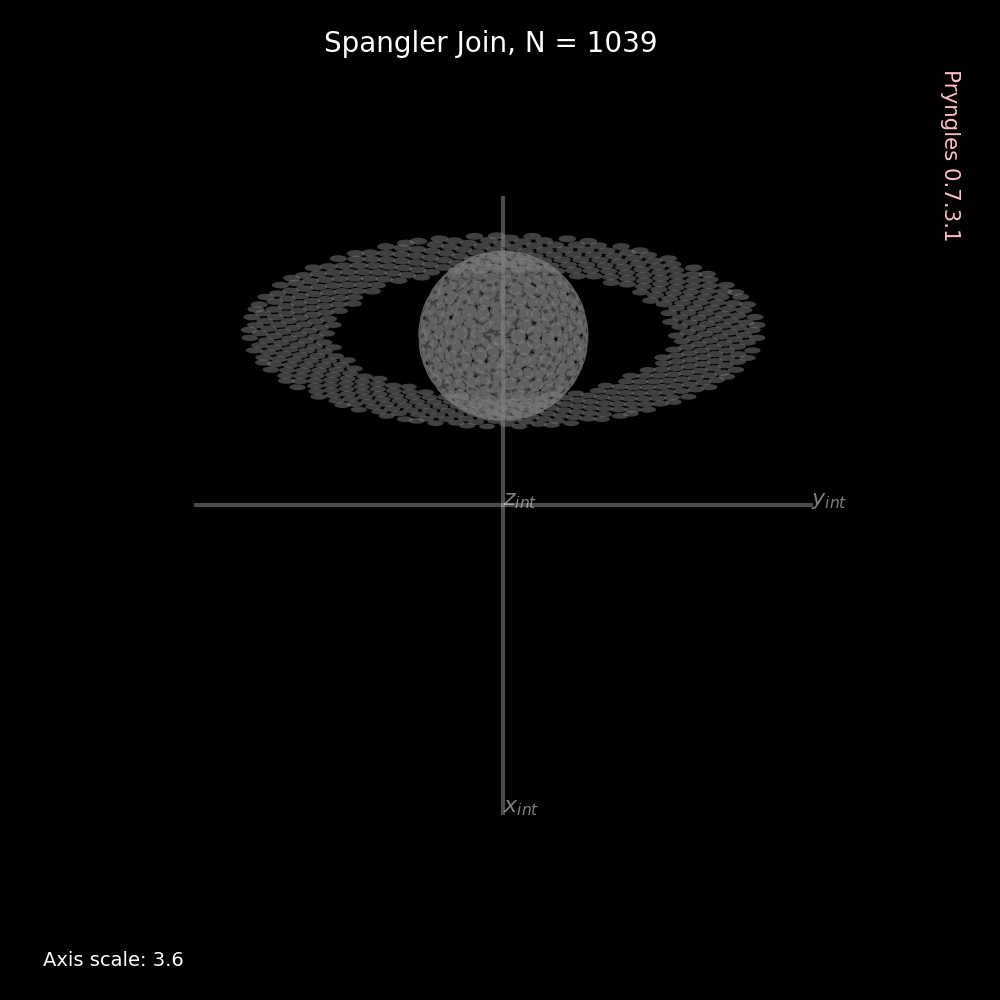

In [75]:
sgj.plot3d(coords="int")

You may plot the location seing from the +z-axis:

<IPython.core.display.Javascript object>


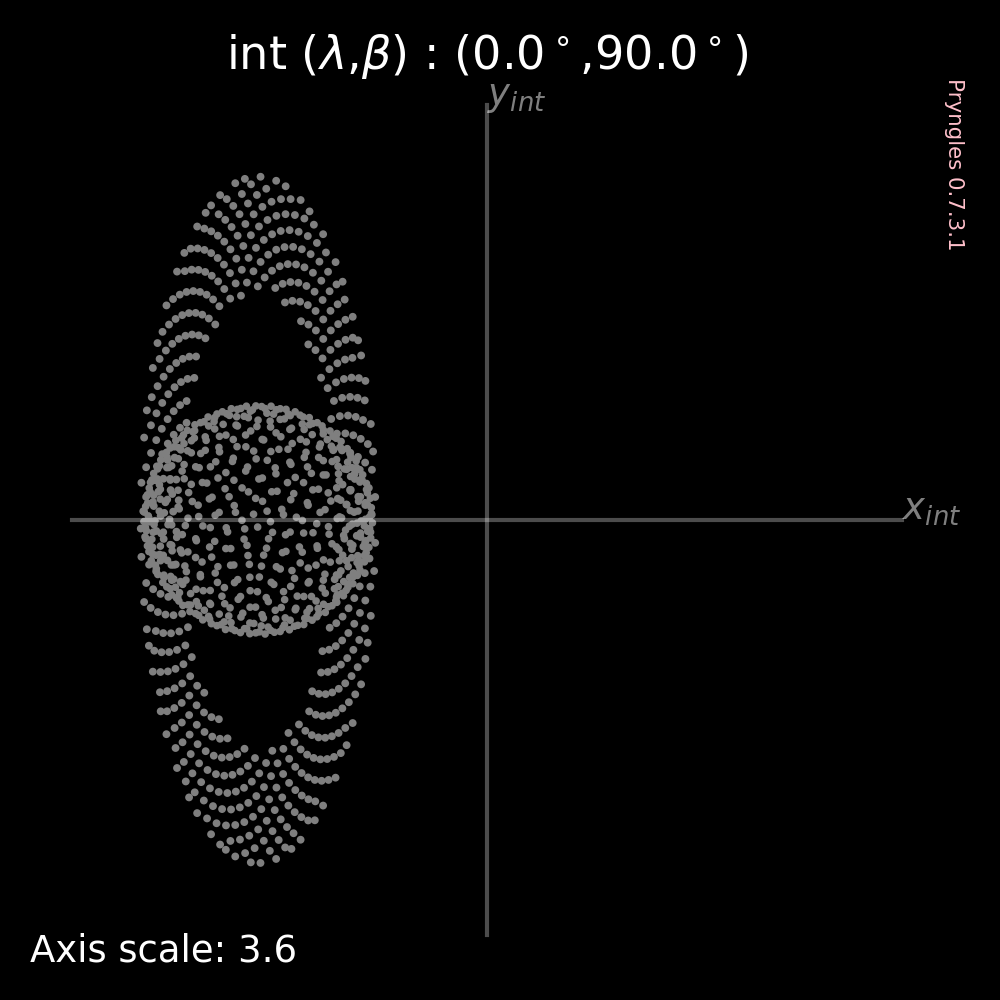

In [76]:
sgj.plot2d(coords="int")

When you calculate the coordinates of a `Spangler` in an *intersection* system, you may also calculate the convex hulls corresponding to the objects:

<IPython.core.display.Javascript object>


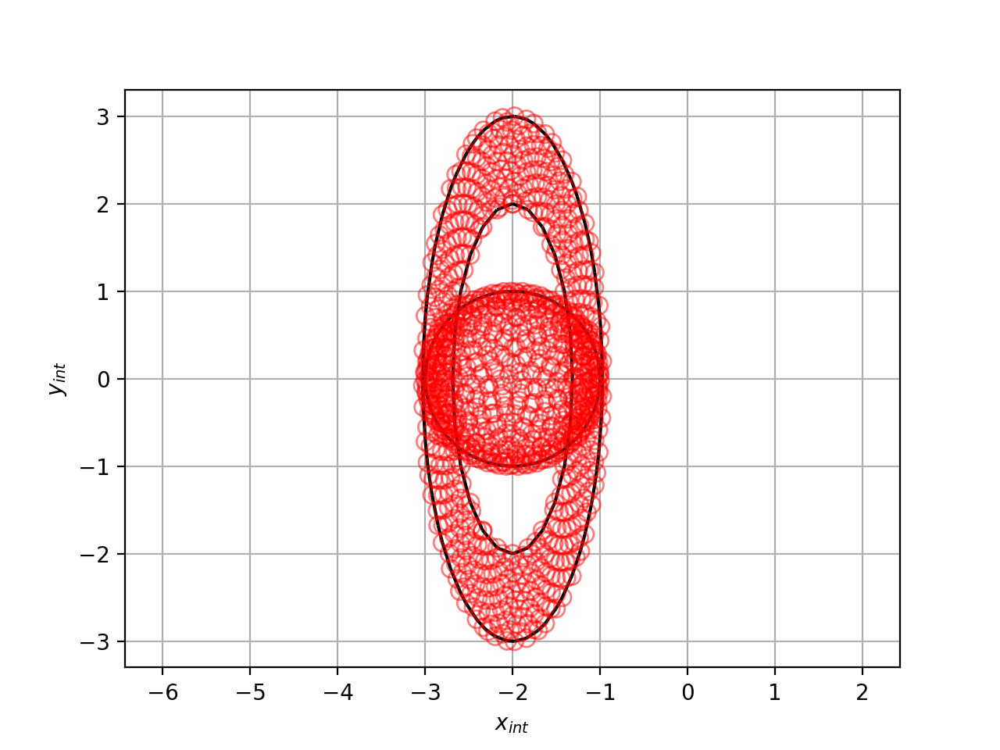

In [77]:
sgj._calc_qhulls()
sgj._plot_qhulls()

Here for instance the convex hull of the ring is blocking some of the spangles of the planet and viceversa.

There are two methods using the power of the intersection algorithms:

<IPython.core.display.Javascript object>


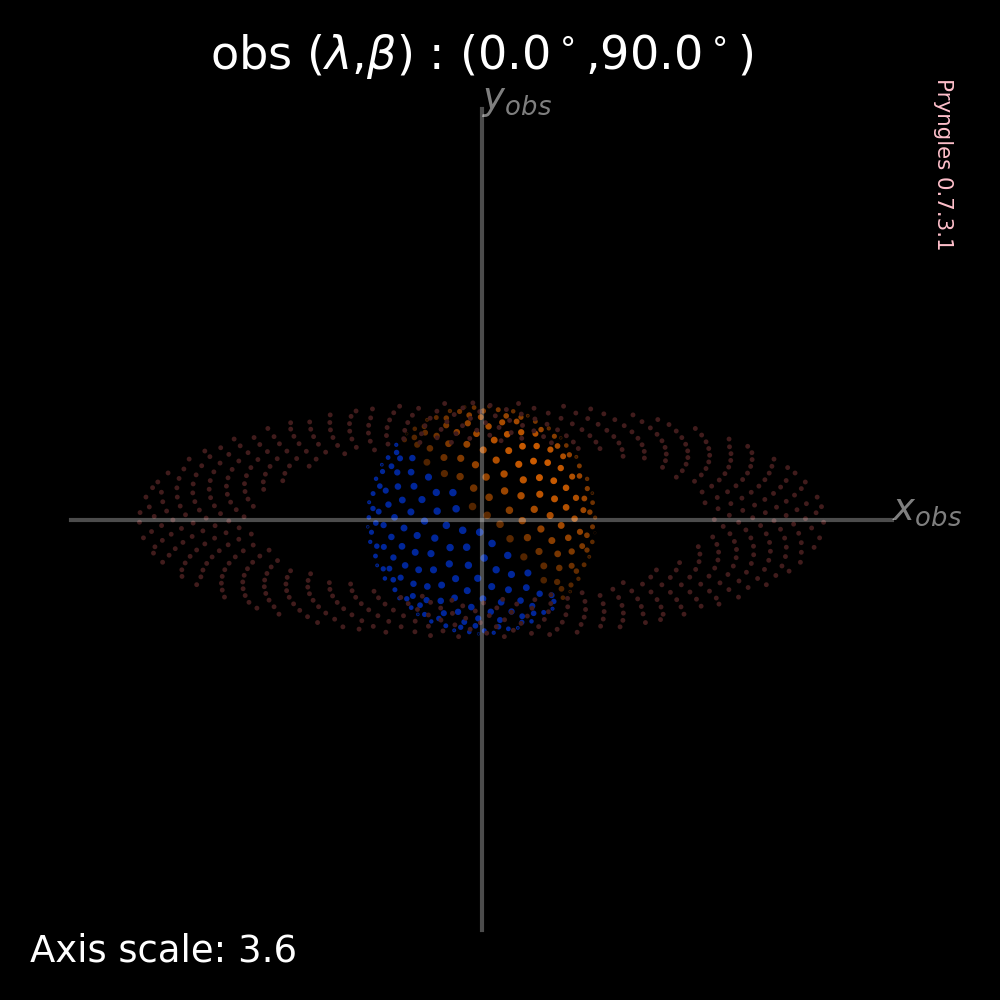

In [78]:
#Observer is in the direction of the z-axis
sgj.set_observer(nvec=Science.direction(0,90))
#Light source is over the x-y plane
sgj.set_luz(nvec=Science.direction(135,0))
sgj.plot2d(coords="obs")

You may see that the size and luminosity of the points in this representation are proportional to the angle between the direction of the light-source and the direction of the observer.  The rings are barely visible because they receive light by transmission.

The angles between the normal to the spangles and the direction of the observer and the source of light are in the following columns of the Spangler DataFrame:

In [79]:
sgj.data[["cos_obs","cos_luz"]]

,cos_obs,cos_luz
0,-0.99800,-0.041918
1,-0.99400,-0.001822
2,-0.99000,0.097009
3,-0.98600,-0.166327
4,-0.98200,0.147961
...,...,...
1034,0.34202,-0.664463
1035,0.34202,-0.664463
1036,0.34202,-0.664463
1037,0.34202,-0.664463


The state of the spangles can be checked in the following columns:

In [80]:
sgj.data[list(SPANGLER_SOURCE_STATES)+list(SPANGLER_VISIBILITY_STATES)]

,illuminated,transmit,transit,occult,visible,intersect,shadow,indirect,emit,above
0,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False
2,True,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False
4,True,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...
1034,False,False,False,False,False,False,False,False,False,False
1035,False,False,False,False,False,False,False,False,False,False
1036,False,False,False,False,False,False,False,False,False,False
1037,False,False,False,False,False,False,False,False,False,False


You may also check the states of the spangles using:

<IPython.core.display.Javascript object>


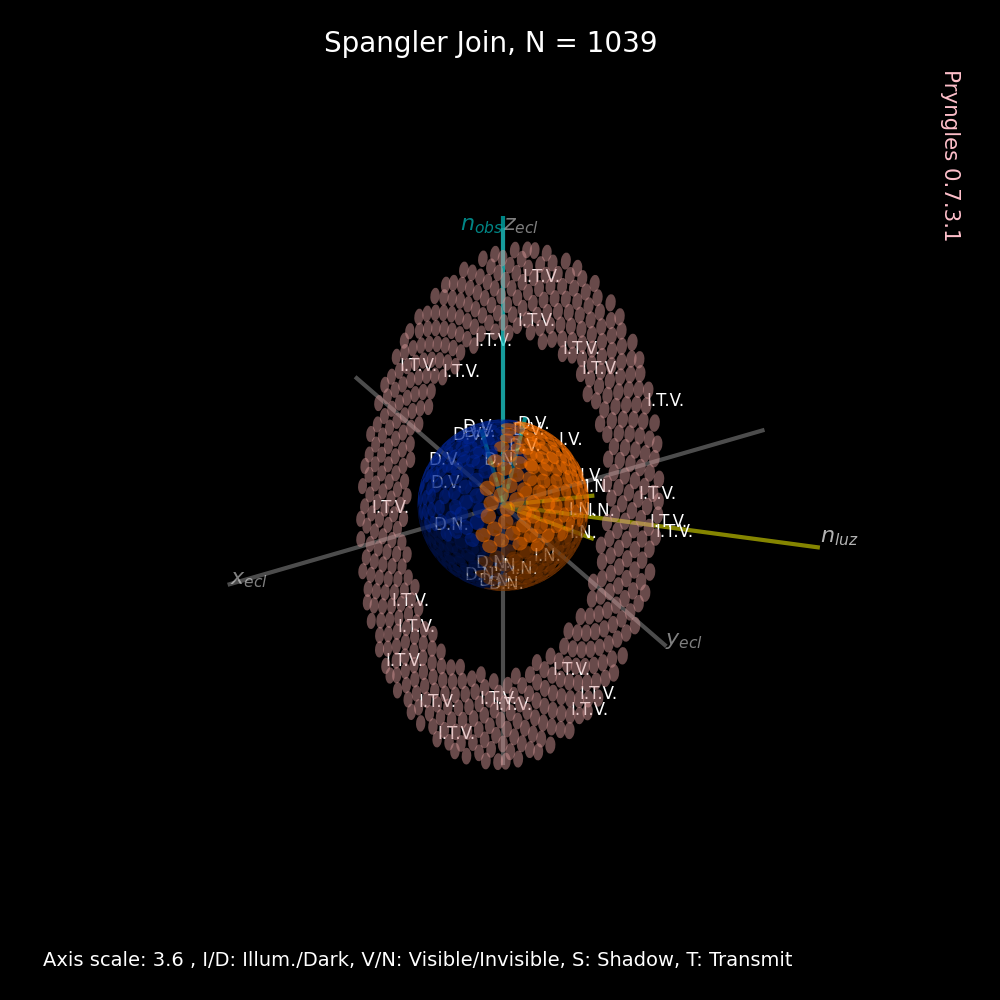

In [81]:
sgj.plot3d(coords="ecl",statemark=0.05)

You may illuminate independently two objects

<IPython.core.display.Javascript object>


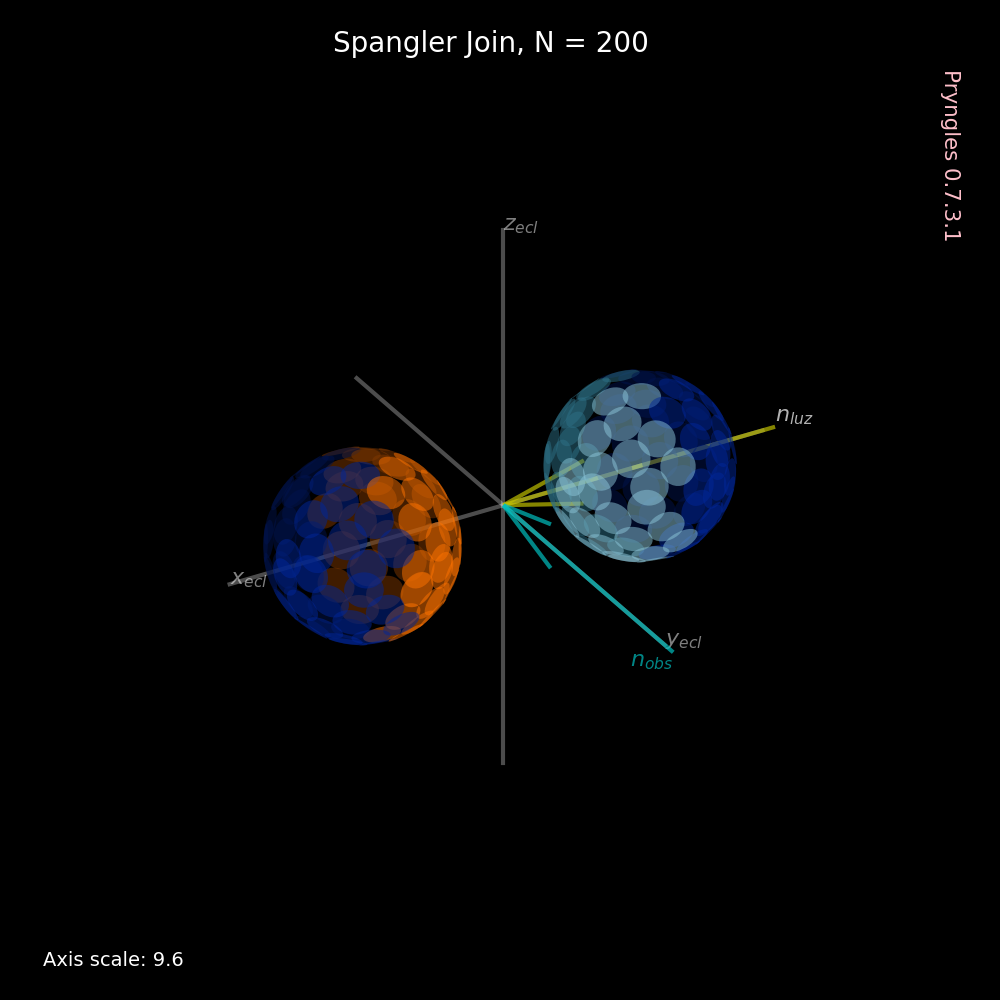

In [82]:
sg1=Spangler(sphash="Planet 1",nspangles=100,center_equ=[-5,0,0])
sg1.populate_spangler(shape="sphere",spangle_type=SPANGLE_LIQUID,preset=True,scale=3)

sg2=Spangler(sphash="Planet 2",nspangles=100,center_equ=[+5,0,0])
sg2.populate_spangler(shape="sphere",spangle_type=SPANGLE_SOLID_ROCK,preset=True,scale=3)

sg=Spangler(spanglers=[sg1,sg2])

sg.set_observer([0,1,0])
sg.set_luz(nvec=[1,0,0],center=[0,0,0],sphash="Planet 1")
sg.set_luz(nvec=[-1,0,0],center=[0,0,0],sphash="Planet 2")

sg.plot3d()

The most interesting method if the `Spangler` module is that calculating the intersections between bodies.

<IPython.core.display.Javascript object>


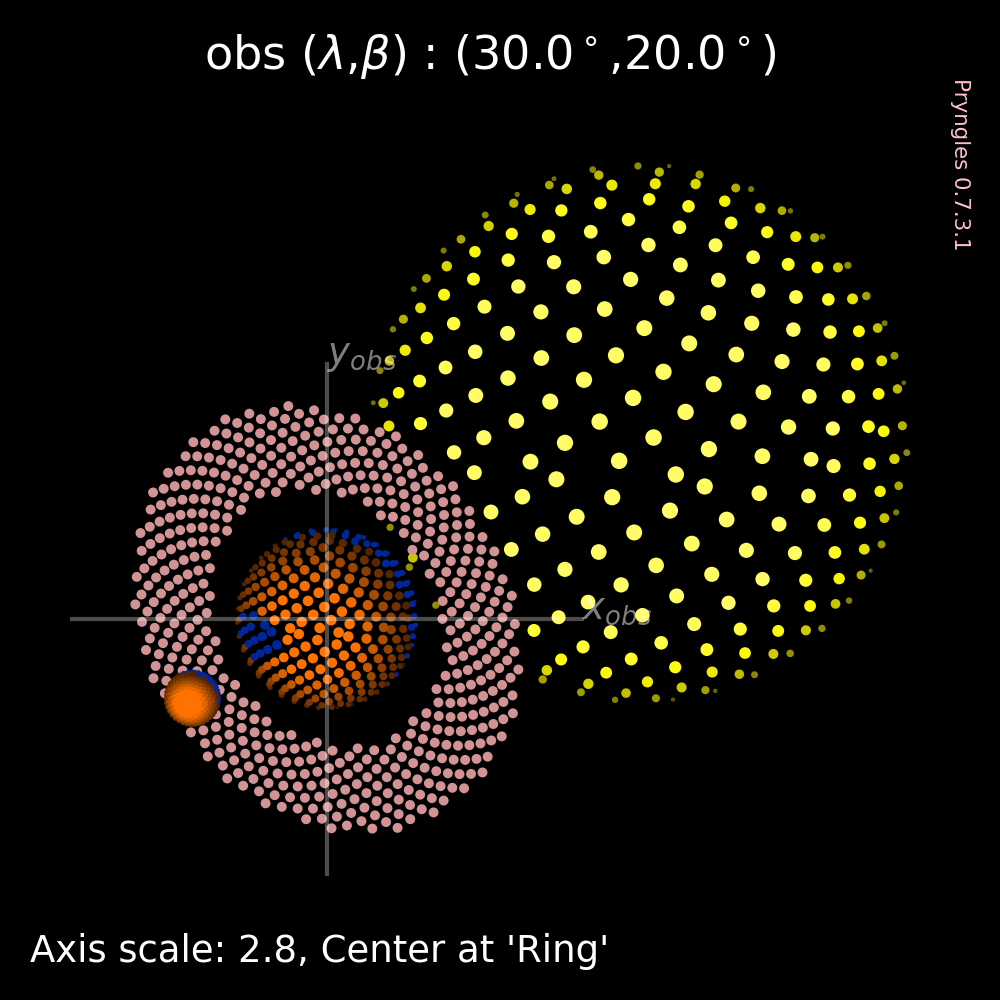

In [83]:
sps=[]
sg=Spangler(nspangles=nspangles,sphash="Parent",n_equ=[0,0,1],center_equ=[-7,0,0])
sg.populate_spangler(shape="sphere",spangle_type=SPANGLE_STELLAR,scale=3,seed=1,preset=1)
sps+=[sg]
sg=Spangler(nspangles=nspangles,sphash="Ring",n_equ=[1,0,0])
sg.populate_spangler(shape="ring",spangle_type=SPANGLE_GRANULAR,scale=2.5,seed=1,ri=1.5/2.5,boundary=0)
sps+=[sg]
sg=Spangler(nspangles=nspangles,sphash="Planet",n_equ=[0,0,1])
sg.populate_spangler(shape="sphere",spangle_type=SPANGLE_SOLID_ROCK,scale=1,seed=1,preset=True)
sps+=[sg]
sg=Spangler(nspangles=nspangles,sphash="Moon",n_equ=[0,0,1],center_equ=[+3.0,0.0,0.0])
sg.populate_spangler(shape="sphere",spangle_type=SPANGLE_ATMOSPHERIC,scale=0.3,seed=1,preset=True)
sps+=[sg]

sg=Spangler(spanglers=sps)

sg.set_luz(nvec=sci.direction(10,0))
sg.update_illumination_state()

sg.set_observer(nvec=sci.direction(30,20))
sg.update_visibility_state()

sg.plot2d(center_at="Ring")

You may notice that the spangles that are not visible, does not appear in this plot.  Additionally the spangles which are not illuminated appears in a dark color.

When you check the spangles in 3d you may also notice the different states:

<IPython.core.display.Javascript object>


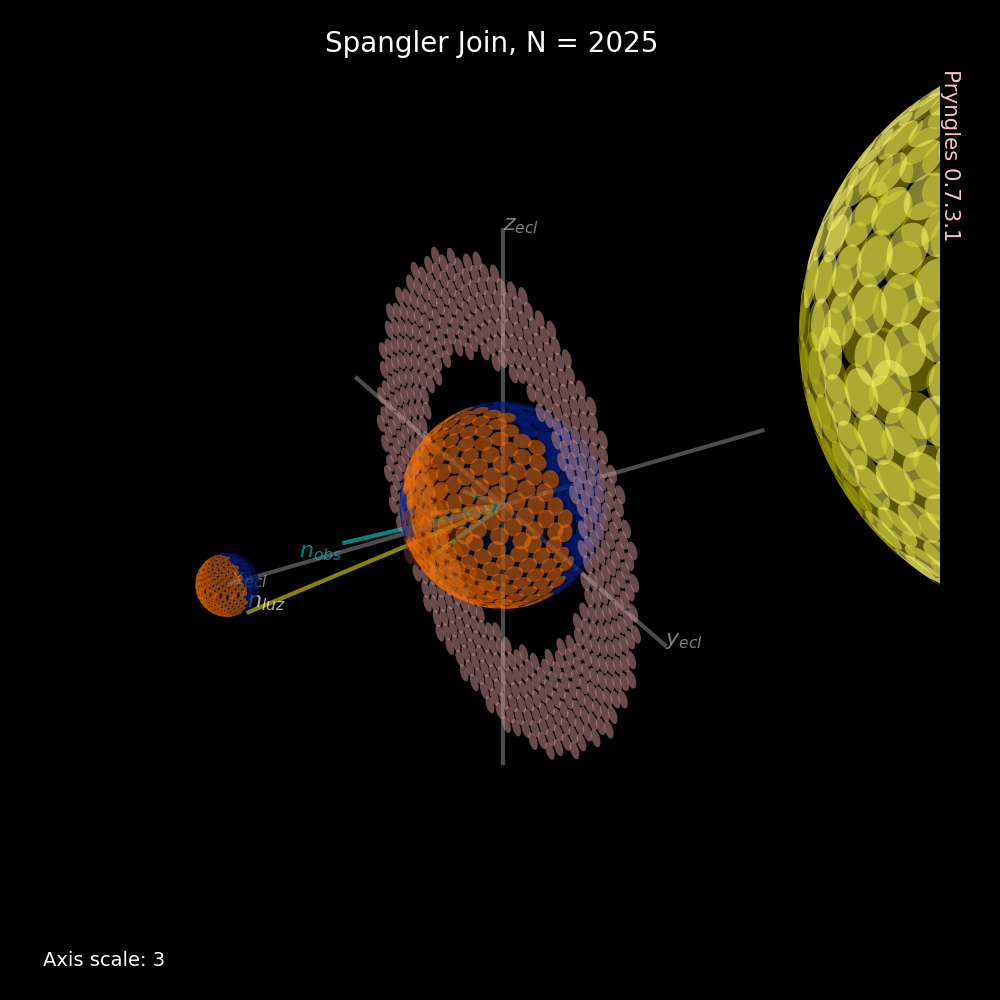

In [84]:
sg.plot3d(center_at="Ring")

You may even interact with the system:

In [85]:
sg._interact_plot2d()

interactive(children=(FloatSlider(value=70.0, continuous_update=False, description='lon_luz', max=360.0, reado…

## System

In [30]:
from pryngles import Consts

In order to create a planetary system you need first to create an object implementing all the required functionalities of the packages:

In [31]:
sys=pr.System()

The system is at first empty (no star, no planets, no rings).  This command simply create a container.  It will be always useful to know what the object contains:

In [32]:
print(sys)

{'rebound': False, '_sim': <rebound.simulation.Simulation object at 0x7f9b43d86140, N=0, t=0.0>, 'units': ['au', 'msun', 'yr'], '_ul': 'au', '_um': 'msun', '_ut': 'yr', 'ul': 149597870700.0, 'um': 1.9884754159665356e+30, 'ut': 31557600.0, 'hashes': {}, 'stars': [], 'planets': [], 'rings': [], 'observers': [], 'Stars': 0, 'Planets': 0, 'Rings': 0, 'Observers': 0, 'nstars': 0, 'nplanets': 0, 'nrings': 0, 'nobservers': 0, 'nbodies': 0}


In [33]:
sys.__dict__

{'rebound': False,
 '_sim': <rebound.simulation.Simulation object at 0x7f9b43d86140, N=0, t=0.0>,
 'units': ['au', 'msun', 'yr'],
 '_ul': 'au',
 '_um': 'msun',
 '_ut': 'yr',
 'ul': 149597870700.0,
 'um': 1.9884754159665356e+30,
 'ut': 31557600.0,
 'hashes': {},
 'stars': [],
 'planets': [],
 'rings': [],
 'observers': [],
 'Stars': 0,
 'Planets': 0,
 'Rings': 0,
 'Observers': 0,
 'nstars': 0,
 'nplanets': 0,
 'nrings': 0,
 'nobservers': 0,
 'nbodies': 0}

Here, you may change the units by instantiating the object as:

```python 
    sys=pr.System(['km','mearth','day'])
```

Now we have a system we may add a star:

In [34]:
S=sys.add(kind="Star")

The default properties of the star may be checked in its properties `orbit`, `physics` and `optics`:

In [35]:
print(f"Orbital properties: {S.orbit}")
print(f"Physical properties: {S.physics}")
print(f"Optical properties: {S.optics}")

Orbital properties: {'m': 1}
Physical properties: {'radius': 1, 'prot': 1, 'wrot': 6.283185307179586}
Optical properties: {'limb_coeffs': [], 'nspangles': 1000}


As you may verify the star is assummed to have a set of default values.  Please recall that all quantities are in the units chosen when the system was defined.  If you want to change the properties, use:

In [36]:
S.update_body(physics=dict(radius=Consts.rsun/sys.ul,prot=25*Consts.day/sys.ut))

In [37]:
print(S.physics)

{'radius': 0.004650467260962157, 'prot': 0.06844626967830253, 'wrot': 91.79733733789377}


Now add a planet:

In [38]:
P=sys.add(kind="Planet",
          primary=S,
          orbit=dict(m=Consts.mearth/sys.um),
          physics=dict(radius=Consts.rearth/sys.ul,prot=24*Consts.hr/sys.ut))

In [39]:
print(f"Orbital properties: {P.orbit}")
print(f"Physical properties: {P.physics}")
print(f"Optical properties: {P.optics}")

Orbital properties: {'m': 3.0034896149157645e-06, 'a': 1.0, 'e': 0.0}
Physical properties: {'radius': 4.26352124542639e-05, 'prot': 0.0027378507871321013, 'wrot': 2294.9334334473438}
Optical properties: {'nspangles': 1000}


Now add a ring around the planet:

In [40]:
R=sys.add(kind="Ring",
          primary=P,
          physics=dict(fi=1.5,fe=2.5,i=30*Consts.deg)
         )
print(f"Orbital properties: {R.orbit}")
print(f"Physical properties: {R.physics}")
print(f"Optical properties: {R.optics}")

Orbital properties: {}
Physical properties: {'fi': 1.5, 'fe': 2.5, 'i': 0.5235987755982988, 'ri': 6.395281868139586e-05, 're': 0.00010658803113565974}
Optical properties: {'nspangles': 1000}


Finally you need an observer:

In [41]:
O=sys.add(kind="Observer")
print(f"Orbital properties: {O.orbit}")
print(f"Physical properties: {O.physics}")
print(f"Optical properties: {O.optics}")

Orbital properties: {}
Physical properties: {}
Optical properties: {'distance': 1, 'beta': 0, 'lamb': 0, 'inclination': 1.5707963267948966}


# The RingedPlanet interface

In [48]:
from pryngles.legacy import *

### Creating a planet

You may create a ringed planet using the default characteristics:

In [49]:
P=RingedPlanet()

Let's check one the attributes of the `RingedPlanet` object:

In [51]:
P.__dict__["physics"]

{'AS': 0.5,
 'AL': 0.5,
 'taug': 1.0,
 'diffeff': 1.0,
 'reflection_rings_law': <function pryngles.legacy.RingedPlanet.<lambda>(x, y)>,
 'wavelength': 5.5e-07,
 'particles': {'q': 3,
  's0': 0.0001,
  'smin': 0.01,
  'smax': 100.0,
  'Qsc': 1,
  'Qext': 2},
 'limb_cs': [0.655]}

The object has a large number of attributes:

In [52]:
len(P.__dict__)

130

I know! these are a lot but what do you expect.

Let's see the planet:

<IPython.core.display.Javascript object>


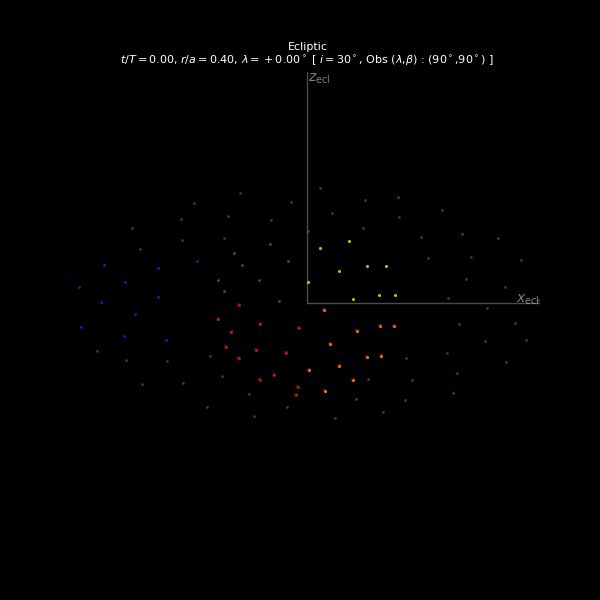

<IPython.core.display.Javascript object>


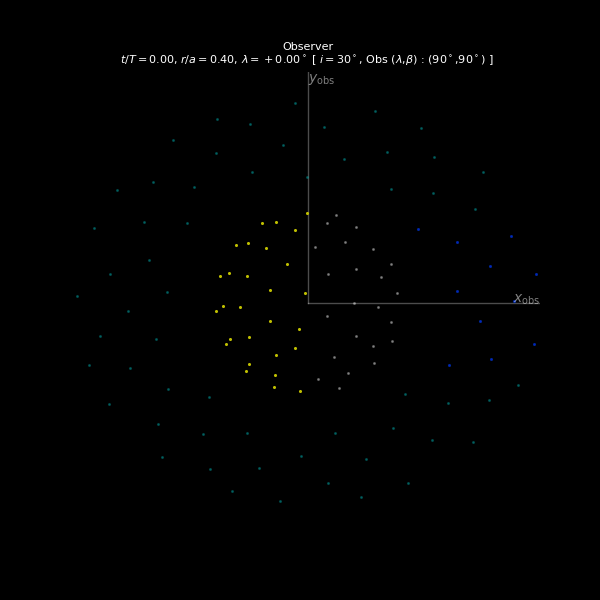

<IPython.core.display.Javascript object>


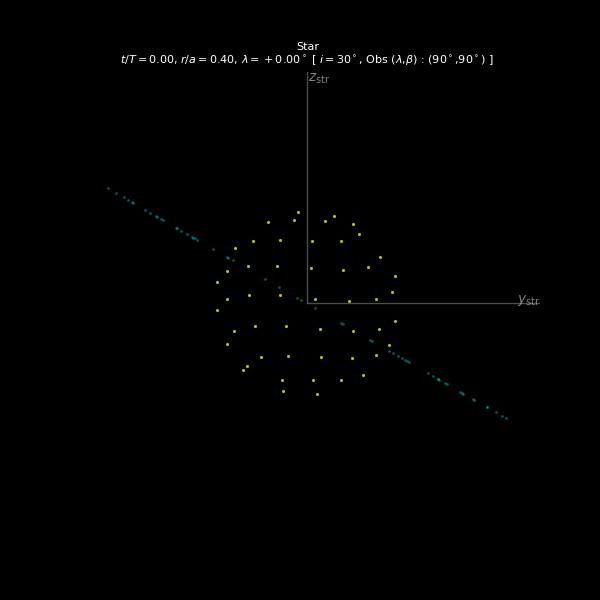

(<Figure size 600x600 with 1 Axes>,
 <Figure size 600x600 with 1 Axes>,
 <Figure size 600x600 with 1 Axes>)

In [53]:
P.plotRingedPlanet()

I also know that this is not what you expect for good resolution. 

If you want a well resolved planet, try this:

In [54]:
P=RingedPlanet(Np=1000,Nr=1000)

And try again plotting:

<IPython.core.display.Javascript object>


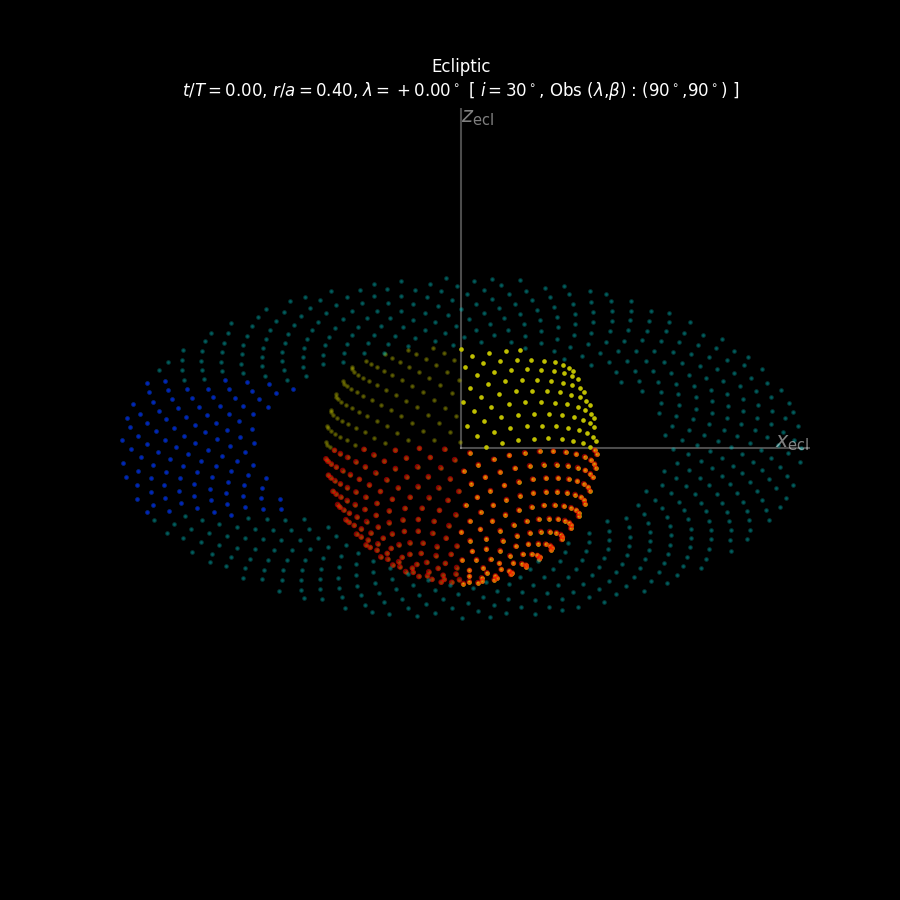

<IPython.core.display.Javascript object>


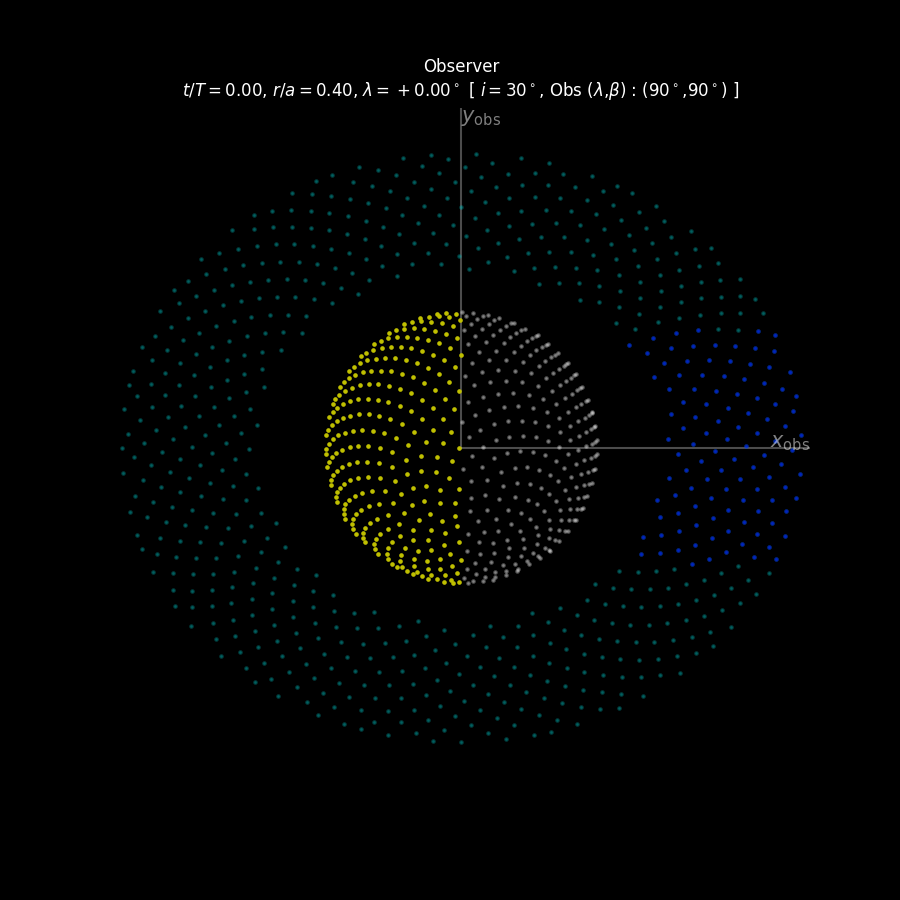

<IPython.core.display.Javascript object>


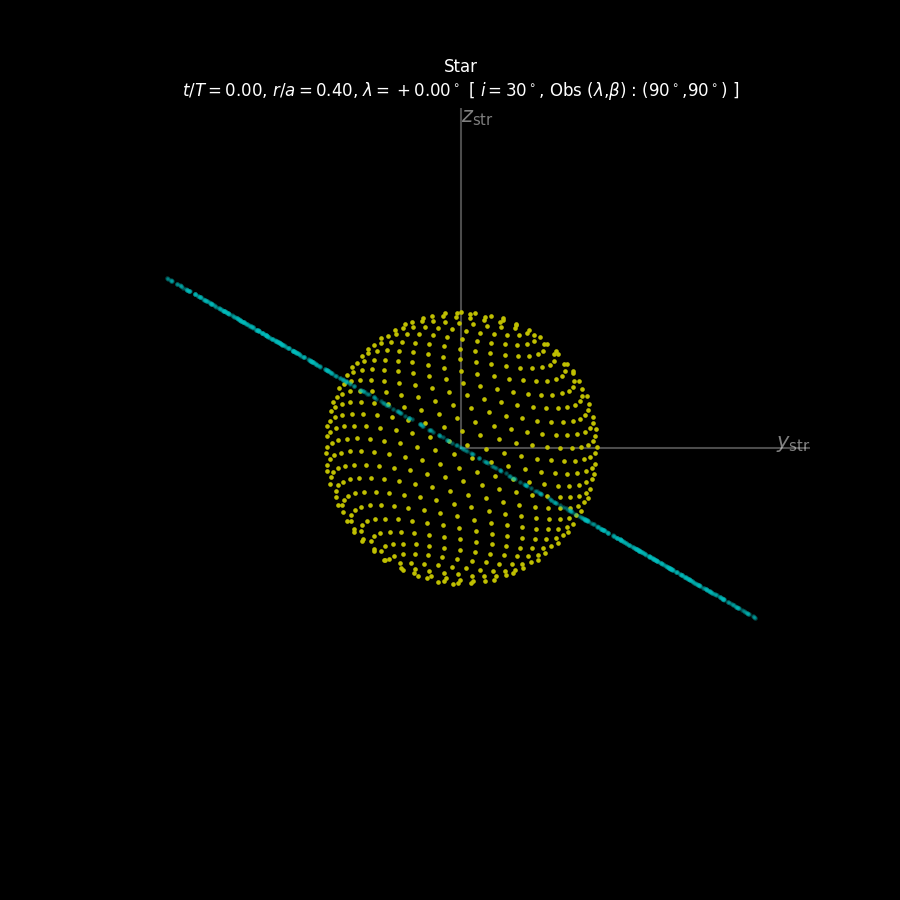

(<Figure size 900x900 with 1 Axes>,
 <Figure size 900x900 with 1 Axes>,
 <Figure size 900x900 with 1 Axes>)

In [48]:
P.plotRingedPlanet()

Oh yeah! much better!

However Jupyter tends to display several plots in a *scrolling* cell.  You can manipulate the plots individually:

<IPython.core.display.Javascript object>


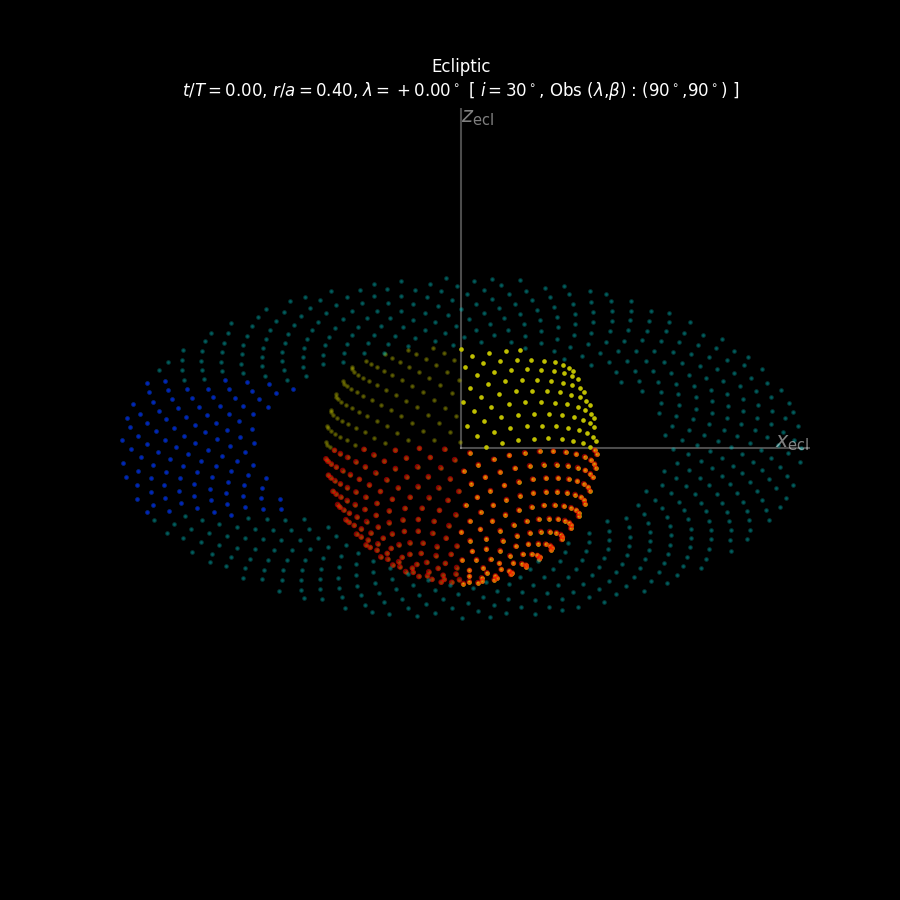

In [49]:
fig1,fig2,fig3=P.plotRingedPlanet(showfig=0)
plt.close("all")
fig1

This is how the planet is seen from the ecliptical plane (the plane of the orbit)

### Animate planet visualization

If you like animations (how the shadow moves around the planet) you can do it with the following commands, but first you need to check if the `convert` of imagemagick is available:

In [50]:
!convert --version

Version: ImageMagick 7.1.0-30 Q16-HDRI arm 19924 https://imagemagick.org
Copyright: (C) 1999 ImageMagick Studio LLC
License: https://imagemagick.org/script/license.php
Features: Cipher DPC HDRI Modules OpenMP(5.0) 
Delegates (built-in): bzlib fontconfig freetype gslib heic jng jp2 jpeg lcms lqr ltdl lzma openexr png ps raw tiff webp xml zlib
Compiler: gcc (4.2)


If not, install it with: `apt-get install imagemagick` (in Linux) of `brew install imagemagick`.

The animation:

In [21]:
P.animateRingedPlanet(nframes=20,figdir="/tmp",animdir="/tmp")
plt.close("all")

100%|██████████| 20/20 [00:05<00:00,  3.85it/s]


Animations generated:
	/tmp/ecliptic-i_3.0e+01-lambobs_9.0e+01-betaobs_9.0e+01.gif
	/tmp/ecliptic-i_3.0e+01-lambobs_9.0e+01-betaobs_9.0e+01.mp4
Animations generated:
	/tmp/observer-i_3.0e+01-lambobs_9.0e+01-betaobs_9.0e+01.gif
	/tmp/observer-i_3.0e+01-lambobs_9.0e+01-betaobs_9.0e+01.mp4
Animations generated:
	/tmp/stellar-i_3.0e+01-lambobs_9.0e+01-betaobs_9.0e+01.gif
	/tmp/stellar-i_3.0e+01-lambobs_9.0e+01-betaobs_9.0e+01.mp4
Cleaning temporal animation images...


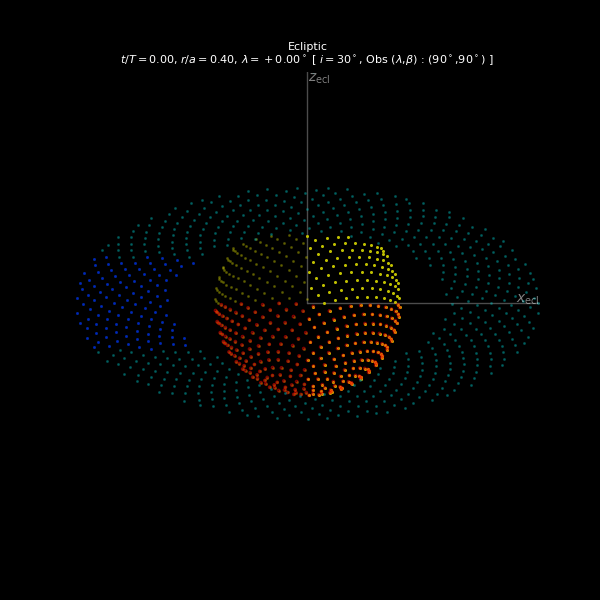

In [22]:
from IPython.display import Image
Image(open("/tmp/ecliptic-i_3.0e+01-lambobs_9.0e+01-betaobs_9.0e+01.gif","rb").read())

### Planet attributes

Now that you have the basics (actually the *graphics* which are by the way pretty amazing!) let's go deeper on the structure of the package.

First we have to check what are the attributes of the planet you may modify.

All the attributes are passed to the *instatiation* method (the method of `RingedPlanet` class you call at the beginning) as optional python arguments, meaning that they are esentially a dictionary.  In the example below we present a dictionary with all the possible attributes you may provide when instantiating a Ringed Planet:

In [33]:
attributes=dict(
    #Behavior
    behavior=dict(shadows=True),
    #Units
    CU=CanonicalUnits(UL=Const.au,UM=Const.Msun),
    #Basic
    Rstar=Const.Rsun/Const.au,Rplanet=Const.Rsat/Const.au,
    Rint=1.5,Rext=2.5,i=30*DEG,a=0.2,e=0.6,
    #Orbit 
    Mstar=1,x=0,lambq=0,t0=0,kepler=False,
    #Observer
    eobs_ecl=np.array([90.0*DEG,90.0*DEG]),
    #Sampling
    Np=100,Nr=100,Nb=100,Ns=30,
    #Physical properties
    physics=dict(
        #Albedos
        AS=0.5,AL=0.5,
        #Ring geometrical opacity
        taug=1.0, #Geometrical opacity
        diffeff=1.0, #Diffraction efficiency
        #Law of diffuse reflection on ring surface
        reflection_rings_law=lambda x,y:x,
        #Observations wavelength
        wavelength=550e-9,
        #Ring particle propeties (see French & Nicholson, 2000)
        particles=dict(q=3,s0=100e-6,smin=1e-2,smax=1e2,Qsc=1,Qext=2),
        #Stellar limb darkening
        limb_cs=[0.6550],
    )
)
P=RingedPlanet(**attributes)

You may read an explanation of each attribute in the *docstring* of the class using the command:

In [34]:
print(RingedPlanet.__doc__)


    Class Ringed Planet.
    
    Conventions:
        cu: Canonical units.
    
    Initialization attributes:
    
        CU = CanonicalUnits(UL=Const.au,UM=Const.Msun): Canonical units used by the calculations.
        
        Planet
            Rplanet = Rsat/au : Radius of the planet, float [au] (0<=Rp)
        Rings:
            Rint=1.5, Rext=2.5: Inner, outer radius of the ring, float [Rp] (1<=Ri, Ri<=Re)
            i = 30 deg: Ring inclination w.r.t. orbital plane, float [rad] (0<=i<pi)
        Star:
            Rstar = Rsun/au : Radius of the star, float [au]
            Mstar=1: Mass of the star, float [cu]
        Orbit:
            a = 0.2 : Stellar-orbit semimajor axis, float [au] (0<a)
            e = 0.6: Stellar-orbit eccentricity, float [adim] (0<=e<1)
            t0=0: Time of passage of the star by periastron, float [cu]
            lambq=0: Longitude of the periastron [rad]
            kepler=False: If True x (see next) is lambda, else x is time, bool
         

Even after you have defined the planet with a given set of attributes, you may change them and update the properties of the planet.  Thus for instance:

In [35]:
P.Nr=P.Np=1000
P.updateProperties()

> **NOTE**: As developer, I do not recommend to change arbitrarily an attribute of the planet.  This may have undesired consequences.  If some key property must be modified it is better to reinstantiate the object:

In [36]:
attributes.update(Nr=1000,Np=1000)
P=RingedPlanet(**attributes)

There are two attributes that can be changed at any time: observer direction and stellar position.

You may for instance be interested on to change stellar position in its orbit:

In [37]:
P.changeStellarPosition(45*DEG)

Let's see the effect:

<IPython.core.display.Javascript object>


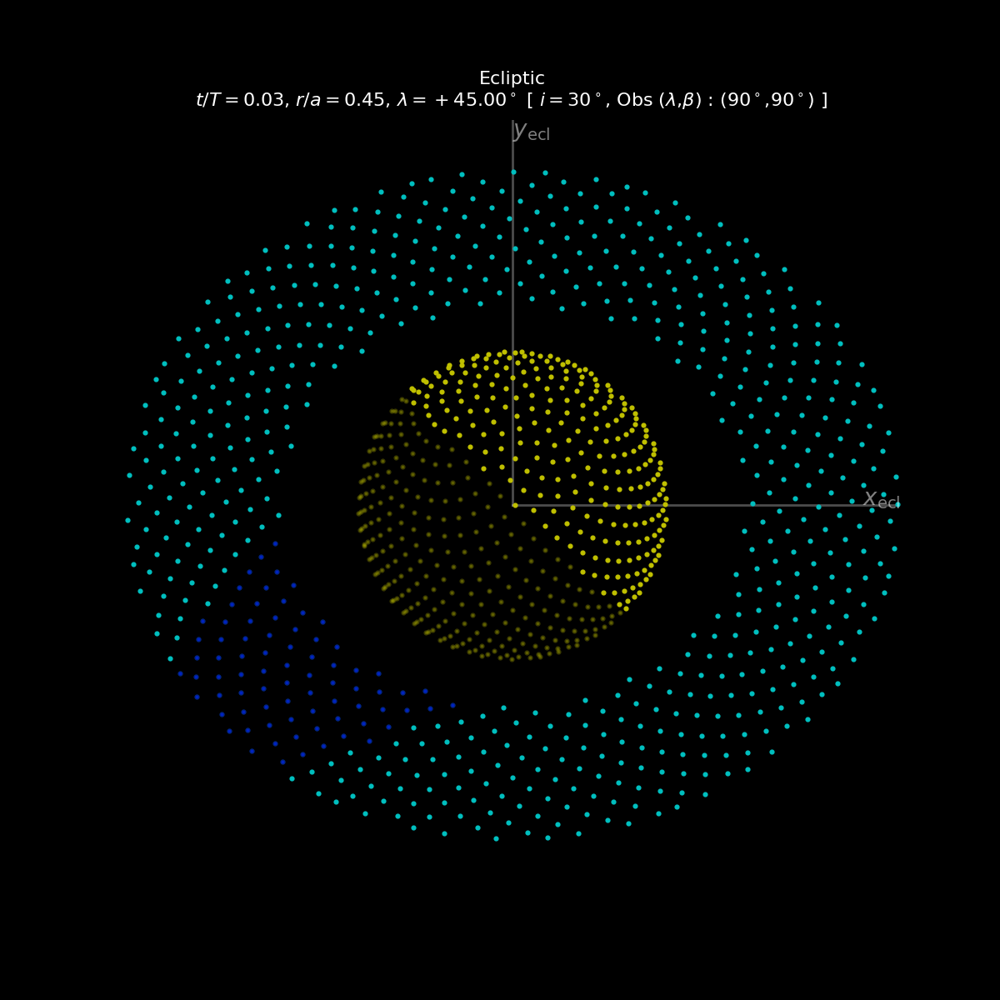

In [38]:
fig1,fig2,fig3=P.plotRingedPlanet(view='top',showfig=0)
plt.close("all")
fig1

Please notice how the illuminated side of the planet and the shadow casted on the ring are now rotated.

To understand why we talk about *stellar position* see the following diagram:

![Stellar orientation](https://raw.githubusercontent.com/seap-udea/pryngles-public/master/gallery/orbit_ring_orientation.png)

As you see we consider that the star is who is actually orbiting the planet (this is a planeto-centric) model.

`fig1` (in the list of figures that `plotRingedPlanet` method produce) is a view in the *Ecliptic* {ecl} system of coordinates.

Actually we recognize other four systems of coordinates (see Figure below):

![System of coordinates in the model](https://raw.githubusercontent.com/seap-udea/pryngles-public/master/gallery/reference_frames.png)

One of the most important systems is that of the observer (magenta axes in the previous figures).  The `fig2` object returned by `plotRingedPlanet` shows you the perspective from this system of reference:

<IPython.core.display.Javascript object>


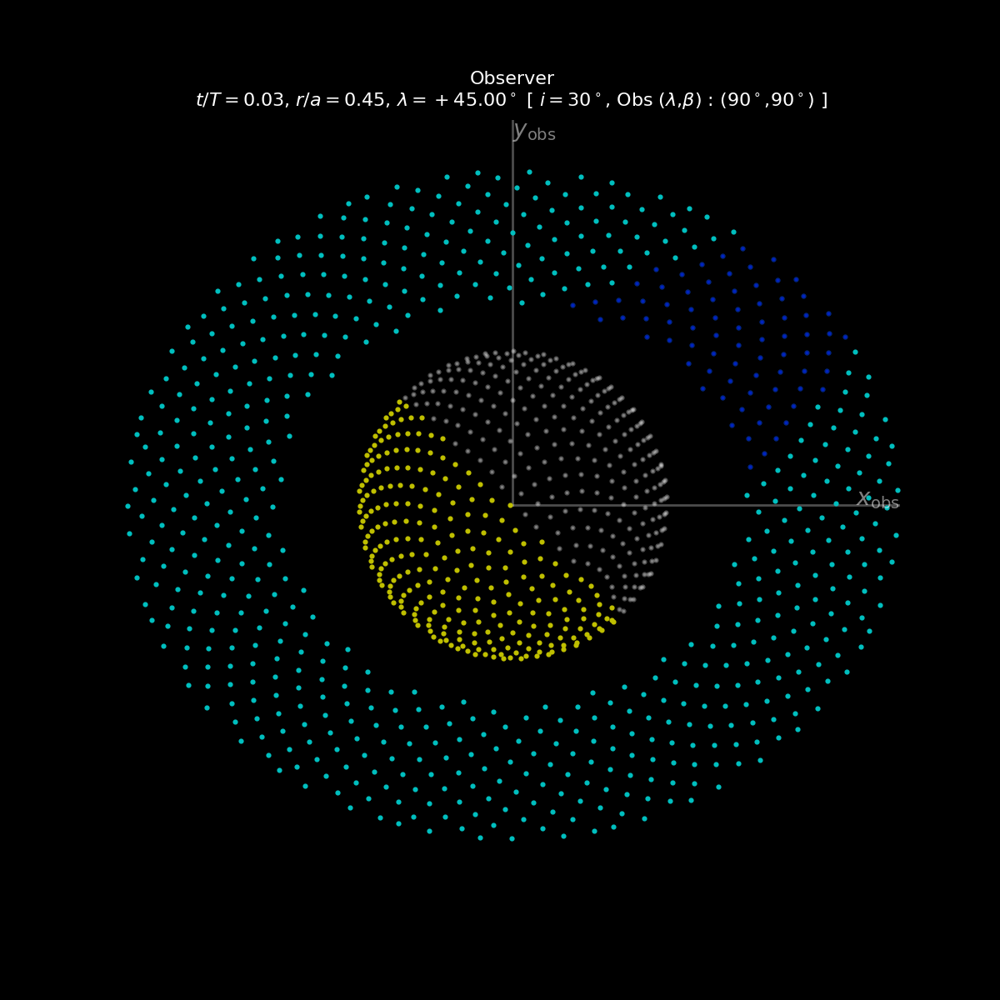

In [39]:
fig2

It is identical to the perspective in the ecliptical system because our observer (by default) is observing the system from above, ie. it is seeing the orbit face on.

Let's change the position of the observer.  This is done by specifying the spherical coordinates in the `{ecl}` system (ecliptical longitude and latitude).  For instance:

In [40]:
P.changeObserver([90.0*DEG,0.0,DEG])

This coordinates places the observer on the x-y plane of the ecliptic (orbital plane) and looking towards the -y axis.  Let's see what the observer sees:

<IPython.core.display.Javascript object>


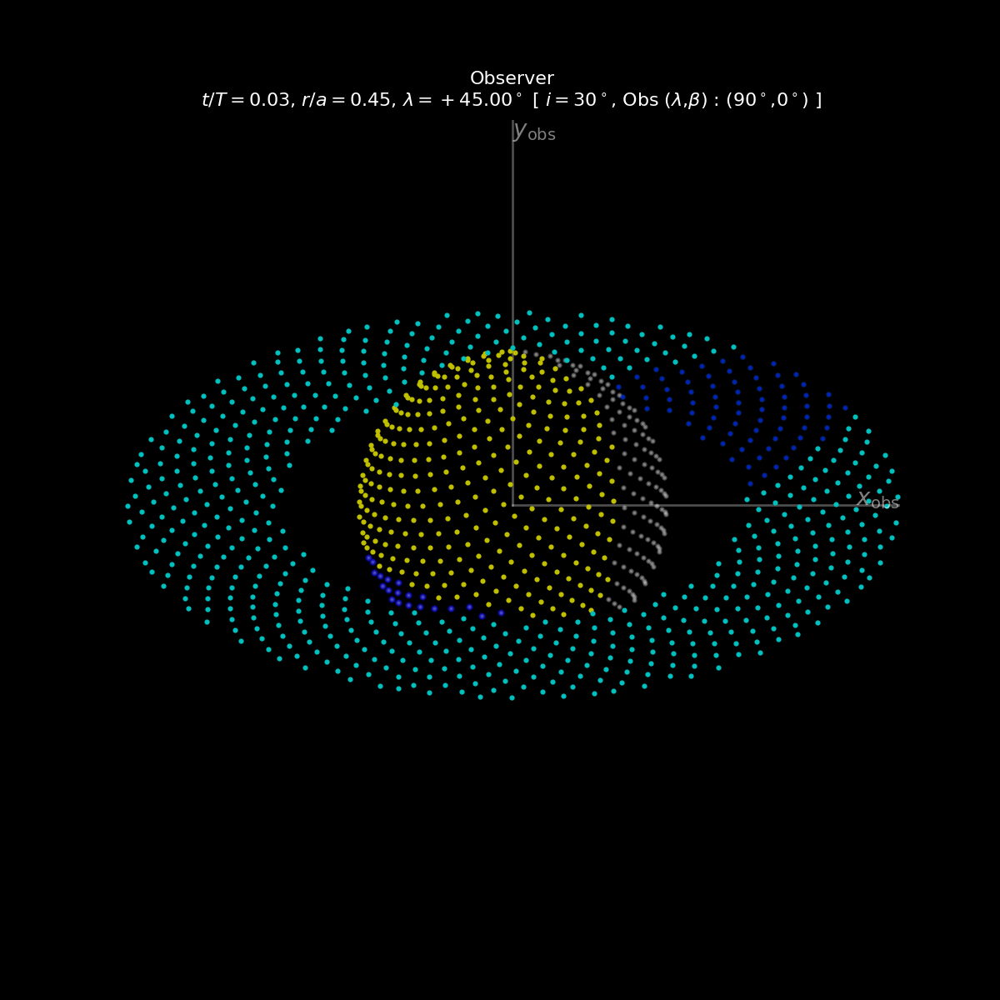

In [41]:
fig1,fig2,fig3=P.plotRingedPlanet(view='top',showfig=0)
plt.close("all")
fig2

Oh yeah! You may probably realize that in this view the model simulates the fact that the observer cannot see part of the ring because the planet is in the middle.  This is not only a graphical attribute of the model, it is very omportant at calculating the light-curve of the system.

You may play around with `P.changeObserver` to understand the meaning of both angles in the argument (remember, they are the ecliptic longitude and latitude of the observer) and with `P.changeStellarPosition`.

<IPython.core.display.Javascript object>


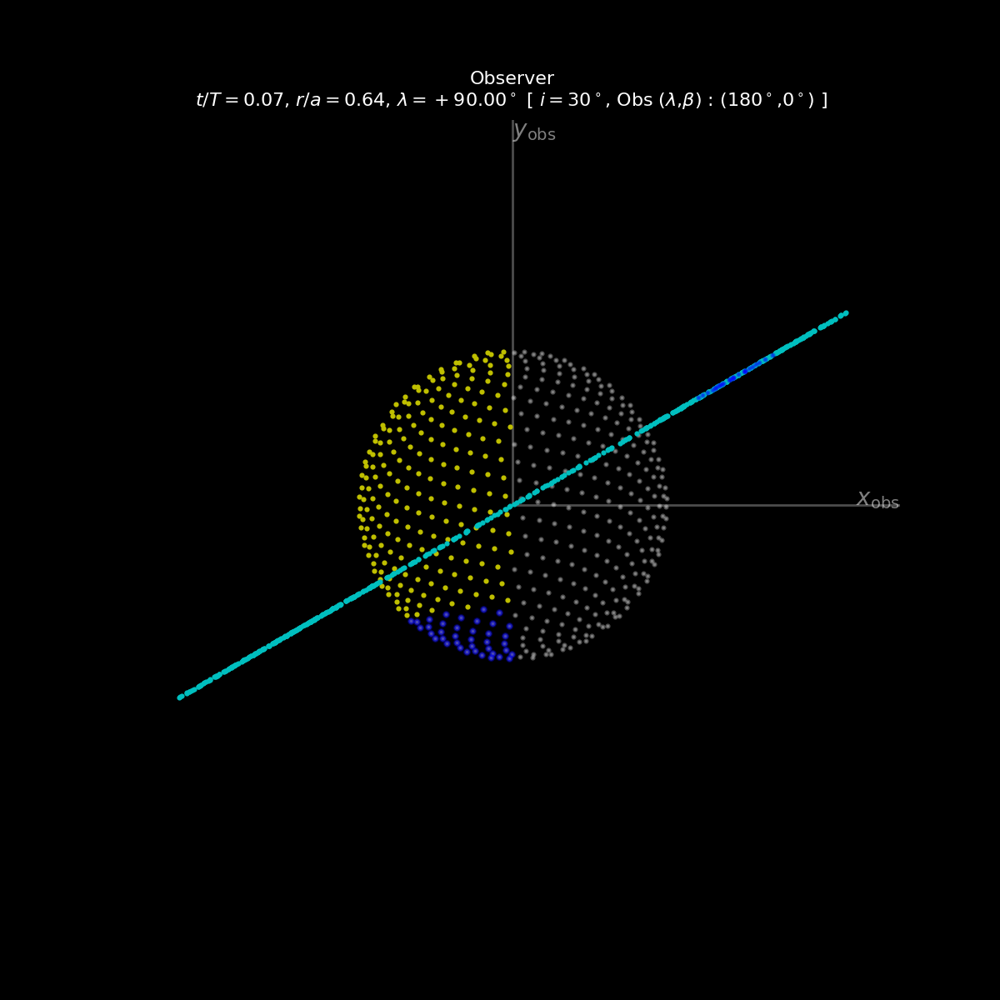

In [42]:
P.changeObserver([180.0*DEG,0.0,DEG])
P.changeStellarPosition(90*DEG)
fig1,fig2,fig3=P.plotRingedPlanet(view='top',showfig=0)
plt.close("all")
fig2

## Transits and occultations

Of course in certain star-planet-observer configurations you may see the planet occulting behind the stellar disk or transiting in front of it.  See for instance:

<IPython.core.display.Javascript object>


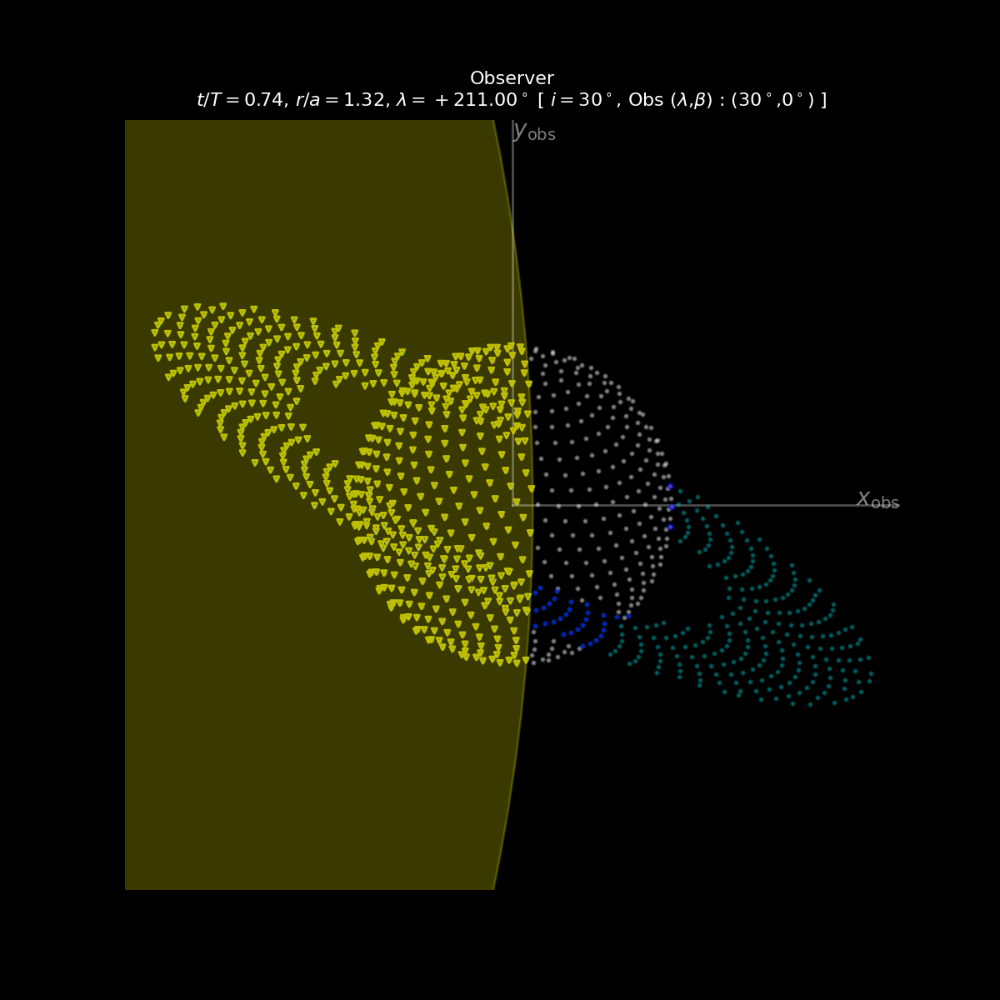

In [43]:
P.changeObserver([+30.0*DEG,0.0,DEG])
P.changeStellarPosition(210*DEG+1*DEG)
fig1,fig2,fig3=P.plotRingedPlanet(showfig=0,showstar=1)
plt.close("all")
fig2

In this case the planet is transiting the star.  And in this case is being occulted by it:

<IPython.core.display.Javascript object>


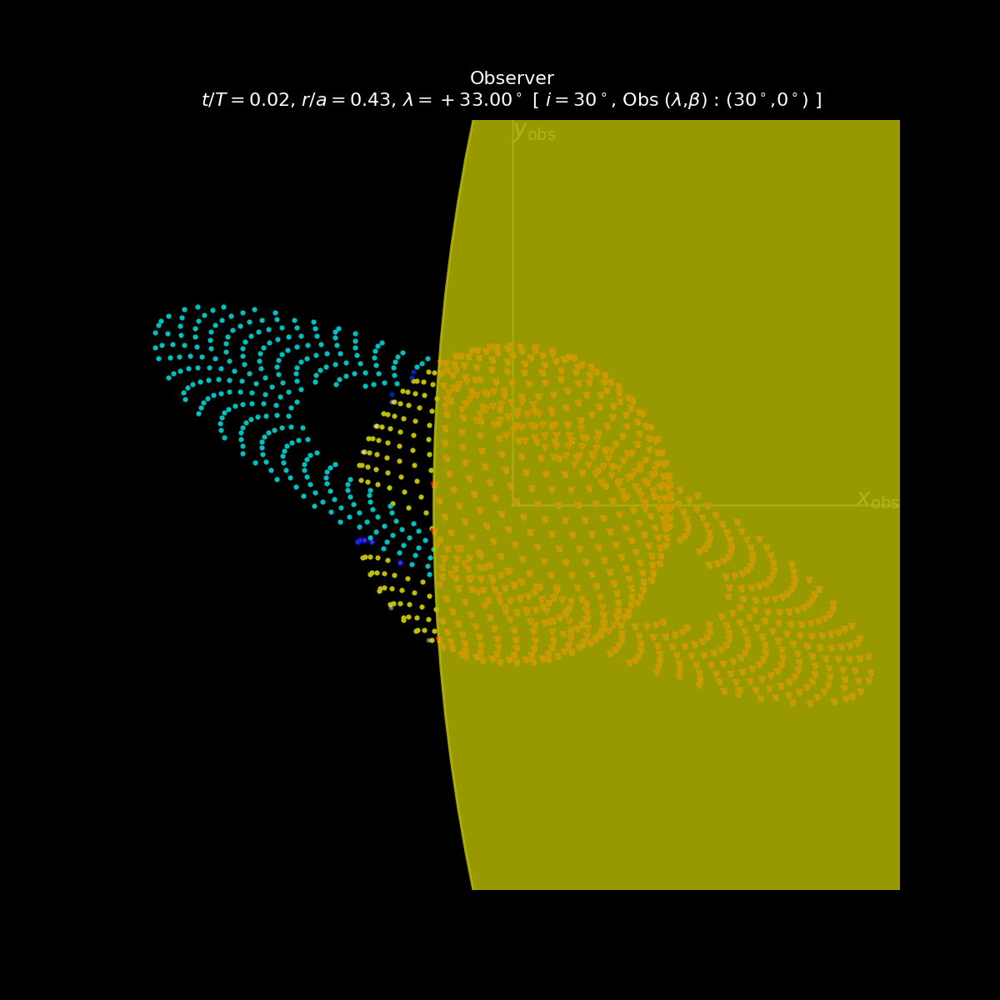

In [44]:
P.changeObserver([+30.0*DEG,0.0,DEG])
P.changeStellarPosition(+30*DEG+3*DEG)
fig1,fig2,fig3=P.plotRingedPlanet(showfig=0,showstar=1)
plt.close("all")
fig2

Notice that in both the ecliptic longitude of the star is slightly (a few degrees) different thant that of the observer (in the occultation case) or that of 180+ecliptic longitude of the observer (in the case of transit).

### Flux computation

Visualtization is great but it is not what pay the bills.  You need to write some papers.

The `pryngles` model was precisely designed to calculate the light reflected by the ringed planet (or absorbed by it when transiting) in different configuration.  This is the *bright-side of the light-curve* part of the package title.

Light-curve computation is hard and we have paid particular attention on to do it well.

In order to compute the light curve we divide the planet and the ring in what we call *spangles* (*sequins* could be a more modern term, but we choose spangles because is nice!).  

Spangles located in the position of the points shown in figures above.  Each spangles have a given set of properties: coordinates in a given system (equatorial, ecliptic or observer), normal vector (in the same set of systems), area and optical properties (Lambertian Albedo).

The number of spangles used for light-curve computations are in this attributes:

In [45]:
P.Np, P.Nr

(1000, 652)

Let's make some simple checkings.  Create a planet excluding ring borders (which are good for visualization but bad for photometry) and with perfect Albedo:

In [46]:
P=RingedPlanet(Nr=1000,Np=1000,Nb=0,physics=dict(AL=1,AS=1))

Let's choose some observer location and stellar position:

In [47]:
P.changeObserver([90*DEG,90*DEG])
P.changeStellarPosition(0.0*DEG)
P.updateOpticalFactors()

Never forget to update optical factors when changing observer and/or stellar positions.

This is the configuration:

<IPython.core.display.Javascript object>


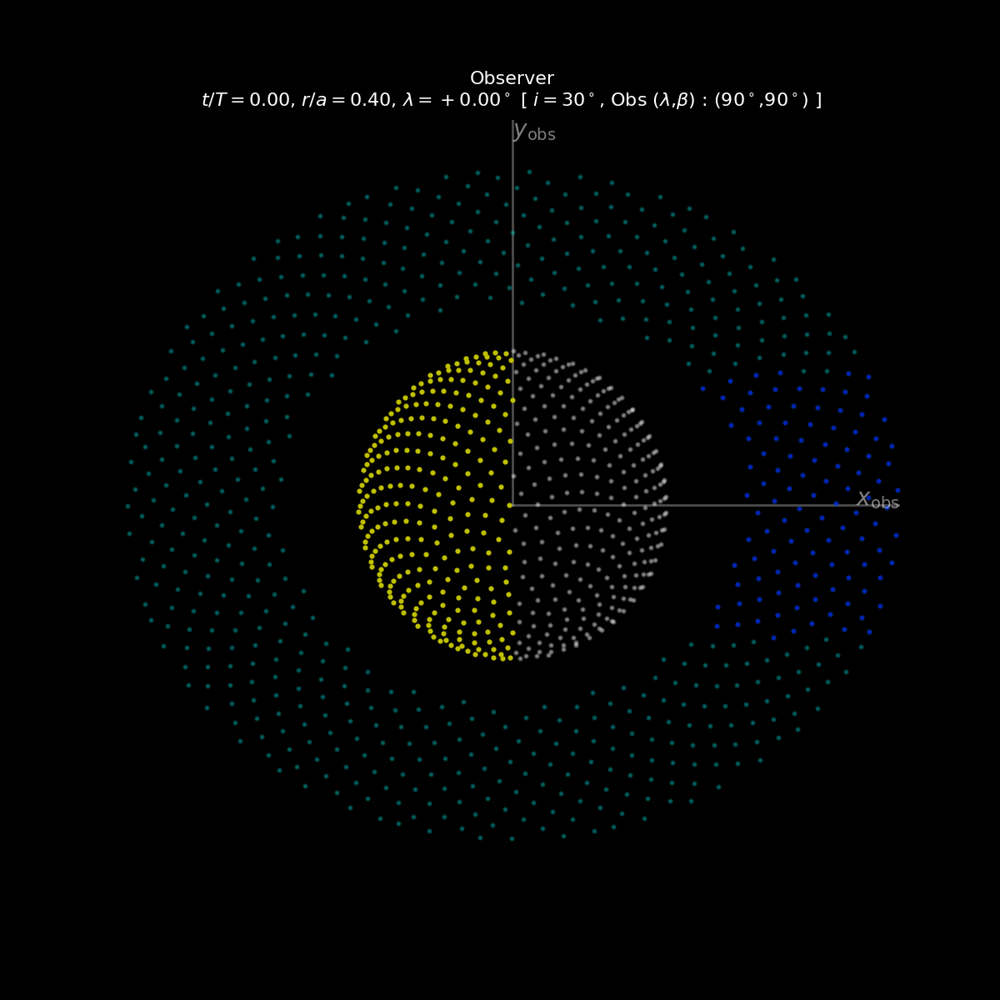

In [48]:
fig1,fig2,fig3=P.plotRingedPlanet(view='top',showfig=0)
plt.close("all")
fig2

### Diffuse reflection on the planet

Let's calculate the light reflected by the planet:

In [49]:
P.updateDiffuseReflection()

This calculate the amount of light reflected on the planetary spangles in an array called `P.Rip`:

In [50]:
P.Rip[-20:]

array([0.00000000e+00, 4.08869424e-09, 0.00000000e+00, 3.45010080e-09,
       3.52560463e-10, 0.00000000e+00, 4.59980808e-09, 0.00000000e+00,
       4.31950155e-10, 2.24049658e-09, 0.00000000e+00, 3.30217269e-09,
       0.00000000e+00, 0.00000000e+00, 2.72625880e-09, 0.00000000e+00,
       1.07716917e-09, 5.66977863e-10, 0.00000000e+00, 9.06780835e-10])

The zero flux is because the spangle is not receiving any light.  

If you want to compute the total amount of light diffusely reflected on the planet use:

In [51]:
Flux_calculated=P.Rip.sum()
Flux_calculated

1.2557017114272911e-06

This flux coincide with what we expect? Normally when a planet has a perfect albedo (AS = 1) and we assume that it is a Lambertian surface, it's normal to assume that light diffusely reflected will be equal to the observed illuminated area (which is half of the effective area, $\pi R_p^2/2$) multiplied by the stellar flux arriving to the planet $1/(4 \pi r^2)$ (the stellar flux is assume to be 1).  Let's see if it coincides:

In [52]:
Flux_expected_tradition=(P.Ap/2)/(4*np.pi*P.rstar**2)
Flux_expected_tradition

2.9593086577575847e-06

Why it is not equal to the calculated one? 

The reason is that at computing the total diffusely reflected flux you need to take into account two geometrical factors: the effective area with which each area element is seen from the star; AND the effective area with which the element is seen from the observer.  

Normally we only take into account the first factor and at doing this you will obtain the regular $\pi R_p^2 / 2$ factor.  However when taking into account the second factor, the effective area of the planet is $2 R_p^2 / 3$:

In [53]:
Flux_expected_real=(2*P.Rp**2/3)/(4*np.pi*P.rstar**2)
Flux_expected_real

1.2559696027113643e-06

For a mathematical demonstration of this important fact, see the papers accompanying [the package](https://pypi.org/project/pryngles/).

#### Diffuse reflection on the ring

To check the diffuse reflection on the ring we need to change the stellar position (and illuminate the ring):

<IPython.core.display.Javascript object>


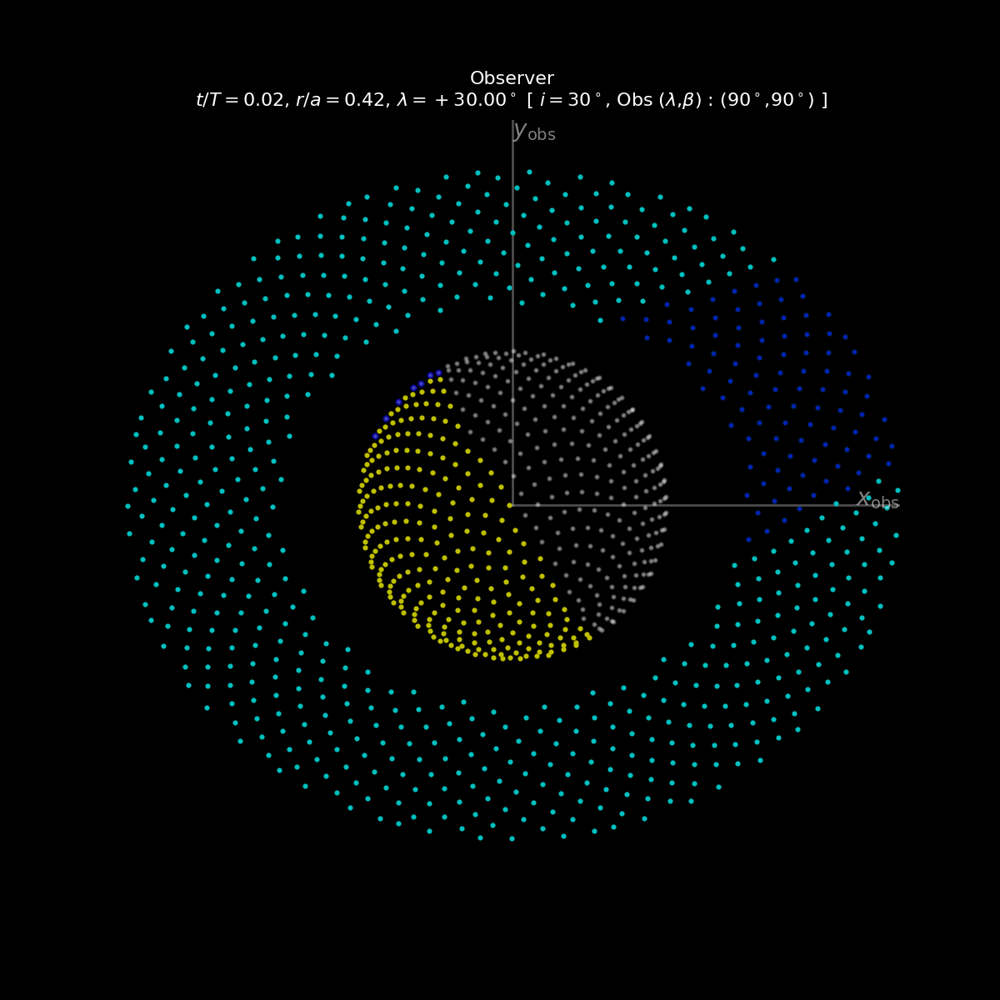

In [54]:
P.changeStellarPosition(30.0*DEG)
P.updateOpticalFactors()
fig1,fig2,fig3=P.plotRingedPlanet(view='top',showfig=0)
plt.close("all")
fig2

Now we have a illuminated ring.  The amount of diffusely reflected light on the ring will be:

In [55]:
P.updateDiffuseReflection()
P.Rir.sum()

3.933307829927049e-06

Let's check our expectations.  If the ring where illuminated and observed normally:

In [56]:
P.Ar/(4*np.pi*P.rstar**2)

2.1355393017690283e-05

But the ring is illuminated in an oblique angle equal to the star declination:

In [57]:
P.estar_equ[1]*RAD

14.477512185929918

So the flux must be:

In [58]:
(P.Ar*np.sin(P.estar_equ[1]))/(4*np.pi*P.rstar**2)

5.338848254422568e-06

And we have to take into account that we are observing the ring with an effective inclination:

In [59]:
P.io*RAD

29.999999999999996

So we also need to correct by the inclination:

In [60]:
(P.Ar*np.sin(P.estar_equ[1])*np.cos(P.io))/(4*np.pi*P.rstar**2)

4.6235782152801514e-06

Still this value does not coincide with `P.Rir.sum()`.  This is because the ring has the shadow casted by the planet.  We can account for this counting the number of ring spangles in the shadow:

In [61]:
P.sr.sum()

97

From a total of:

In [62]:
P.Nr

652

So, the expected flux will be finally:

In [63]:
(P.Ar*(1-P.sr.sum()/P.Nr)*np.sin(P.estar_equ[1])*np.cos(P.io))/(4*np.pi*P.rstar**2)

3.935714585092766e-06

Which now in fact almost coincide with the numerical (the difference is due to resolution).

#### Transit

Let's compute now the transit.  

First let's consider the most simple case of a completely face on ring and no limbdarkening:

In [64]:
P=RingedPlanet(Nr=1000,Np=1000,Nb=0,i=90*DEG,physics=dict(AL=1,AS=1,taug=1,limb_cs=[]))

For doing this we need to place the planet in front of the star:

<IPython.core.display.Javascript object>


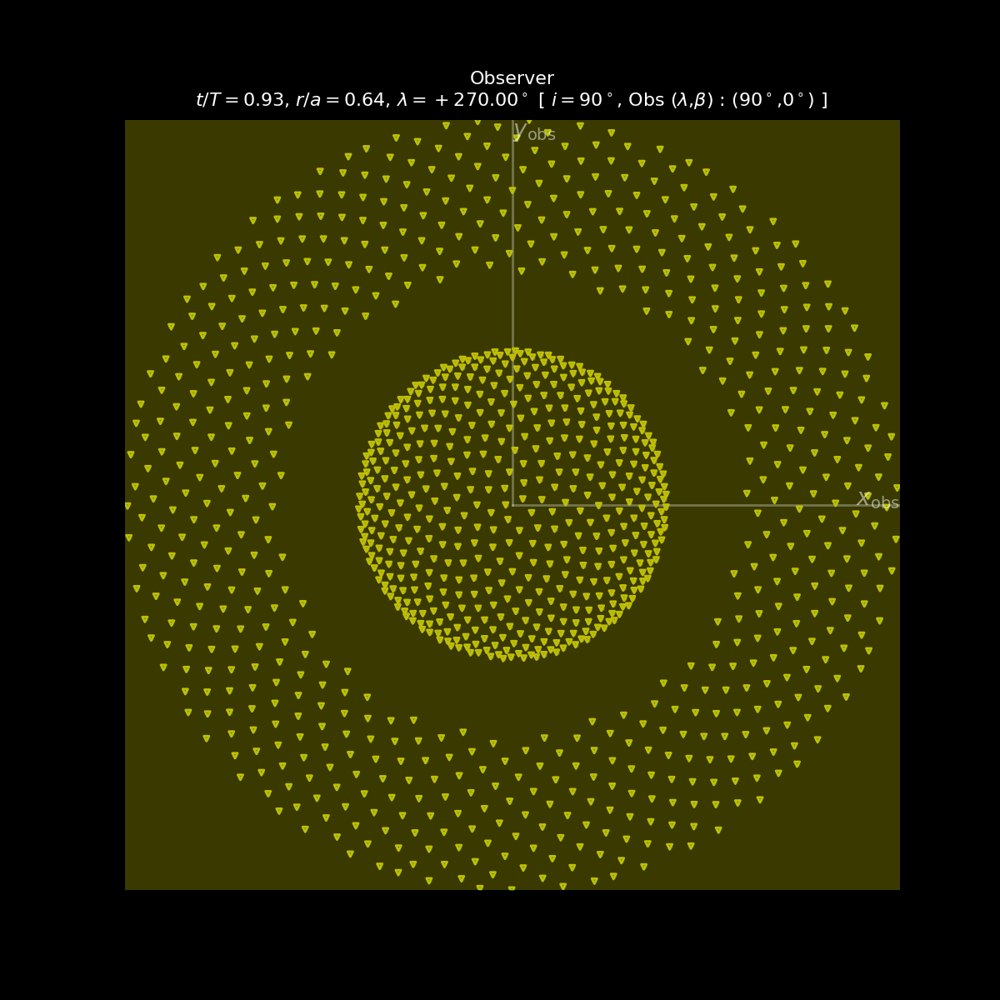

In [65]:
P.changeObserver([90*DEG,0*DEG])
P.changeStellarPosition(+270.0*DEG+0.0*DEG)
P.updateOpticalFactors()
fig1,fig2,fig3=P.plotRingedPlanet(view='top',showfig=0,showstar=1)
plt.close("all")
fig2

Let's compute the attenuation factor, ie. the factor on which the stellar light is attenuated when traversing the ring (rings are not totally opaque).

The area of the planet, the rings and the star (in units where the radius of the star is 1) are:

In [66]:
P.Ap,P.Ar,P.As

(0.022022495411633137, 0.08808998164653253, 3.141592653589793)

There are two opacities involved: the geometrical opacity (`taug`) coming from the geometrical blocking of light caused by ring (mainly large) particles and an effective opacity (`taueff`<`taug`) which take into account the amount of light which is diffracted-out of the direction of the incoming light.  The latest opacity is controlled by another ring attribute called `diffeff` (difraction efficiency) that we assume equal to 1 (all diffracted light is diffracted in the forward direction, so `taueff` = `taug`)

In [67]:
P.taug,P.taueff

(1, 1.0)

The amount of light transmitted by the rings (or better substracted from the star) is proportional to the attenuation factor:

In [68]:
Util.attenuationFactor([np.cos(P.io)],P.taueff)

array([0.13533528])

Of a unit of stellar flux, the amount of light transmitted through the rings is:

In [69]:
beta=1-Util.attenuationFactor([np.cos(P.io)],P.taueff)
beta

array([0.86466472])

We need to take also into account that when transiting the planet and the rings blocked only a small portion of the star whose intensity is calculated with the limb darkening formula.  The flux coming from the center point of the star is:

In [70]:
Io=Util.limbDarkening(0,cs=P.limb_cs,N=P.normlimb)
Io

0.3183098861837907

It is not 1 because only the integral of $I$ across the star surface should be equal to 1.

Now we are ready to compute the transit flux anomaly:

In [71]:
P.updateTransit()

The amount of light blocked by the planet is:

In [72]:
P.Tip.sum()

0.007009978007959997

We can compare it with the theoretical expectation:

In [73]:
P.Ap*Io

0.007009978007959996

Oh yeah!

Now, let's check the ring case:

In [74]:
P.Tir.sum()

0.02424512259508122

That should be compared with the theoretical one:

In [75]:
P.Ar*Io*beta

array([0.02424512])

And again, they coincide. So far, so good.

Let's check a more complex case.  The case of an inclined ring where the ring is overlaped with the planet:

<IPython.core.display.Javascript object>


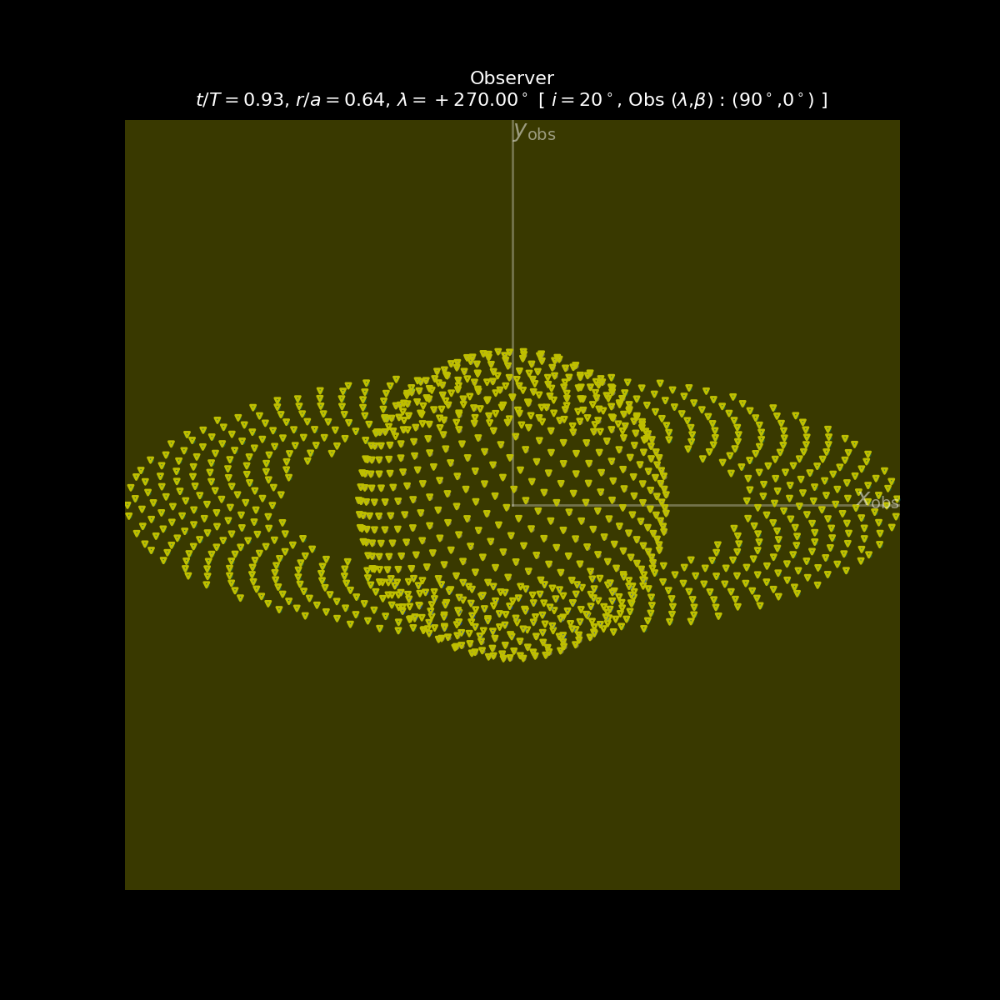

In [76]:
P=RingedPlanet(Nr=1000,Np=1000,Nb=0,i=20*DEG,physics=dict(AL=1,AS=1,taug=1,limb_cs=[]))
P.changeObserver([90*DEG,0*DEG])
P.changeStellarPosition(+270.0*DEG+0.0*DEG)
P.updateOpticalFactors()
fig1,fig2,fig3=P.plotRingedPlanet(view='top',showfig=0,showstar=1)
plt.close("all")
fig2

The attenuation factor is now:

In [77]:
beta=1-Util.attenuationFactor([np.cos(P.io)],P.taug)[0]
beta

0.9915595795501764

A little bit larger than the normal case.

In Zuluaga et al. (2015) they develop a formula to compute the total flux captured by a ringed planet when is completely inside the stellar disk.  It is their Eq. (2) that we include in the package:

In [78]:
Arp=Util.calcRingedPlanetArea(P.Rp,P.fi,P.fe,P.io,beta)
Arp*Io

0.014133987733465114

Let's check out model:

In [79]:
P.updateTransit()
P.Tip.sum()+P.Tir.sum()

0.014185684280067595

And again, they pretty agree inside the precision the resolution allows.

Let's see what happen in the border.  For this we need the stellar apparent size as seen from the planet:

In [80]:
thetas=P.thetas
thetas*RAD

2.0801448478721913

And use it for setting the longitude of the star:

<IPython.core.display.Javascript object>


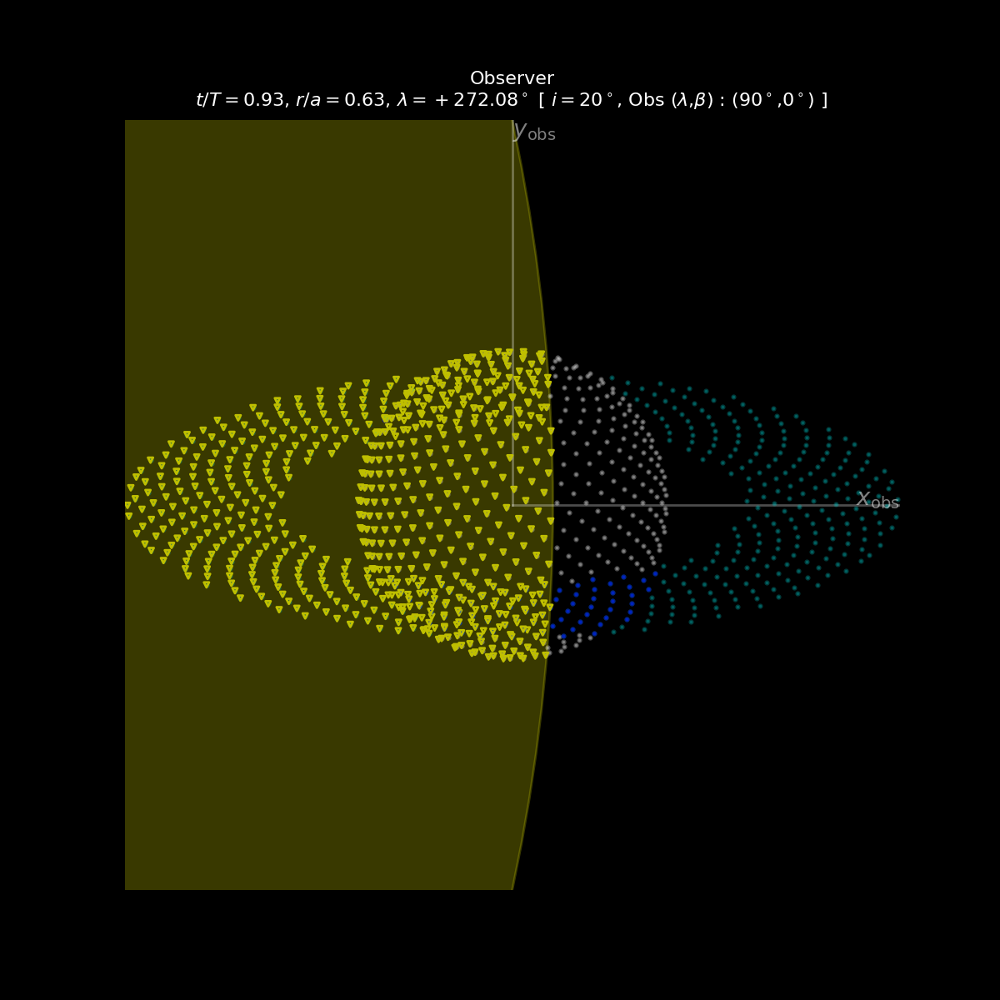

In [81]:
P=RingedPlanet(Nr=1000,Np=1000,Nb=0,i=20*DEG,physics=dict(AL=1,AS=1,taug=1,limb_cs=[]))
P.changeObserver([90*DEG,0*DEG])
P.changeStellarPosition(+270.0*DEG+thetas)
P.updateOpticalFactors()
fig1,fig2,fig3=P.plotRingedPlanet(view='top',showfig=0,showstar=1)
plt.close("all")
fig2

In [82]:
P.updateTransit()
P.Tip.sum()+P.Tir.sum()

0.00828399561142058

As expected this is almost half of the value that when the star is in the middle.

#### Occultation

What about occultations? (secondary transit) You ask it, you have it!

Let's first compute the diffusely reflected light from the planet and the ring just before occultation:

<IPython.core.display.Javascript object>


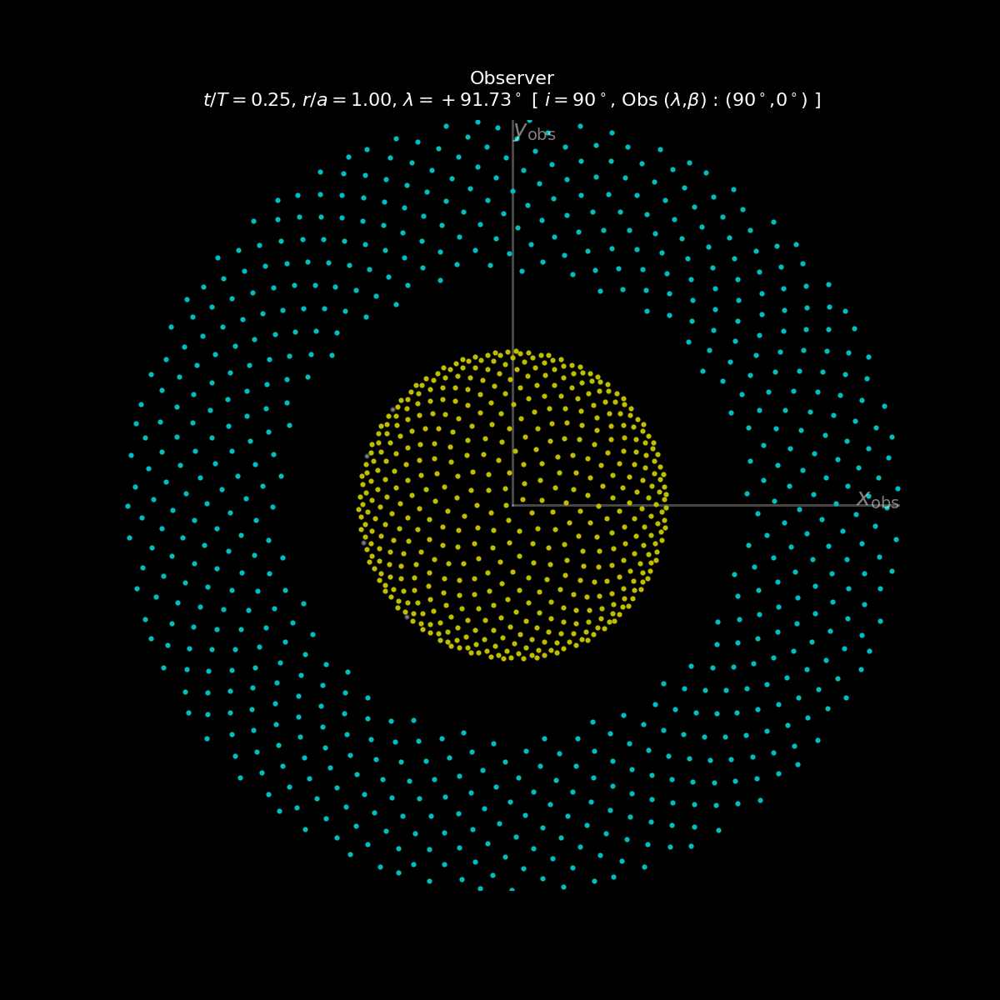

In [83]:
P=RingedPlanet(Nr=1000,Np=1000,Nb=0,i=90*DEG,a=0.2,e=0,
               physics=dict(AL=1,AS=1,taug=1,limb_cs=[]))
P.changeObserver([90*DEG,0*DEG])
P.changeStellarPosition(+90.0*DEG)
P.changeStellarPosition(+90.0*DEG+1.3*P.thetas)
fig1,fig2,fig3=P.plotRingedPlanet(view='top',showfig=0,showstar=1)
plt.close("all")
fig2

In [84]:
(2*P.Rp**2/3)/(4*np.pi*P.rstar**2),P.Ar/(4*np.pi*P.rstar**2),(np.pi*P.Rp**2+P.Ar)/(4*np.pi*P.rstar**2)

(2.009551364338183e-07, 3.787915081929708e-06, 4.734893852412135e-06)

In [85]:
P.updateOpticalFactors()
P.updateDiffuseReflection()

In [86]:
P.Rip.sum()+P.Rir.sum()

4.414834567232602e-06

And now during occultation:

<IPython.core.display.Javascript object>


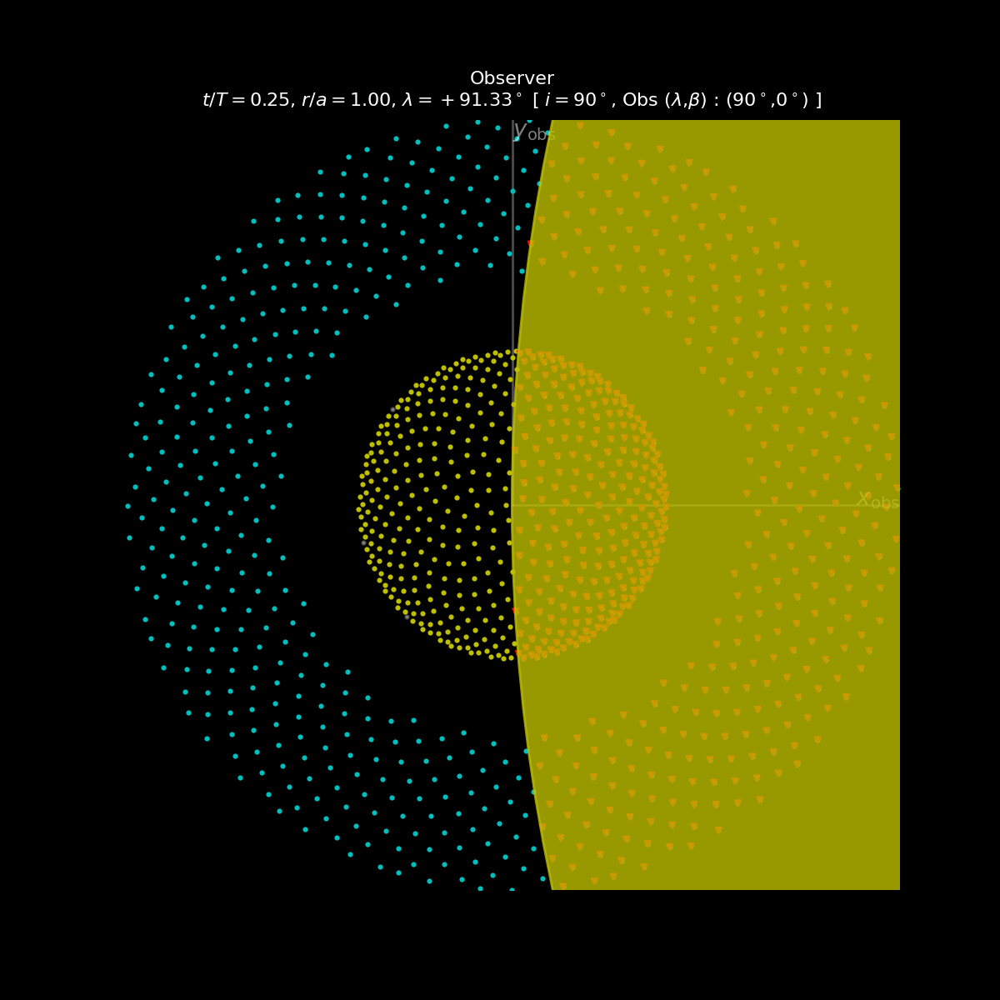

In [87]:
P.changeStellarPosition(+90.0*DEG+P.thetas)
fig1,fig2,fig3=P.plotRingedPlanet(view='top',showfig=0,showstar=1)
plt.close("all")
fig2

In [88]:
P.updateOpticalFactors()
P.updateDiffuseReflection()
P.Rip.sum()+P.Rir.sum()

2.3151169007468882e-06

Which, as expected is almost half of the previous value.

#### Planet and ring shine

The light diffusely reflected on the planet may shine on the rings and viceversa, this is called *planet or ring shine* 

<IPython.core.display.Javascript object>


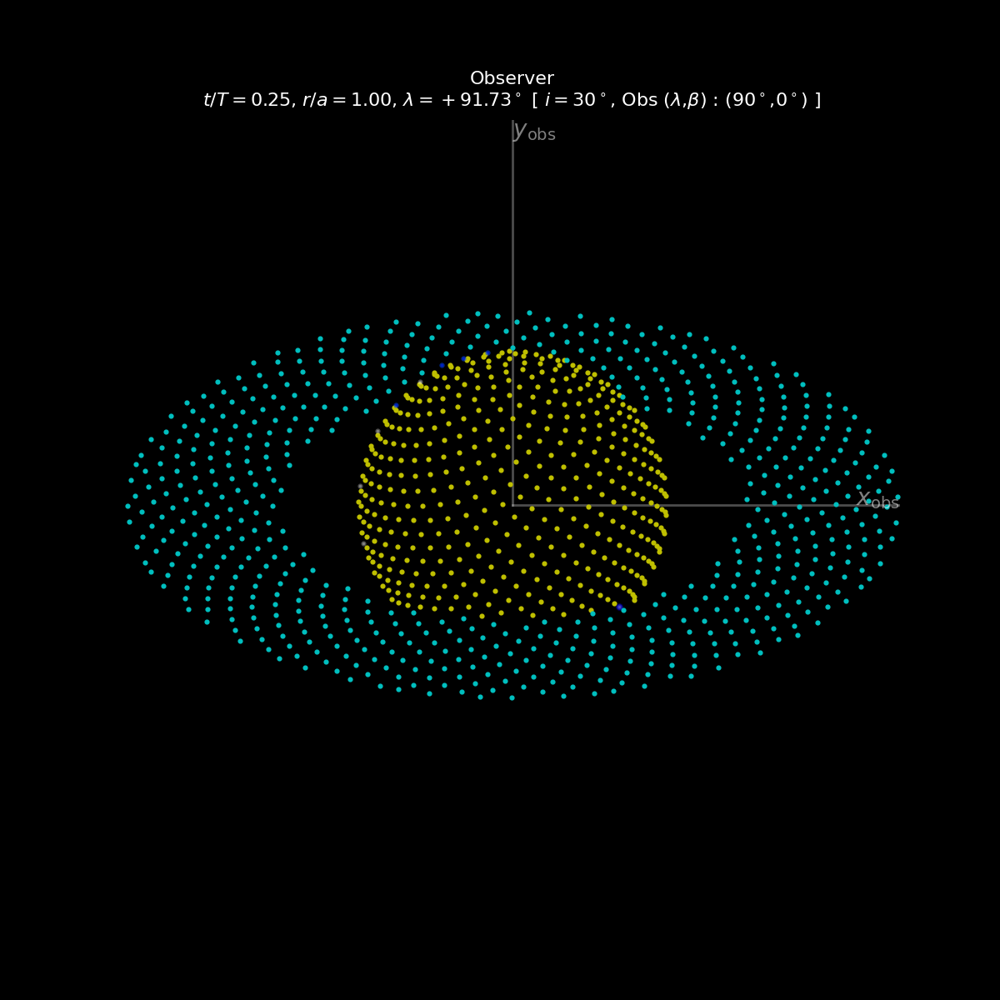

In [89]:
P=RingedPlanet(Nr=1000,Np=1000,Nb=0,i=30*DEG,a=0.2,e=0,physics=dict(AL=1,AS=1,taug=1))
P.changeObserver([90*DEG,0*DEG])
P.changeStellarPosition(+90.0*DEG)
P.changeStellarPosition(+90.0*DEG+1.3*P.thetas)
fig1,fig2,fig3=P.plotRingedPlanet(view='top',showfig=0,showstar=1)
plt.close("all")
fig2

Let's compute it:

In [90]:
P.updateOpticalFactors()
P.updateDiffuseReflection()
P.updateShine()
P.Rip.sum(),P.Sip.sum()+P.Sir.sum()

(5.969294696366594e-07, 1.0178024466327593e-08)

As you can see the effect is between 1 and 2 order of magnitude smaller than the diffuse reflection, but it is there!

### Light-curve

Now we have the elements to make a real light-curve.  

Let's start with something we really know: transits!

#### Transit light-curve

First let's create a ringed planet orbited by a close-in star:

In [91]:
P=RingedPlanet(Nr=1000,Np=1000,Nb=0,i=30*DEG,a=0.2,e=0,physics=dict(AL=1,AS=1,taug=1))

Lest place the planet at the beginning of the transit:

<IPython.core.display.Javascript object>


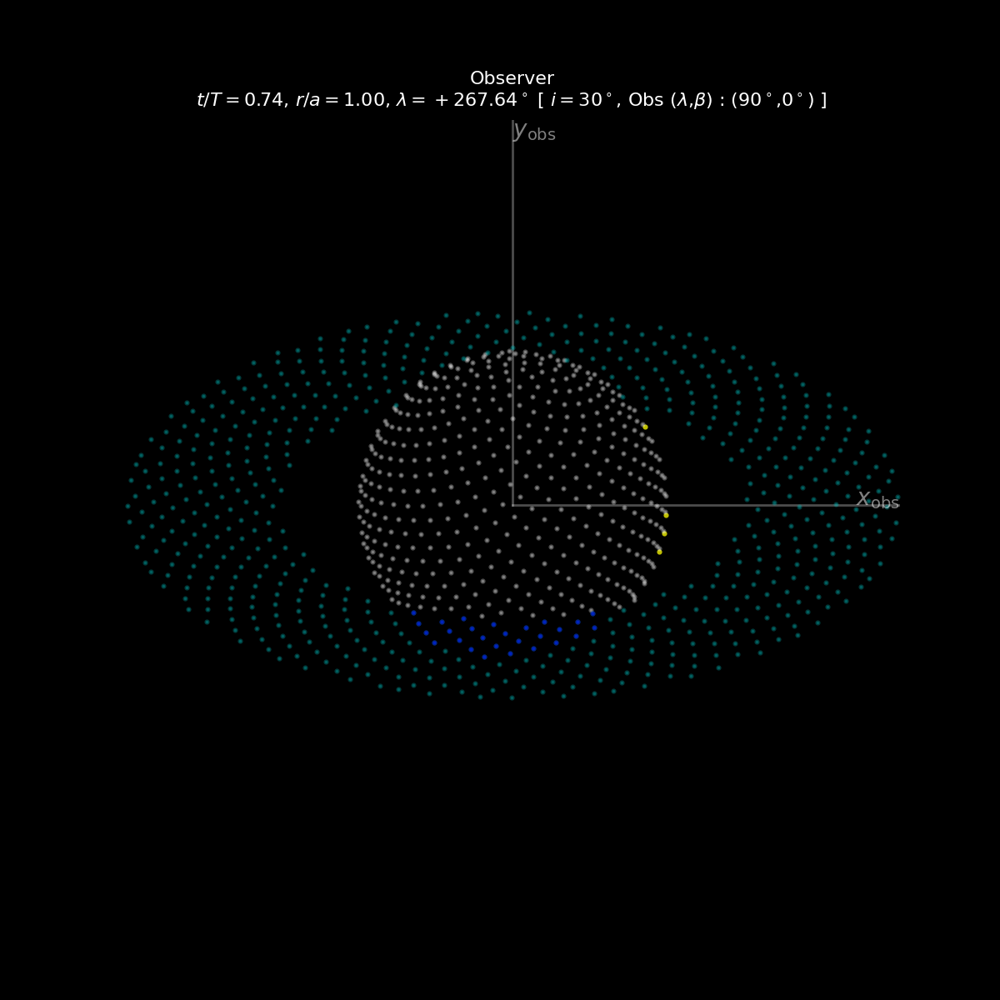

In [92]:
P.changeObserver([90*DEG,0*DEG])
P.changeStellarPosition(+90.0*DEG)
P.changeStellarPosition(+270.0*DEG-thetas-P.fe*P.thetap)
fig1,fig2,fig3=P.plotRingedPlanet(view='top',showfig=0,showstar=1)
plt.close("all")
fig2

And loop:

In [93]:
lamb_initial=+270.0*DEG-thetas-P.fe*P.thetap
lamb_final=+270.0*DEG+thetas+P.fe*P.thetap
lambs=np.linspace(lamb_initial,lamb_final,100)
Tps=[]
Ts=[]
for lamb in lambs:
    P.changeStellarPosition(lamb)
    P.updateOpticalFactors()
    P.updateTransit()
    Tp=P.Tip.sum()
    T=Tp+P.Tir.sum()
    Tps+=[Tp]
    Ts+=[T]

And plot:

<IPython.core.display.Javascript object>


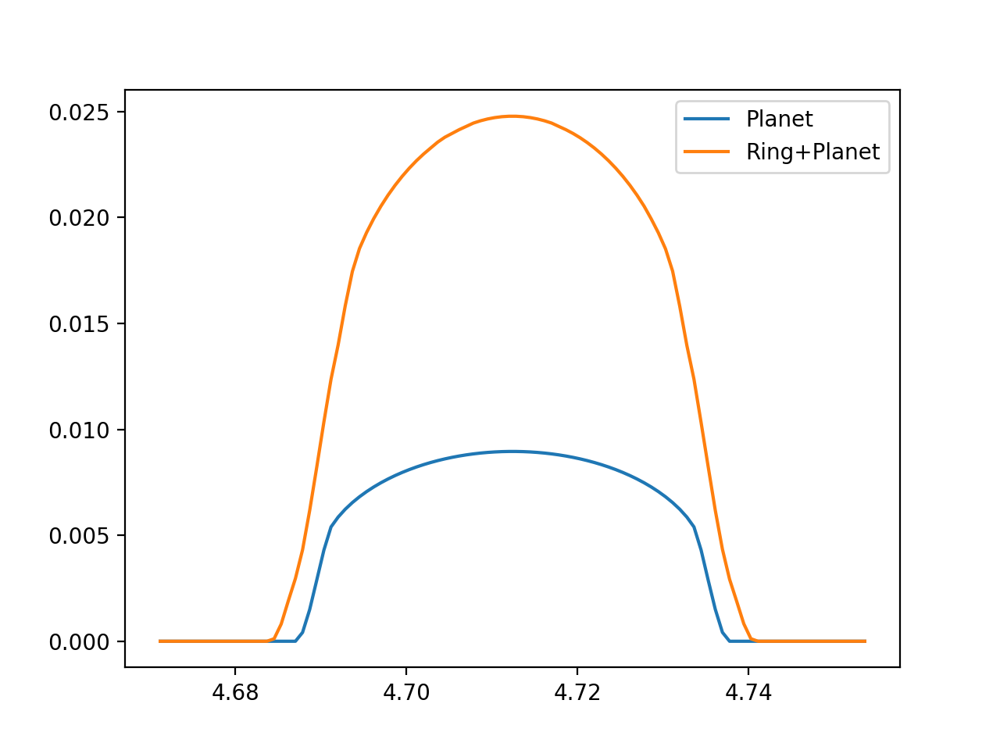

In [94]:
fig=plt.figure()
ax=fig.gca()

ax.plot(lambs,Tps,label="Planet")
ax.plot(lambs,Ts,label="Ring+Planet")
ax.legend()

Oh yeah!

The units in the horizontal axis are not very undertandable.  They are radians and we are used to time since middle transit.  On the other hand we are used to see T as a negative quantity.  

This is how we can make this plot similar to what we have been used to:

<IPython.core.display.Javascript object>


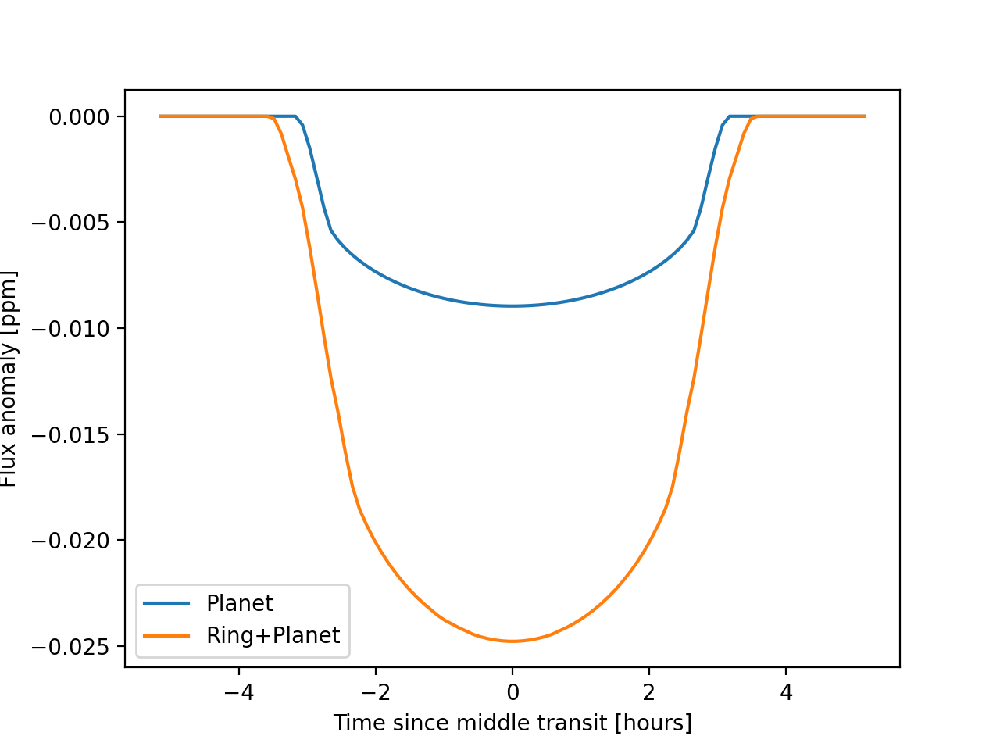

In [95]:
lamb_initial=+270.0*DEG-thetas-P.fe*P.thetap
lamb_final=+270.0*DEG+thetas+P.fe*P.thetap
lambs=np.linspace(lamb_initial,lamb_final,100)
Tps=[]
Ts=[]
ts=[]
for lamb in lambs:
    P.changeStellarPosition(lamb)
    #This attribute keeps the value of time
    t=P.t*P.CU.UT
    
    #Compute transit
    P.updateOpticalFactors()
    P.updateTransit()
    Tp=P.Tip.sum()
    T=Tp+P.Tir.sum()
    
    ts+=[t]
    Tps+=[Tp]
    Ts+=[T]
    
ts=np.array(ts)
Ts=np.array(Ts)
Tps=np.array(Tps)

#Middle transit
tmed=(ts[-1]+ts[0])/2
ts=(ts-tmed)/Const.hours


#Plot
fig=plt.figure()
ax=fig.gca()    
ax.plot(ts,-Tps,label="Planet")
ax.plot(ts,-Ts,label="Ring+Planet")

ax.set_xlabel("Time since middle transit [hours]")
ax.set_ylabel("Flux anomaly [ppm]")

ax.legend()

#### Occultation light-curve

<IPython.core.display.Javascript object>


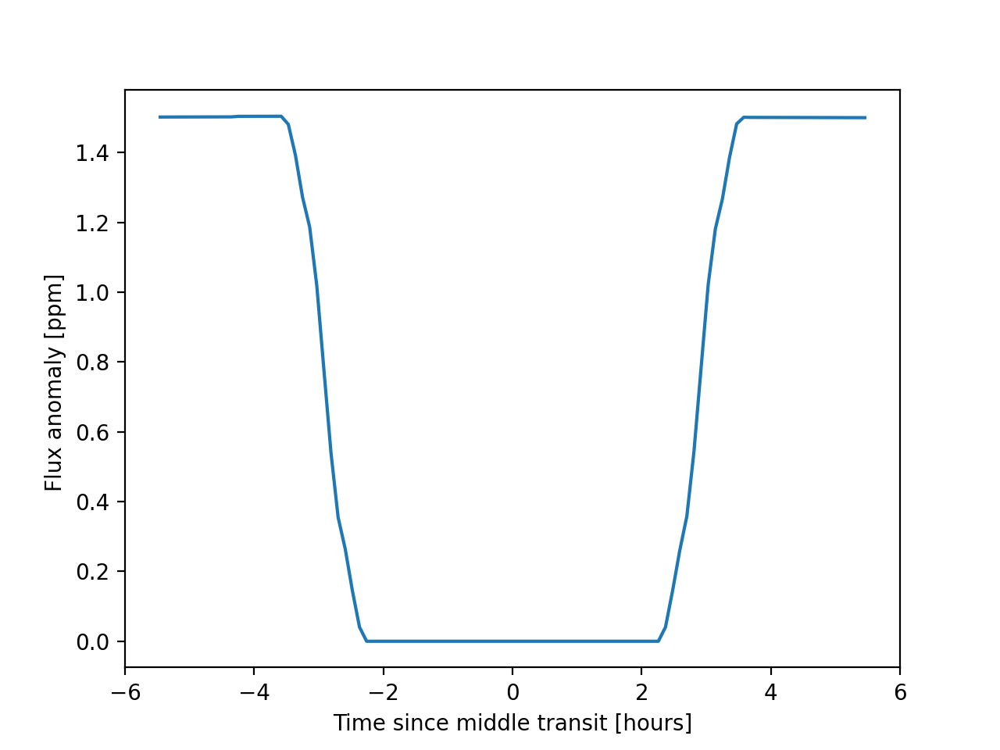

Text(0, 0.5, 'Flux anomaly [ppm] ')

In [96]:
lamb_initial=+90.0*DEG-(thetas+1.5*P.fe*P.thetap)
lamb_final=+90.0*DEG+(thetas+1.5*P.fe*P.thetap)
lambs=np.linspace(lamb_initial,lamb_final,100)
Rs=[]
ts=[]
for lamb in lambs:
    P.changeStellarPosition(lamb)
    #This attribute keeps the value of time
    t=P.t*P.CU.UT
    
    #Compute transit
    P.updateOpticalFactors()
    P.updateDiffuseReflection()
    
    ts+=[t]
    Rs+=[P.Rip.sum()+P.Rir.sum()]
    
ts=np.array(ts)
Rs=np.array(Rs)

#Middle transit
tmed=(ts[-1]+ts[0])/2
ts=(ts-tmed)/Const.hours


#Plot
fig=plt.figure()
ax=fig.gca()    
ax.plot(ts,1e6*Rs)

ax.set_xlabel("Time since middle transit [hours]")
ax.set_ylabel("Flux anomaly [ppm] ")

#### Diffuse reflection light-curve


Let's see a light-curve with which we are less familiar: the bright side of the light-curve.

In order to understand it, let´s consider first the issue separating the planet, ring, shadow and shine contributions.

Starting with a simple configuration: a face on orbit.

In order to individualize the contributions we can turn-off every shadow.

In [97]:
P=RingedPlanet(Nr=1000,Np=1000,Nb=0,i=30*DEG,a=0.2,e=0,physics=dict(AL=1,AS=1,taug=1),
               behavior=dict(shadows=0))

Let's compute a light-curve:

<IPython.core.display.Javascript object>


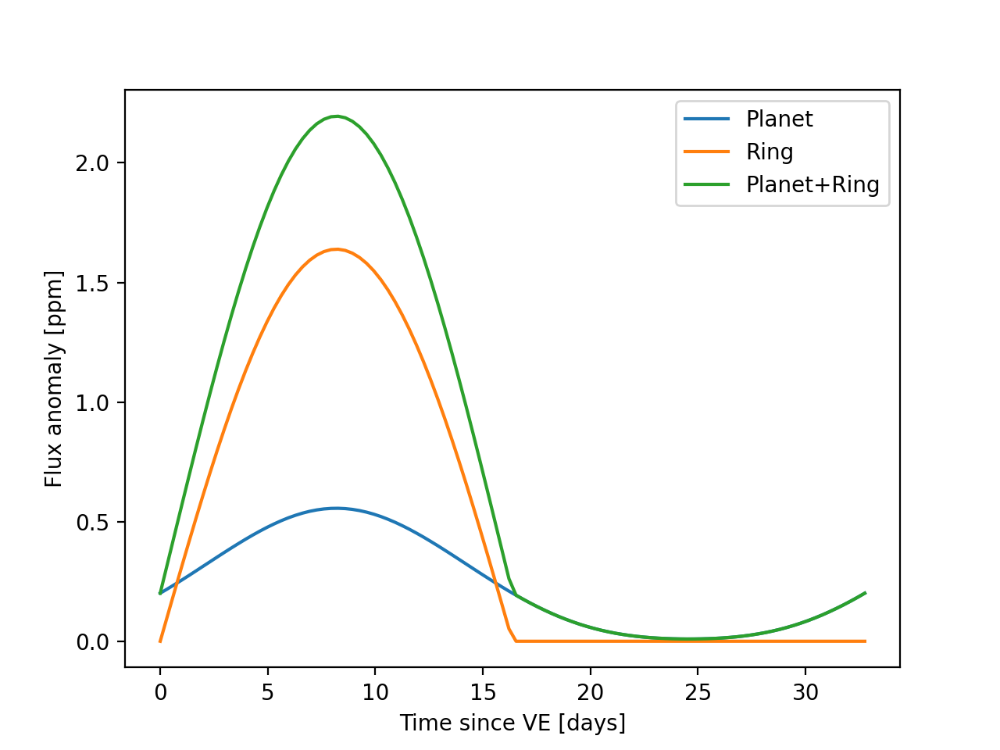

In [98]:
P.changeObserver([90*DEG,30*DEG])
lamb_initial=+0.0*DEG
lamb_final=+360*DEG
lambs=np.linspace(lamb_initial,lamb_final,100)
Rps=[]
Rrs=[]
ts=[]
for lamb in lambs:
    P.changeStellarPosition(lamb)
    ts+=[P.t*P.CU.UT]
    P.updateOpticalFactors()
    P.updateDiffuseReflection()
    Rps+=[P.Rip.sum()]
    Rrs+=[P.Rir.sum()]
    
ts=np.array(ts)
Rps=np.array(Rps)
Rrs=np.array(Rrs)

#Middle transit
ts=(ts-ts[0])/Const.days

#Plot
fig=plt.figure()
ax=fig.gca()    
ax.plot(ts,1e6*Rps,label="Planet")
ax.plot(ts,1e6*Rrs,label="Ring")
ax.plot(ts,1e6*(Rps+Rrs),label="Planet+Ring")

ax.set_xlabel("Time since VE [days]")
ax.set_ylabel("Flux anomaly [ppm]")

ax.legend();

Now including shadows:

In [99]:
P=RingedPlanet(Nr=1000,Np=1000,Nb=0,i=10*DEG,
               a=0.1,e=0.5,lambq=180*DEG,
               physics=dict(AL=1,AS=1,taug=1))

<IPython.core.display.Javascript object>


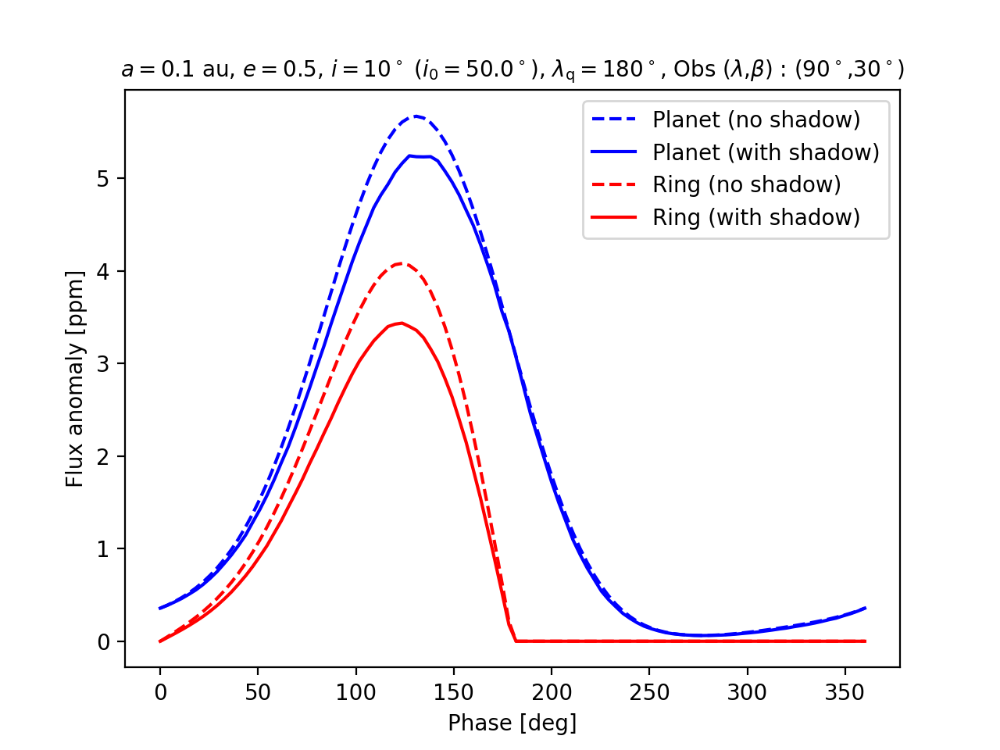

In [100]:
P.changeObserver([90*DEG,30*DEG])

title=f"$a={P.a:g}$ au, $e={P.e:g}$, $i={P.i*RAD:g}^\circ$ ($i_0={P.io*RAD:.1f}^\circ$), $\lambda_\mathrm{{q}}={P.lambq*RAD:g}^\circ$, Obs ($\lambda$,$\\beta$) : ({P.eobs_ecl[0]*RAD:g}$^\circ$,{P.eobs_ecl[1]*RAD:g}$^\circ$)"
lamb_initial=+0.0*DEG
lamb_final=+360*DEG
lambs=np.linspace(lamb_initial,lamb_final,100)
Rps_noshadow=[]
Rrs_noshadow=[]
Rps_wshadow=[]
Rrs_wshadow=[]
S=[]

ts=[]
for lamb in lambs:
    P.changeStellarPosition(lamb)
    ts+=[P.t*P.CU.UT]
    
    P.behavior["shadows"]=0
    P._updateIllumination()
    P._updateVisibility()
    P._updateActivity()
    P.updateOpticalFactors()
    P.updateDiffuseReflection()
    Rps_noshadow+=[P.Rip.sum()]
    Rrs_noshadow+=[P.Rir.sum()]
    
    P.behavior["shadows"]=1
    P._updateIllumination()
    P._updateVisibility()
    P._updateActivity()
    P.updateOpticalFactors()
    P.updateDiffuseReflection()
    Rps_wshadow+=[P.Rip.sum()]
    Rrs_wshadow+=[P.Rir.sum()]
    
    P.updateTransit()
    S+=[P.Rip.sum()+P.Rir.sum()-(P.Tip.sum()+P.Tir.sum())]

ts=np.array(ts)
Rps_noshadow=np.array(Rps_noshadow)
Rrs_noshadow=np.array(Rrs_noshadow)
Rps_wshadow=np.array(Rps_wshadow)
Rrs_wshadow=np.array(Rrs_wshadow)
S=np.array(S)

#Middle transit
ts=(ts-ts[0])/Const.days

#Plot
fig=plt.figure()
ax=fig.gca()    
ax.plot(lambs*RAD,1e6*Rps_noshadow,'b--',label="Planet (no shadow)")
ax.plot(lambs*RAD,1e6*Rps_wshadow,'b-',label="Planet (with shadow)")
ax.plot(lambs*RAD,1e6*Rrs_noshadow,'r--',label="Ring (no shadow)")
ax.plot(lambs*RAD,1e6*Rrs_wshadow,'r-',label="Ring (with shadow)")

ax.set_xlabel("Phase [deg]")
ax.set_ylabel("Flux anomaly [ppm]")
ax.set_title(title,fontsize=10)

ax.legend();

## About Pryngles Interfaces

`Pryngles` is a research package, designed and released at the pace of research. For the same reason, it has evolved in a different way to professional software.

Due to historical (the history of development) reasons `Pryngles` has two interfaces.  Interfaces differ in many aspects, some of them are superficial others are more deep and are related to the design of the package, even with the physics involved.  The interfaces are:

- **System Interface**. This is the newest interface. In this interface we use the `snake_case` naming convention for methods. The interface is loaded using:

  ```python
  import pryngles as pr
  sys=pr.System()
  ```

- **RingedPlaned Interface**. This was the first interface developed in Pryngles.  For the same reason is the most tested Interface and the one that has been currently used to produce research results.  This interface is loaded when the package is imported as:

  ```python
  import pryngles as pr
  RP=pr.RingedPlanet()
  ```

These interfaces are in the present version of the package somewhat compatible.  The following commands show how to define a RingedPlanet starting with the System interface:

```python
sys=pr.System()
S=sys.add(kind="Star",
          physics=dict(radius=Consts.rsun/sys.ul),
          optics=dict(limb_coeffs=[0.65])
         )
P=sys.add(kind="Planet",primary=S,
          orbit=dict(a=0.2,e=0.0),
          physics=dict(radius=Consts.rsaturn/sys.ul)
         )
R=sys.add(kind="Ring",primary=P,
          physics=dict(fi=1.5,fe=2.5,i=30*Consts.deg)
         )
O=sys.add(kind="Observer",
          optics=dict(lamb=90*Consts.deg,beta=90*Consts.deg)
         )
RP=sys.ensamble_system()
```
  
Although a complete guide to the RingedPlanet interface is at the end of this tutorial, we focus here on the System interface.

--- 
*The authors*, Last update: july 26, 2022.